In [6]:
%load_ext autoreload
%autoreload 1
%autosave 60

Autosaving every 60 seconds


In [7]:
import sys
import pandas as pd
import numpy as np
import importlib
import matplotlib.pyplot as plt
import matplotlib.colors as clr
import seaborn as sb
from scipy import stats
from sklearn.decomposition import PCA
import scanpy
from anndata import AnnData
import umap
import anndata
from matplotlib.colors import LogNorm,PowerNorm
from difflib import SequenceMatcher
from adjustText import adjust_text
import itertools
from sklearn.mixture import GaussianMixture
import matplotlib.scale as mscale
import matplotlib.transforms as mtransforms
import matplotlib.ticker as ticker
from matplotlib import colors
import ast
import matplotlib.cm as cm 
from scipy.stats import norm
import matplotlib.collections as mcoll
from Levenshtein import distance as levenshtein_distance


In [8]:
import matplotlib.scale as mscale
import matplotlib.pyplot as plt
import matplotlib.transforms as mtransforms
import matplotlib.ticker as ticker
import numpy as np

class SquareRootScale(mscale.ScaleBase):
    """
    ScaleBase class for generating square root scale.
    """
 
    name = 'squareroot'
 
    def __init__(self, axis, **kwargs):
        # note in older versions of matplotlib (<3.1), this worked fine.
        # mscale.ScaleBase.__init__(self)

        # In newer versions (>=3.1), you also need to pass in `axis` as an arg
        mscale.ScaleBase.__init__(self, axis)
 
    def set_default_locators_and_formatters(self, axis):
        axis.set_major_locator(ticker.AutoLocator())
        axis.set_major_formatter(ticker.ScalarFormatter())
        axis.set_minor_locator(ticker.NullLocator())
        axis.set_minor_formatter(ticker.NullFormatter())

    def limit_range_for_scale(self, vmin, vmax, minpos):
        return  vmin, vmax
 
    class SquareRootTransform(mtransforms.Transform):
        input_dims = 1
        output_dims = 1
        is_separable = True
 
        def transform_non_affine(self, a): 
            return (np.abs(a)**0.7) * np.sign(a)
 
        def inverted(self):
            return SquareRootScale.InvertedSquareRootTransform()
 
    class InvertedSquareRootTransform(mtransforms.Transform):
        input_dims = 1
        output_dims = 1
        is_separable = True
 
        def transform(self, a):
            return
 
        def inverted(self):
            return SquareRootScale.SquareRootTransform()
 
    def get_transform(self):
        return self.SquareRootTransform()

mscale.register_scale(SquareRootScale)

In [9]:
class SquareScale(mscale.ScaleBase):
    """
    ScaleBase class for generating square scale.
    """
 
    name = 'square'
 
    def __init__(self, axis, **kwargs):
        # note in older versions of matplotlib (<3.1), this worked fine.
        # mscale.ScaleBase.__init__(self)

        # In newer versions (>=3.1), you also need to pass in `axis` as an arg
        mscale.ScaleBase.__init__(self, axis)
 
    def set_default_locators_and_formatters(self, axis):
        axis.set_major_locator(ticker.AutoLocator())
        axis.set_major_formatter(ticker.ScalarFormatter())
        axis.set_minor_locator(ticker.NullLocator())
        axis.set_minor_formatter(ticker.NullFormatter())
 
    def limit_range_for_scale(self, vmin, vmax, minpos):
        return  vmin, vmax
 
    class SquareTransform(mtransforms.Transform):
        input_dims = 1
        output_dims = 1
        is_separable = True
 
        def transform_non_affine(self, a): 
            return (np.abs(a)**2) * np.sign(a)
 
        def inverted(self):
            return SquareScale.InvertedSquareTransform()
 
    class InvertedSquareTransform(mtransforms.Transform):
        input_dims = 1
        output_dims = 1
        is_separable = True
 
        def transform(self, a):
            return
 
        def inverted(self):
            return SquareScale.SquareTransform()
 
    def get_transform(self):
        return self.SquareTransform()

mscale.register_scale(SquareScale)

In [10]:
def colorline(
        x, y, z=None, cmap='copper', norm=plt.Normalize(0.0, 1.0),
        linewidth=3, alpha=1.0):
    """
    http://nbviewer.ipython.org/github/dpsanders/matplotlib-examples/blob/master/colorline.ipynb
    http://matplotlib.org/examples/pylab_examples/multicolored_line.html
    Plot a colored line with coordinates x and y
    Optionally specify colors in the array z
    Optionally specify a colormap, a norm function and a line width
    """

    # Default colors equally spaced on [0,1]:
    if z is None:
        z = np.linspace(0.0, 1.0, len(x))

    # Special case if a single number:
    # to check for numerical input -- this is a hack
    if not hasattr(z, "__iter__"):
        z = np.array([z])

    z = np.asarray(z)

    segments = make_segments(x, y)
    lc = mcoll.LineCollection(segments, array=z, cmap=cmap, norm=norm,
                              linewidth=linewidth, alpha=alpha)

    ax = plt.gca()
    ax.add_collection(lc)

    return lc

def make_segments(x, y):
    """
    Create list of line segments from x and y coordinates, in the correct format
    for LineCollection: an array of the form numlines x (points per line) x 2 (x
    and y) array
    """

    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    return segments


In [11]:
sys.path.append("/u/davidm/Documents/Master-thesis/Scripts/RNA-seq/python/")

In [12]:
import rnaseq
importlib.reload(rnaseq)

<module 'rnaseq' from '/u/davidm/Documents/Master-thesis/Scripts/RNA-seq/python/rnaseq/__init__.py'>

In [13]:
def hammingDist(str1, str2, fillchar = '-'):
    return sum([ch1 != ch2 for (ch1,ch2) in itertools.zip_longest(str1, str2, fillvalue = fillchar)])

In [14]:
def DFS(neighbors_mtx, component, barcode, visited):

    visited[barcode] = True
    component.append(barcode)
    
    neighbors = neighbors_mtx.index.values[neighbors_mtx[barcode] == 1]
    for neighbor in neighbors :
        if visited[neighbor][0] == False:
            component = DFS(neighbors_mtx, component, neighbor, visited)
    return component


def connectedComponents(neighbors_mtx) :
    
    barcodes = neighbors_mtx.index.values
    visited = pd.DataFrame([np.repeat(False, len(barcodes))], columns = barcodes, index = ["visited"])
    all_components = []

    for barcode in barcodes :
        if visited[barcode][0] == False:
            component = []
            all_components.append(DFS(neighbors_mtx, component, barcode, visited))
    
    i = np.argsort([len(c) for c in all_components])[::-1]
    
    return np.array(all_components, dtype = object)[i]

In [15]:
def get_intended_barcodes(errors_dict, barcodes) :
    
    intended_list = []
    errors_list = []
    for intended, erroneous in errors_dict.items(): 
        for barcode in erroneous :
            if barcode in barcodes :
                errors_list.append(barcode)
                intended_list.append(intended)
    
    return np.array(intended_list), np.array(errors_list)

In [16]:
def get_whitelist(libs) :
    
    barcodes = libs.index
    whitelist = []
    errors = []
    correction_dict = {}

#     neighbors_mtx = np.empty((len(barcodes), len(barcodes)))  
#     for i in range(len(neighbors_mtx)) :
#         barcode1 = sc.obs["CB"].values[i]
#         neighbors_mtx[i] = [hammingDist(barcode1, barcode2) == 1 for barcode2 in sc.obs_names]
#     neighbors_mtx = pd.DataFrame(neighbors_mtx, columns = barcodes, index = barcodes, dtype=int)

    neighbors_mtx = np.empty((len(barcodes), len(barcodes)))  
    for i in range(len(neighbors_mtx)) :
        barcode1 = sc.obs["CB"].values[i]
        neighbors_mtx[i] = [barcode1 != barcode2 and ((hammingDist(barcode1, barcode2) == 1) \
                            or (levenshtein_distance(barcode1[:-1], barcode2) == 1) \
                            or (levenshtein_distance(barcode1, barcode2[:-1]) == 1)) for barcode2 in sc.obs_names]
    neighbors_mtx = pd.DataFrame(neighbors_mtx, columns = barcodes, index = barcodes, dtype=int)
    


#     neighbors_mtx = np.empty((len(barcodes), len(barcodes)))  
#     for i in range(len(neighbors_mtx)) :
#         barcode1 = sc.obs["CB"].values[i]
#         neighbors_mtx[i] = [hammingDist(barcode1, barcode2) > 1 \
#                             and ((levenshtein_distance(barcode1[:-1], barcode2) == 1) \
#                             or (levenshtein_distance(barcode1, barcode2[:-1]) == 1)) for barcode2 in sc.obs_names]
#     neighbors_mtx = pd.DataFrame(neighbors_mtx, columns = barcodes, index = barcodes, dtype=int)
    
    all_components = connectedComponents(neighbors_mtx)
    
    for component in all_components :
                
        if len(component) == 1 :
            whitelist.append(component[0])
        else :
            sorting_df = pd.DataFrame(np.array([libs.loc[component].values.ravel()]).T,\
                                      columns = ["seq_depth"], index = component)
            sorted_comp = sorting_df.sort_values(by=["seq_depth"], ascending=False).index.values
            barcode = sorted_comp[0]
            whitelist.append(barcode)
            errors.append(sorted_comp[1:])
            neighbors = neighbors_mtx.loc[barcode][sorted_comp]
            neighbors = neighbors.index.values[neighbors == 1]
            correction_dict[barcode] = neighbors

    
    return all_components, correction_dict, whitelist, np.concatenate(errors)

In [17]:
def DFS(adata, component, barcode, visited):

    visited[barcode] = True
    component.append(barcode)
    
    neighbors = np.intersect1d(adata.obs["CB"].tolist(), adata.obs["neighbors"].loc[barcode].tolist())
    for neighbor in neighbors :
        if visited[neighbor][0] == False:
            component = DFS(adata, component, neighbor, visited)
    return component


def connectedComponents(adata) :
    
    barcodes = adata.obs["CB"].tolist()
    visited = pd.DataFrame([np.repeat(False, len(barcodes))], columns = barcodes, index = ["visited"])
    all_components = []

    for barcode in barcodes :
        if visited[barcode][0] == False:
            component = []
            all_components.append(DFS(adata, component, barcode, visited))
    
    i = np.argsort([len(c) for c in all_components])[::-1]
    
    return np.array(all_components, dtype = object)[i]

def get_whitelist(adata) :
    
    barcodes = adata.obs["CB"].tolist()
    whitelist = []
    errors = []
    correction_dict = {}

    
    all_components = connectedComponents(adata)
    
    for component in all_components :
                
        if len(component) == 1 :
            whitelist.append(component[0])
        else :
            sorting_df = adata.obs["raw_cb_freq"].loc[component]
            sorted_comp = sorting_df.sort_values(ascending=False).index.values
            barcode = sorted_comp[0]
            whitelist.append(barcode)
            errors.append(sorted_comp[1:])
            neighbors = np.intersect1d(sorted_comp[1:], adata.obs["neighbors"].loc[barcode])
            correction_dict[barcode] = neighbors

    
    return all_components, correction_dict, whitelist, np.concatenate(errors)

In [18]:
"CCTTGTCGCGTG" in correction_dict["CCTTGTCGCGTG"]

NameError: name 'correction_dict' is not defined

In [ ]:
len(np.unique(np.concatenate(list(correction_dict.values()))))

In [ ]:
connected_components

In [ ]:
# def plot_errors_1(correction_dict, good_barcodes = None, erroneous_barcodes = None, weight_by_lib = True) :
#     nucleotides = ["A","T","G","C"]
#     substitutions = {f"{pos}{nt1}": {nt2 : 0 for nt2 in nucleotides} for pos in np.arange(1,13) for nt1 in nucleotides}


#     for barcode1 in good_barcodes :
#         neighbors = neighbors_mtx.index[neighbors_mtx[barcode1] == 1]
#         barcode2 = np.argmax(sc.obs["raw_cb_freq"].loc[neighbors])
#         if barcode2 not in erroneous_barcodes :
#             continue
#         pos = [i for i in range(len(barcode1)) if barcode1[i] != barcode2[i]][0]
#         nt1 = list(barcode1)[pos]
#         nt2 = list(barcode2)[pos]
#         if weight_by_lib :
#             substitutions[f"{pos+1}{nt1}"][nt2] += sc.obs["raw_cb_freq"].loc[barcode2]
#         else :
#             substitutions[f"{pos+1}{nt1}"][nt2] += 1
    
#     counts = np.array([list(list(substitutions.values())[i].values()) for i in np.arange(48)])
#     fig, ax = plt.subplots(figsize=(5.5,2.5))
#     ax.set_prop_cycle('color', sb.color_palette("twilight_shifted", 4))
#     bottom = 0
#     for c in counts.T :
#         ax.bar(np.arange(48), c, width = 0.7, bottom = bottom)
#         bottom += c

#     ax.legend(labels = nucleotides)
#     plt.xticks(np.arange(48), labels = substitutions.keys(), rotation = 90)
#     plt.ylim(0,np.max(bottom)+np.max(bottom)/30)
#     plt.xlim(-1.5,48.5)
#     plt.tight_layout()

In [ ]:
def plot_errors(errors, libs, neighbors_mtx, weight_by_lib = True) :
    
    nucleotides = ["A","T","G","C"]
    substitutions = {f"{pos}{nt1}": {nt2 : 0 for nt2 in nucleotides} for pos in np.arange(1,13) for nt1 in nucleotides}

              
    for barcode2 in errors :
        
        neighbors = neighbors_mtx.index.values[neighbors_mtx[barcode2] == 1]
        if len(neighbors) == 0 :
            continue
        nn_df = pd.DataFrame(np.array([libs.loc[neighbors].values.ravel()]).T, columns = ["lib"], index = neighbors)
        sorted_nn = nn_df.sort_values(by=["lib"], ascending=False).index.values
        barcode1 = sorted_nn[0]

        pos = [i for i in range(len(barcode1)) if barcode1[i] != barcode2[i]][0]
        nt1 = list(barcode1)[pos]
        nt2 = list(barcode2)[pos]
        if weight_by_lib :
            substitutions[f"{pos+1}{nt1}"][nt2] += libs.loc[barcode2]
        else :
            substitutions[f"{pos+1}{nt1}"][nt2] += 1
    
    counts = np.array([list(list(substitutions.values())[i].values()) for i in np.arange(48)])
    fig, ax = plt.subplots(figsize=(5.5,2.5))
    ax.set_prop_cycle('color', sb.color_palette("twilight_shifted", 4))
    bottom = 0
    for c in counts.T :
        ax.bar(np.arange(48), c, width = 0.7, bottom = bottom)
        bottom += c

    ax.legend(labels = nucleotides)
    plt.xticks(np.arange(48), labels = substitutions.keys(), rotation = 90)
    plt.ylim(0,np.max(bottom)+np.max(bottom)/30)
    plt.xlim(-1.5,48.5)
    plt.tight_layout()

In [22]:
sample = "Sample_N705_-_ER1"
new_sample_name = "ER1"
# quant_params_ds = "downsampled-raw-reads/pc-decoys-k31-1.4.0/forceCells-3000-noWh"
# quant_params = "trimmed-reads-cutadapt/pc-no-decoys-k31-1.4.0/forceCells-3000-noWh"

quant_params = "trimmed-reads-cutadapt-all/decoys-k19-1.4.0/customWh-top-3000"
quant_params = "trimmed-reads-cutadapt-all/decoys-k19-1.4.0/forceCells-3000"

genref = "human/assembly__GRCh38-hg38/annotation__gencode/gencode_34"
project = "dsp779"
save_path = f"./figs/pyplot-{sample}"
prefix = f"pyplot_{sample}"

In [ ]:
def generate_neighbors(adata):
    
    n = []
    barcodes = adata.obs["CB"].tolist()

    for cb in barcodes :
        neighbors = []
        for pos in range(0,12) :
            for nt in "ATGC" :
                neighbor = cb[:pos] + nt + cb[pos:len(cb)-1] # insertion
                if neighbor != cb and hammingDist(cb, neighbor) != 1 :
                    neighbors.append(neighbor)
                neighbor = cb[:pos] + cb[pos+1:len(cb)] + nt # deletion
                if neighbor != cb and hammingDist(cb, neighbor) != 1 :
                    neighbors.append(neighbor)
#                 neighbor = cb[:pos] + nt + cb[pos+1:len(cb)]
#                 neighbors.append(neighbor)                     # substitution
        n.append(np.intersect1d(np.unique(neighbors), barcodes))
    adata.obs["neighbors"] = n

In [43]:
def generate_neighbors(barcodes):
    
    n = []
    for cb in barcodes :
        neighbors = []
        for pos in range(0,12) :
            for nt in "ATGC" :
                neighbor = cb[:pos] + nt + cb[pos:len(cb)-1] # insertion
                if neighbor != cb : #and hammingDist(cb, neighbor) != 1 :
                    neighbors.append(neighbor)
                neighbor = cb[:pos] + cb[pos+1:len(cb)] + nt # deletion
                if neighbor != cb : #and hammingDist(cb, neighbor) != 1 :
                    neighbors.append(neighbor)
#                 neighbor = cb[:pos] + nt + cb[pos+1:len(cb)]
#                 neighbors.append(neighbor)                     # substitution
        n.append(np.unique(neighbors))
    return n

In [624]:
cb

'ATT'

In [623]:
cb[:2] + nt + cb[2+1:len(cb)]

'ATC'

In [51]:
len(generate_neighbors(["AA"])[0])

10

In [25]:
sc.obs

,CB,CorrectedReads,MappedReads,DeduplicatedReads,MappingRate,DedupRate,MeanByMax,NumGenesExpressed,NumGenesOverMean,mRnaFraction,rRnaFraction,raw_cb_freq,samples,project_id,neighbors
GACGCCAAGAAA,GACGCCAAGAAA,1945173,1585256,23959,0.814969,0.984886,0.018732,4834,951,0.0,0.038936,1920273,Sample_N705_-_ER1,dsp779,"[GACGCCAAAAAA, GACGCCAAGAAC]"
CCGCGCTTGAGC,CCGCGCTTGAGC,1858088,1429226,29573,0.769192,0.979308,0.013963,5821,860,0.0,0.051420,1825505,Sample_N705_-_ER1,dsp779,[CCGCGCTTGAGA]
CCCGAAGGATCC,CCCGAAGGATCC,1596991,1238932,22122,0.775791,0.982144,0.011824,5392,944,0.0,0.025338,1564769,Sample_N705_-_ER1,dsp779,"[CCCGAAGGATAC, CCCGAAGGATCA]"
CAGTGACTATCT,CAGTGACTATCT,1586323,1275621,24054,0.804137,0.981143,0.019911,5231,991,0.0,0.044094,1558145,Sample_N705_-_ER1,dsp779,"[AGTGACTATCTG, CAGTGACTATCA]"
CAAAGCTCCTTC,CAAAGCTCCTTC,1165452,913460,16328,0.783782,0.982125,0.016884,4637,894,0.0,0.045096,1140054,Sample_N705_-_ER1,dsp779,[CAAAGCTCCTTA]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CAGCCAGTTGGC,CAGCCAGTTGGC,4216,2691,75,0.638283,0.972129,0.136612,61,7,0.0,0.133333,3249,Sample_N705_-_ER1,dsp779,[]
GAGACGGGCCGC,GAGACGGGCCGC,3745,2285,65,0.610147,0.971554,0.232143,56,8,0.0,0.107692,3249,Sample_N705_-_ER1,dsp779,[]
GTTGTGGGAAAC,GTTGTGGGAAAC,5089,3466,101,0.681077,0.970860,0.081125,83,6,0.0,0.163366,3249,Sample_N705_-_ER1,dsp779,[]
CGGTCCCTGGGC,CGGTCCCTGGGC,3390,2313,107,0.682301,0.953740,0.117582,91,10,0.0,0.112150,3249,Sample_N705_-_ER1,dsp779,[]


In [670]:
np.sum([len(n) > 0 for n in sc.obs["neighbors"]])

185

### Plotting parameters

In [429]:
%matplotlib inline
plt.rcParams['figure.dpi'] = 110
plt.rcParams['font.size'] = 6

### Alevin 

In [23]:
sc = rnaseq.readwrite.read_raw(project_id  = project, quant_tool = "alevin", samples = sample, genes_id = "ensembl_gene_id", quant_params = quant_params, genref = genref, cdna = "3' tag", exp = "sc")
sc._inplace_subset_obs(np.argsort(sc.obs["raw_cb_freq"].values)[::-1][:3000])
# wh = np.loadtxt("/home/arion/davidm/Data/datasets/raw/private/RNA-seq/sc/dsp779/quant/alevin/human/assembly__GRCh38-hg38/annotation__gencode/gencode_34/trimmed-reads-cutadapt/pc-decoys-k31-1.4.0/default/Sample_N705_-_ER1/alevin/whitelist.txt", dtype=str)
sc.obs_names = sc.obs["CB"].tolist()
# sc._inplace_subset_obs(wh)

/home/arion/davidm/Data/datasets/raw/private/RNA-seq/sc/dsp779/quant/alevin/human/assembly__GRCh38-hg38/annotation__gencode/gencode_34/trimmed-reads-cutadapt-all/decoys-k19-1.4.0/forceCells-3000
Using BioMart Ensembl Genes 100 hsapiens_gene_ensembl for gene annotations.


In [534]:
barcodes = sc.obs_names

In [484]:
rnaseq.setup.annotate_samples(sc, samples_annot_name = "total_UMIs", samples_annot = sc.X.toarray().sum(1).ravel(), ow=True)
rnaseq.setup.annotate_samples(sc, samples_annot_name = "mt_frac")

Annotating total_UMIs...
Annotating mt_frac...
chromosome_name already annotated. Set ow = True if you want to overwrite.


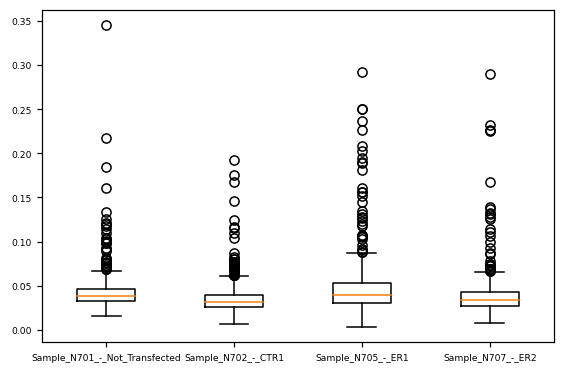

In [485]:
plt.boxplot([sc.obs.loc[sc.obs_names[sc.obs["samples"] == s]]["mt_frac"] for s in np.unique(sc.obs["samples"])], labels=np.unique(sc.obs["samples"]));

In [17]:
# nd = sc.X.toarray()

In [433]:
rnaseq.setup.annotate_samples(sc, samples_annot_name = "total_UMIs", samples_annot = sc.X.toarray().sum(1).ravel(), ow=True)
rnaseq.setup.annotate_samples(sc, samples_annot_name = "max_corr", ow=True)
rnaseq.setup.annotate_samples(sc, samples_annot_name = "mt_frac")
rnaseq.setup.annotate_samples(sc, samples_annot_name = "rp_frac")

Annotating total_UMIs...
Annotating max_corr...
Normalization by total UMIs...
Log2 + 1 tranformation...
Annotating mt_frac...
Annotating chromosome_name using Biomart (Ensembl Genes 100, 'hsapiens_gene_ensembl')...
Annotating rp_frac...
Annotating external_gene_name using Biomart (Ensembl Genes 100, 'hsapiens_gene_ensembl')...


In [19]:
sc.X.shape

(3000, 20305)

In [647]:
libs = sc.obs["raw_cb_freq"]

connected_components, correction_dict, whitelist, errors = get_whitelist(libs)

print(f"{len(whitelist)} barcodes in the new whitelist")
print(f"{len(np.concatenate(list(correction_dict.values())))} of the {len(errors)} excluded barcodes will be corrected")

2267 barcodes in the new whitelist
681 of the 733 excluded barcodes will be corrected


In [648]:
len(connected_components)

2267

In [656]:
connected_components, correction_dict, whitelist, errors = get_whitelist(sc)

print(f"{len(whitelist)} barcodes in the new whitelist")
print(f"{len(np.concatenate(list(correction_dict.values())))} of the {len(errors)} excluded barcodes will be corrected")

2267 barcodes in the new whitelist
681 of the 733 excluded barcodes will be corrected


In [652]:
len(np.unique(np.concatenate(list(correction_dict.values()))))

915

In [644]:
len(connected_components)

2611

In [166]:
len(errors) + len(correction_dict.keys())

965

In [819]:
neighbors_mtx = np.empty((len(sc.obs_names), len(sc.obs_names)))  
for i in range(len(neighbors_mtx)) :
    barcode1 = sc.obs_names.values[i]
    neighbors_mtx[i] = [(hammingDist(barcode1, barcode2) == 1) for barcode2 in sc.obs_names]
neighbors_mtx = pd.DataFrame(neighbors_mtx, columns = sc.obs_names, index = sc.obs_names, dtype=int)

In [619]:
neighbors_mtx = np.empty((len(sc.obs_names), len(sc.obs_names)))  
for i in range(len(neighbors_mtx)) :
    barcode1 = sc.obs_names.values[i]
    neighbors_mtx[i] = [(hammingDist(barcode1, barcode2) == 2) for barcode2 in sc.obs_names]
neighbors_mtx = pd.DataFrame(neighbors_mtx, columns = sc.obs_names, index = sc.obs_names, dtype=int)

In [894]:
neighbors_mtx = np.empty((len(sc.obs_names), len(sc.obs_names)))  
for i in range(len(neighbors_mtx)) :
    barcode1 = sc.obs_names.values[i]
    neighbors_mtx[i] = [(hammingDist(barcode1, barcode2) == 1) \
                        or (levenshtein_distance(barcode1[:-1], barcode2) == 1) \
                        or (levenshtein_distance(barcode1, barcode2[:-1]) == 1) for barcode2 in sc.obs_names]
neighbors_mtx = pd.DataFrame(neighbors_mtx, columns = sc.obs_names, index = sc.obs_names, dtype=int)

In [935]:
nucleotides = list("ATGC")
nn = []
for cb in sc.obs_names :
    n = []
    s = list(cb)
    for pos in range(len(s)-1) :
        for nt in nucleotides :
            l = s[:pos] + [nt] + s[pos:]
            n.append(('').join(l[:-1]))

    for pos in range(len(s)-1) :
        for nt in nucleotides :
            l = s[:pos] + s[pos+1:] + [nt]
            n.append(('').join(l))


    nn.append(len(np.unique(n)))

In [949]:
np.min(nn)

37

In [950]:
np.max(nn)

77

In [637]:
barcodes = whitelist

In [641]:
neighbors_mtx = np.empty((len(barcodes), len(barcodes)))  
for i in range(len(neighbors_mtx)) :
    barcode1 = barcodes[i]
    neighbors_mtx[i] = [hammingDist(barcode1, barcode2) == 1 for barcode2 in barcodes]
neighbors_mtx = pd.DataFrame(neighbors_mtx, columns = barcodes, index = barcodes, dtype=int)

In [642]:
# barcodes = sc.obs_names


n_neighbors = (neighbors_mtx > 0).sum(1)  
n_neighbors = pd.DataFrame(np.unique(n_neighbors, return_counts=True)).T

In [896]:
n_neighbors[1][1:].sum()

965

/tmp/ipykernel_30009/1612800804.py:8: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  plt.ylim(0,3000)


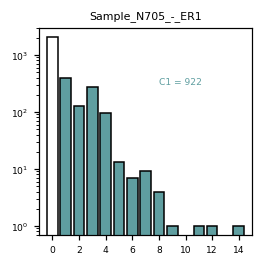

In [460]:
_,ax = plt.subplots(figsize=(2.5,2.5))
plt.title(sample)
plt.yscale('log')
ax.set_xticks(np.arange(0,15,2))
ax.bar(n_neighbors[0][0], n_neighbors[1][0], edgecolor = "black", color = "w");
ax.bar(n_neighbors[0][1:], n_neighbors[1][1:], color = "cadetblue", edgecolor = "black");
ax.text(8,300, f"C1 = {n_neighbors[1][1:].sum()}", color = "cadetblue");
plt.ylim(0,3000)
plt.xlim(-1,15)
plt.savefig(f"./figs/{prefix}_dist-nn.pdf");

/tmp/ipykernel_61013/1612800804.py:8: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  plt.ylim(0,3000)


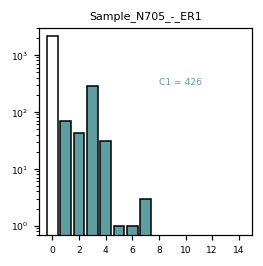

In [643]:
_,ax = plt.subplots(figsize=(2.5,2.5))
plt.title(sample)
plt.yscale('log')
ax.set_xticks(np.arange(0,15,2))
ax.bar(n_neighbors[0][0], n_neighbors[1][0], edgecolor = "black", color = "w");
ax.bar(n_neighbors[0][1:], n_neighbors[1][1:], color = "cadetblue", edgecolor = "black");
ax.text(8,300, f"C1 = {n_neighbors[1][1:].sum()}", color = "cadetblue");
plt.ylim(0,3000)
plt.xlim(-1,15)
plt.savefig(f"./figs/{prefix}_dist-nn.pdf");

In [435]:
# barcodes = sc.obs_names
# neighbors_mtx = np.empty((len(barcodes), len(barcodes)))  
# for i in range(len(neighbors_mtx)) :
#     barcode1 = barcodes[i]
#     neighbors_mtx[i] = [barcode1 != barcode2 and ((hammingDist(barcode1, barcode2) == 1) \
#                         or (levenshtein_distance(barcode1[:-1], barcode2) == 1) \
#                         or (levenshtein_distance(barcode1, barcode2[:-1]) == 1)) for barcode2 in barcodes]
# neighbors_mtx = pd.DataFrame(neighbors_mtx, columns = barcodes, index = barcodes, dtype=int)

In [436]:
gm = GaussianMixture(3, covariance_type="full")

X = np.array([sc.obs["DedupRate"].loc[errors]]).T

clusters = gm.fit_predict(X).astype(object)

means = pd.DataFrame({"cluster" : clusters, "dedup" : sc.obs["DedupRate"].loc[errors]}, dtype=float).groupby("cluster").mean()
sorted_cl_labels = means.sort_values(by="dedup").index.astype(int)


for cl, new_cl in zip(sorted_cl_labels, np.sort(sorted_cl_labels)) :
    clusters[clusters == cl] = str(new_cl)
    
    
sc.obs["clusters"] = np.repeat(None, sc.X.shape[0])
for barcode, cl in zip(errors, clusters) :
    sc.obs["clusters"].loc[barcode] = str(cl)

/u/davidm/VirtualEns/python_3.9.5/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [437]:
cl0 = sc.obs_names[sc.obs["clusters"] == "0"]
cl1 = sc.obs_names[sc.obs["clusters"] == "1"]
cl2 = sc.obs_names[sc.obs["clusters"] == "2"]

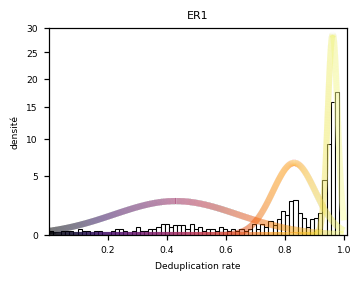

In [440]:
normalize = colors.TwoSlopeNorm(vmin=0., vcenter=.5, vmax=1)

plt.subplots(figsize=(3.5,2.5))

plt.hist(sc.obs["DedupRate"].loc[errors], bins = 70, color = "white", edgecolor = 'black', linewidth = 0.7, density=True);
plt.xlabel("Deduplication rate");
plt.ylabel("densité");


x_axis = np.arange(0, 1, 0.0001)
colorline(x_axis, norm.pdf(x_axis, gm.means_[0][0], np.sqrt(gm.covariances_[0][0])), cmap='inferno', norm=normalize, alpha = 0.6, linewidth=4)
colorline(x_axis, norm.pdf(x_axis, gm.means_[1][0], np.sqrt(gm.covariances_[1][0])), cmap='inferno', norm=normalize, alpha=0.6, linewidth=4)
colorline(x_axis, norm.pdf(x_axis, gm.means_[2][0], np.sqrt(gm.covariances_[2][0])), cmap='inferno', norm=normalize, alpha=0.6, linewidth=4)

plt.title("ER1")
plt.yscale("squareroot")
plt.ylim(0,30)
plt.xlim(0,1.01)
plt.xticks([0.2,0.4,0.6,0.8,1.0])
plt.savefig(f"./figs/{prefix}_distrib_dedup.pdf")

In [341]:
i_corr_max = np.argsort(np.corrcoef(sc.X.toarray()), axis = 0)[-2]
barcodes_corr_max = pd.DataFrame(sc.obs["CB"].values[i_corr_max], index = sc.obs["CB"].values)

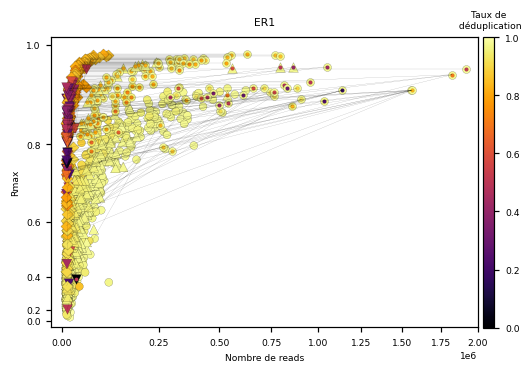

In [342]:
fig, ax = plt.subplots(figsize=(5,3.5))


# sc.obs["phred"] = total_scores.mean(1)
# color = "phred"
color = "DedupRate"
lib_type = "raw_cb_freq"
# lib_type = "total_UMIs"

# cmap = "cividis"
cmap = "inferno"
norm = colors.TwoSlopeNorm(vmin=0., vcenter=.5, vmax=1)
s = 27

edgecolors = []
linewidths = []
markers = []
sizes = []
cl0 = sc.obs_names[sc.obs["clusters"] == "0"]
cl1 = sc.obs_names[sc.obs["clusters"] == "1"]

            
for barcode in sc.obs_names :

    if barcode not in errors :
        markers.append('o')
        sizes.append(s)
    elif barcode in cl2 :
            markers.append('^')
            sizes.append(s*1.5)
    elif barcode in cl1 :
            markers.append('D')
            sizes.append(s)
    elif barcode in cl0 :
            markers.append('v')
            sizes.append(s*1.5)
            
sc.obs["marker"] = np.array(markers)
sc.obs["markersize"] = np.array(sizes)


i = 0
scatt_others = list(sc.obs_names)
for barcode in cl1 :
    neighbors = neighbors_mtx.loc[barcode]
    neighbors = neighbors.index.values[neighbors == 1]
    Rmax = barcodes_corr_max.loc[barcode][0]
    if Rmax in neighbors and sc.obs["max_corr"].loc[barcode] > 0 : # and sc.obs[lib_type].loc[Rmax] < 35000: 
        x = (sc.obs[lib_type].loc[barcode], sc.obs[lib_type].loc[Rmax])
        y = (sc.obs["max_corr"].loc[barcode], sc.obs["max_corr"].loc[Rmax])
        ax.plot(x,y, linewidth = 0.1, color = "black", label = "max R & hd =1 with gm1" if i == 0 else "", zorder = 7, alpha = 0.5)
        if Rmax in scatt_others :
            scatt_others.remove(Rmax)
            ax.scatter(sc.obs[lib_type].loc[Rmax], sc.obs["max_corr"].loc[Rmax], marker = sc.obs.loc[Rmax]["marker"], s = sc.obs.loc[Rmax]["markersize"], c = sc.obs[color].loc[Rmax], edgecolors = 'black', linewidths = 0.1, cmap = cmap, norm = norm, zorder = 5)
            ax.scatter(sc.obs[lib_type].loc[Rmax], sc.obs["max_corr"].loc[Rmax], marker = '.', c = sc.obs[color].loc[barcode], \
                       edgecolors = 'black', linewidths = 0.05, cmap = cmap, norm = norm, s = 25, zorder = 5)
        if barcode in scatt_others : 
            scatt_others.remove(barcode)
            ax.scatter(sc.obs[lib_type].loc[barcode], sc.obs["max_corr"].loc[barcode], marker = sc.obs.loc[barcode]["marker"], s = sc.obs.loc[barcode]["markersize"], c = sc.obs[color].loc[barcode], edgecolors = 'black', linewidths = 0.1, cmap = cmap, norm = norm, zorder = 6)
        i += 1
            

i = 0
for barcode in cl0 :
    neighbors = neighbors_mtx.loc[barcode]
    neighbors = neighbors.index.values[neighbors == 1]
    Rmax = barcodes_corr_max.loc[barcode][0]
    if Rmax in neighbors and sc.obs["max_corr"].loc[barcode] > 0 : # and sc.obs[lib_type].loc[Rmax] < 35000: 
        x = (sc.obs[lib_type].loc[barcode], sc.obs[lib_type].loc[Rmax])
        y = (sc.obs["max_corr"].loc[barcode], sc.obs["max_corr"].loc[Rmax])
        ax.plot(x,y, linewidth = 0.1, color = "black", label = "max R & hd =1 with gm1" if i == 0 else "", zorder = 7, alpha = 0.5)
        if Rmax in scatt_others :
            scatt_others.remove(Rmax)
            ax.scatter(sc.obs[lib_type].loc[Rmax], sc.obs["max_corr"].loc[Rmax], marker = sc.obs.loc[Rmax]["marker"], s = sc.obs.loc[Rmax]["markersize"], c = sc.obs[color].loc[Rmax], edgecolors = 'black', linewidths = 0.1, cmap = cmap, norm = norm, zorder = 5)
            ax.scatter(sc.obs[lib_type].loc[Rmax], sc.obs["max_corr"].loc[Rmax], marker = '.', c = sc.obs[color].loc[barcode], \
                       edgecolors = 'black', linewidths = 0.05, cmap = cmap, norm = norm, s = 25, zorder = 5)
        if barcode in scatt_others : 
            scatt_others.remove(barcode)
            ax.scatter(sc.obs[lib_type].loc[barcode], sc.obs["max_corr"].loc[barcode], marker = sc.obs.loc[barcode]["marker"], s = sc.obs.loc[barcode]["markersize"], c = sc.obs[color].loc[barcode], edgecolors = 'black', linewidths = 0.1, cmap = cmap, norm = norm, zorder = 6)
        i += 1


ax.set_yscale("square")
ax.set_xscale("squareroot")
ax.set_xlim(xmin =-10000, xmax=2000000)
ax.set_ylim(ymin=-0.15, ymax=1.015)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))



rnaseq.plotting.scatter(sc.obs.loc[scatt_others][lib_type].values, sc.obs.loc[scatt_others]["max_corr"].values, sc.obs.loc[scatt_others][color].values, marker = sc.obs.loc[scatt_others]["marker"].values, \
            linewidth = 0.1, edgecolor = 'black', norm = norm, fig=fig, s = sc.obs.loc[scatt_others]["markersize"].values, \
            cmap = cmap, order_color = "descending", order_marker = {'D':3, 'o':1, '^':2, 'v':4}, \
            color_title = "Taux de\n déduplication", xlabel = "Nombre de reads", ylabel = "Rmax", title = "ER1")    



plt.savefig(f"./figs/{prefix}_{lib_type}-max-corr_gm-clusters.pdf")

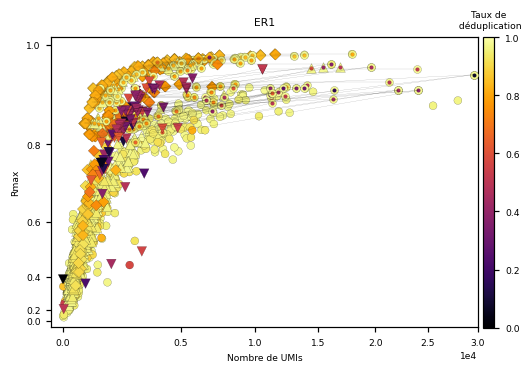

In [344]:
fig, ax = plt.subplots(figsize=(5,3.5))


# sc.obs["phred"] = total_scores.mean(1)
# color = "phred"
color = "DedupRate"
lib_type = "total_UMIs"

# cmap = "cividis"
cmap = "inferno"
norm = colors.TwoSlopeNorm(vmin=0., vcenter=.5, vmax=1)
s = 27

edgecolors = []
linewidths = []
markers = []
sizes = []
cl0 = sc.obs_names[sc.obs["clusters"] == "0"]
cl1 = sc.obs_names[sc.obs["clusters"] == "1"]

            
for barcode in sc.obs_names :

    if barcode not in errors :
        markers.append('o')
        sizes.append(s)
    elif barcode in cl2 :
            markers.append('^')
            sizes.append(s*1.5)
    elif barcode in cl1 :
            markers.append('D')
            sizes.append(s)
    elif barcode in cl0 :
            markers.append('v')
            sizes.append(s*1.5)
            
sc.obs["marker"] = np.array(markers)
sc.obs["markersize"] = np.array(sizes)


i = 0
scatt_others = list(sc.obs_names)
for barcode in cl1 :
    neighbors = neighbors_mtx.loc[barcode]
    neighbors = neighbors.index.values[neighbors == 1]
    Rmax = barcodes_corr_max.loc[barcode][0]
    if Rmax in neighbors and sc.obs["max_corr"].loc[barcode] > 0.8 : # and sc.obs[lib_type].loc[Rmax] < 35000: 
        x = (sc.obs[lib_type].loc[barcode], sc.obs[lib_type].loc[Rmax])
        y = (sc.obs["max_corr"].loc[barcode], sc.obs["max_corr"].loc[Rmax])
        ax.plot(x,y, linewidth = 0.1, color = "black", label = "max R & hd =1 with gm1" if i == 0 else "", zorder = 7, alpha = 0.5)
        ax.scatter(sc.obs[lib_type].loc[Rmax], sc.obs["max_corr"].loc[Rmax], marker = sc.obs.loc[Rmax]["marker"], \
                   s = sc.obs.loc[Rmax]["markersize"], c = sc.obs[color].loc[Rmax], edgecolors = 'black', linewidths = 0.1, \
                   cmap = cmap, norm = norm, zorder = 5)
        ax.scatter(sc.obs[lib_type].loc[Rmax], sc.obs["max_corr"].loc[Rmax], marker = '.', c = sc.obs[color].loc[barcode], \
                   edgecolors = 'black', linewidths = 0.05, cmap = cmap, norm = norm, s = 25, zorder = 5)
        ax.scatter(sc.obs[lib_type].loc[barcode], sc.obs["max_corr"].loc[barcode], marker = sc.obs.loc[barcode]["marker"], \
                   s = sc.obs.loc[barcode]["markersize"], c = sc.obs[color].loc[barcode], edgecolors = 'black', \
                   linewidths = 0.1, cmap = cmap, norm = norm, zorder = 5)
        i += 1
        if Rmax in scatt_others : scatt_others.remove(Rmax)
        if barcode in scatt_others : scatt_others.remove(barcode)
            

i = 0
scatt_others = list(sc.obs_names)
for barcode in cl0 :
    neighbors = neighbors_mtx.loc[barcode]
    neighbors = neighbors.index.values[neighbors == 1]
    Rmax = barcodes_corr_max.loc[barcode][0]
    if Rmax in neighbors and sc.obs["max_corr"].loc[barcode] > 0.8 : # and sc.obs[lib_type].loc[Rmax] < 35000: 
        x = (sc.obs[lib_type].loc[barcode], sc.obs[lib_type].loc[Rmax])
        y = (sc.obs["max_corr"].loc[barcode], sc.obs["max_corr"].loc[Rmax])
        ax.plot(x,y, linewidth = 0.1, color = "black", label = "max R & hd =1 with gm1" if i == 0 else "", zorder = 7, alpha = 0.5)
        ax.scatter(sc.obs[lib_type].loc[Rmax], sc.obs["max_corr"].loc[Rmax], marker = sc.obs.loc[Rmax]["marker"], s = sc.obs.loc[Rmax]["markersize"], c = sc.obs[color].loc[Rmax], edgecolors = 'black', linewidths = 0.1, cmap = cmap, norm = norm, zorder = 5)
        ax.scatter(sc.obs[lib_type].loc[Rmax], sc.obs["max_corr"].loc[Rmax], marker = '.', c = sc.obs[color].loc[barcode], \
                   edgecolors = 'black', linewidths = 0.05, cmap = cmap, norm = norm, s = 25, zorder = 5)
        ax.scatter(sc.obs[lib_type].loc[barcode], sc.obs["max_corr"].loc[barcode], marker = sc.obs.loc[barcode]["marker"], s = sc.obs.loc[barcode]["markersize"], c = sc.obs[color].loc[barcode], edgecolors = 'black', linewidths = 0.1, cmap = cmap, norm = norm, zorder = 6)
        i += 1
        if Rmax in scatt_others : scatt_others.remove(Rmax)
        if barcode in scatt_others : scatt_others.remove(barcode)


ax.set_yscale("square")
ax.set_xscale("squareroot")
ax.set_xlim(xmin =-170, xmax=30000)
ax.set_ylim(ymin=-0.15, ymax=1.015)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))



rnaseq.plotting.scatter(sc.obs.loc[scatt_others][lib_type].values, sc.obs.loc[scatt_others]["max_corr"].values, sc.obs.loc[scatt_others][color].values, marker = sc.obs.loc[scatt_others]["marker"].values, \
            linewidth = 0.1, edgecolor = 'black', norm = norm, fig=fig, s = sc.obs.loc[scatt_others]["markersize"].values, \
            cmap = cmap, order_color = "descending", order_marker = {'D':3, 'o':1, '^':2, 'v':4}, \
            color_title = "Taux de\n déduplication", xlabel = "Nombre de UMIs", ylabel = "Rmax", title = "ER1")    



plt.savefig(f"./figs/{prefix}_{lib_type}-max-corr_gm-clusters.pdf")

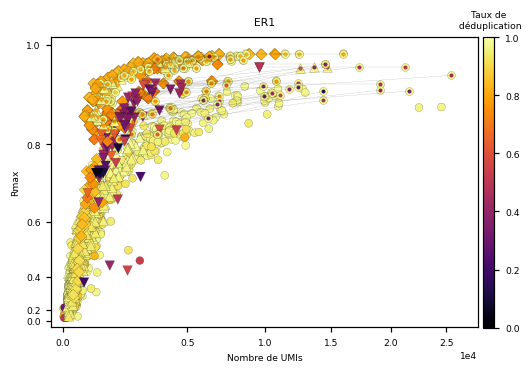

In [186]:
fig, ax = plt.subplots(figsize=(5,3.5))


# sc.obs["phred"] = total_scores.mean(1)
# color = "phred"
color = "DedupRate"
lib_type = "total_UMIs"

# cmap = "cividis"
cmap = "inferno"
norm = colors.TwoSlopeNorm(vmin=0., vcenter=.5, vmax=1)
s = 27

edgecolors = []
linewidths = []
markers = []
sizes = []
cl0 = sc.obs_names[sc.obs["clusters"] == "0"]
cl1 = sc.obs_names[sc.obs["clusters"] == "1"]

            
for barcode in sc.obs_names :

    if barcode not in errors :
        markers.append('o')
        sizes.append(s)
    elif barcode in cl2 :
            markers.append('^')
            sizes.append(s*1.5)
    elif barcode in cl1 :
            markers.append('D')
            sizes.append(s)
    elif barcode in cl0 :
            markers.append('v')
            sizes.append(s*1.5)
            
sc.obs["marker"] = np.array(markers)
sc.obs["markersize"] = np.array(sizes)


i = 0
scatt_others = list(sc.obs_names)
for barcode in cl1 :
    neighbors = neighbors_mtx.loc[barcode]
    neighbors = neighbors.index.values[neighbors == 1]
    Rmax = barcodes_corr_max.loc[barcode][0]
    if Rmax in neighbors and sc.obs["max_corr"].loc[barcode] > 0.8 : # and sc.obs[lib_type].loc[Rmax] < 35000: 
        x = (sc.obs[lib_type].loc[barcode], sc.obs[lib_type].loc[Rmax])
        y = (sc.obs["max_corr"].loc[barcode], sc.obs["max_corr"].loc[Rmax])
        ax.plot(x,y, linewidth = 0.1, color = "black", label = "max R & hd =1 with gm1" if i == 0 else "", zorder = 7, alpha = 0.5)
        ax.scatter(sc.obs[lib_type].loc[Rmax], sc.obs["max_corr"].loc[Rmax], marker = sc.obs.loc[Rmax]["marker"], \
                   s = sc.obs.loc[Rmax]["markersize"], c = sc.obs[color].loc[Rmax], edgecolors = 'black', linewidths = 0.1, \
                   cmap = cmap, norm = norm, zorder = 5)
        ax.scatter(sc.obs[lib_type].loc[Rmax], sc.obs["max_corr"].loc[Rmax], marker = '.', c = sc.obs[color].loc[barcode], \
                   edgecolors = 'black', linewidths = 0.05, cmap = cmap, norm = norm, s = 25, zorder = 5)
        ax.scatter(sc.obs[lib_type].loc[barcode], sc.obs["max_corr"].loc[barcode], marker = sc.obs.loc[barcode]["marker"], \
                   s = sc.obs.loc[barcode]["markersize"], c = sc.obs[color].loc[barcode], edgecolors = 'black', \
                   linewidths = 0.1, cmap = cmap, norm = norm, zorder = 5)
        i += 1
        if Rmax in scatt_others : scatt_others.remove(Rmax)
        if barcode in scatt_others : scatt_others.remove(barcode)
            

i = 0
scatt_others = list(sc.obs_names)
for barcode in cl0 :
    neighbors = neighbors_mtx.loc[barcode]
    neighbors = neighbors.index.values[neighbors == 1]
    Rmax = barcodes_corr_max.loc[barcode][0]
    if Rmax in neighbors and sc.obs["max_corr"].loc[barcode] > 0.8 : # and sc.obs[lib_type].loc[Rmax] < 35000: 
        x = (sc.obs[lib_type].loc[barcode], sc.obs[lib_type].loc[Rmax])
        y = (sc.obs["max_corr"].loc[barcode], sc.obs["max_corr"].loc[Rmax])
        ax.plot(x,y, linewidth = 0.1, color = "black", label = "max R & hd =1 with gm1" if i == 0 else "", zorder = 7, alpha = 0.5)
        ax.scatter(sc.obs[lib_type].loc[Rmax], sc.obs["max_corr"].loc[Rmax], marker = sc.obs.loc[Rmax]["marker"], s = sc.obs.loc[Rmax]["markersize"], c = sc.obs[color].loc[Rmax], edgecolors = 'black', linewidths = 0.1, cmap = cmap, norm = norm, zorder = 5)
        ax.scatter(sc.obs[lib_type].loc[Rmax], sc.obs["max_corr"].loc[Rmax], marker = '.', c = sc.obs[color].loc[barcode], \
                   edgecolors = 'black', linewidths = 0.05, cmap = cmap, norm = norm, s = 25, zorder = 5)
        ax.scatter(sc.obs[lib_type].loc[barcode], sc.obs["max_corr"].loc[barcode], marker = sc.obs.loc[barcode]["marker"], s = sc.obs.loc[barcode]["markersize"], c = sc.obs[color].loc[barcode], edgecolors = 'black', linewidths = 0.1, cmap = cmap, norm = norm, zorder = 6)
        i += 1
        if Rmax in scatt_others : scatt_others.remove(Rmax)
        if barcode in scatt_others : scatt_others.remove(barcode)


ax.set_yscale("square")
ax.set_xscale("squareroot")
ax.set_xlim(xmin =-170, xmax=28000)
ax.set_ylim(ymin=-0.15, ymax=1.015)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))



rnaseq.plotting.scatter(sc.obs.loc[scatt_others][lib_type].values, sc.obs.loc[scatt_others]["max_corr"].values, sc.obs.loc[scatt_others][color].values, marker = sc.obs.loc[scatt_others]["marker"].values, \
            linewidth = 0.1, edgecolor = 'black', norm = norm, fig=fig, s = sc.obs.loc[scatt_others]["markersize"].values, \
            cmap = cmap, order_color = "descending", order_marker = {'D':3, 'o':1, '^':2, 'v':4}, \
            color_title = "Taux de\n déduplication", xlabel = "Nombre de UMIs", ylabel = "Rmax", title = "ER1")    



plt.savefig(f"./figs/{prefix}_{lib_type}-max-corr_gm-clusters.pdf")

In [185]:
rnaseq.pp.log_norm(sc)
scanpy.pp.neighbors(sc, n_pcs=20)
scanpy.tl.umap(sc)

Normalization by total UMIs...
Log2 + 1 tranformation...
         Falling back to preprocessing with `sc.pp.pca` and default params.


In [355]:
project_path = "/home/arion/davidm/Data/datasets/raw/private/RNA-seq/sc/dsp779"
x = pd.read_csv(f"{project_path}/raw-fastqs/{sample}/new_umis.csv")
data = {}
for cb in x.columns :
    data[cb] = np.unique(np.concatenate([ast.literal_eval(x[cb].values[chunk]) for chunk in range(x.shape[0])]))

In [377]:
f = pd.read_csv(f"/home/arion/davidm/Data/datasets/raw/private/RNA-seq/sc/dsp779/quant/alevin/human/assembly__GRCh38-hg38/annotation__gencode/gencode_34/trimmed-reads-cutadapt-all/decoys-k19-1.4.0/default/{sample}/alevin/raw_cb_frequency.txt", delimiter='\t', index_col=0, header = None)

In [414]:
barcodes = sc.obs_names

# neighbors_mtx = np.empty((len(barcodes), len(barcodes)))  
# for i in range(len(neighbors_mtx)) :
#     barcode1 = barcodes[i]
#     neighbors_mtx[i] = [hammingDist(barcode1, barcode2) > 1 \
#                         and ((levenshtein_distance(barcode1[:-1], barcode2) == 1) \
#                         or (levenshtein_distance(barcode1, barcode2[:-1]) == 1)) for barcode2 in barcodes]
# neighbors_mtx = pd.DataFrame(neighbors_mtx, columns = barcodes, index = barcodes, dtype=int)


neighbors_mtx = np.empty((len(barcodes), len(barcodes)))  
for i in range(len(neighbors_mtx)) :
    barcode1 = sc.obs["CB"].values[i]
    neighbors_mtx[i] = [barcode1 != barcode2 and ((hammingDist(barcode1, barcode2) == 1) \
                        or (levenshtein_distance(barcode1[:-1], barcode2) == 1) \
                        or (levenshtein_distance(barcode1, barcode2[:-1]) == 1)) for barcode2 in sc.obs_names]
neighbors_mtx = pd.DataFrame(neighbors_mtx, columns = barcodes, index = barcodes, dtype=int)

In [415]:
cbs = neighbors_mtx.index[(neighbors_mtx == 1).sum(0) > 0]

In [361]:
len(cbs)

185

In [416]:
len(cbs)

967

In [417]:
i = 0

for cb in cbs :
    l = []
    for nt in "ATGC" :
        if cb[:-1]+nt in f.index :
            l.append(f.loc[cb[:-1]+nt])
    if np.sort(l)[0] > 0.1 * np.sum(l) and len(l) == 4 :
        i +=1

In [418]:
i

505

In [419]:
cbs_v = np.setdiff1d(sc.obs_names,cbs)

In [420]:
len(cbs_v)

2033

In [425]:
i = 0

for cb in cbs_v :
    l = []
    for nt in "ATGC" :
        if cb[:-1]+nt in f.index :
            l.append(f.loc[cb[:-1]+nt])
    if np.sort(l)[0] > 0.2 * np.sum(l) and len(l) == 4 :
        i +=1

In [427]:
i

307

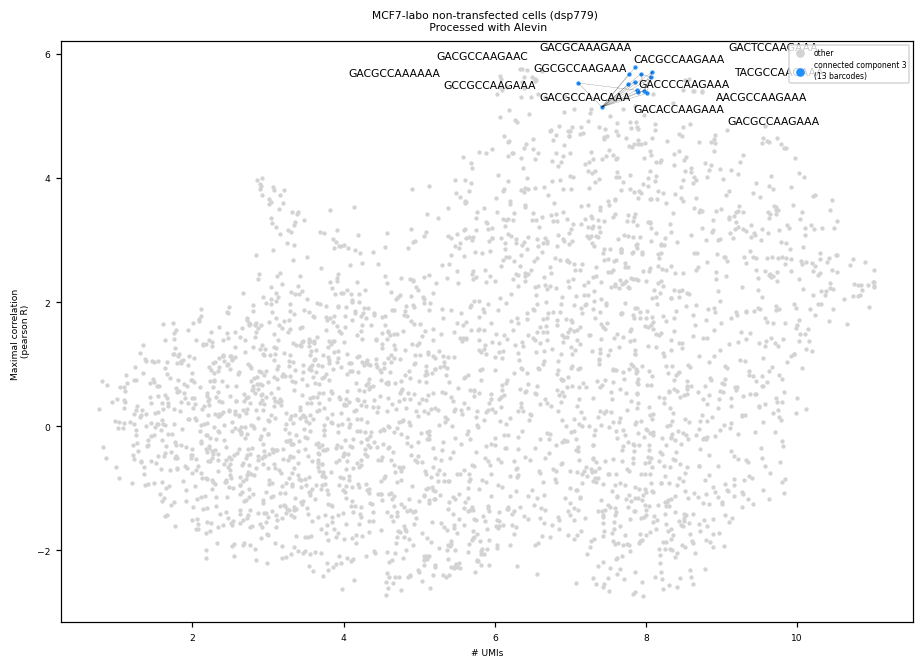

In [827]:
fig,_ = plt.subplots(figsize=(10,7))

i = 3

component = connected_components[i]

texts = []
select = []
for barcode in sc.obs["CB"] :
    if barcode in component :
        select.append(f"connected component {i}\n({len(component)} barcodes)")
    else :
        select.append("other")   

sc.obs["select"] = np.array(select, dtype=str)
explored = []
for barcode1 in component :
    for barcode2 in component :
        if hammingDist(barcode1, barcode2) == 1 and {barcode1,barcode2} not in explored :
            x = (sc[barcode1].obsm["X_umap"].T[0], sc[barcode2].obsm["X_umap"].T[0])
            y = (sc[barcode1].obsm["X_umap"].T[1], sc[barcode2].obsm["X_umap"].T[1])
            plt.plot(x,y, linewidth = 0.1, color = "black")
            explored.append({barcode1, barcode2})
    texts.append(plt.text(sc[barcode1].obsm["X_umap"].T[0],\
                              sc[barcode1].obsm["X_umap"].T[1], barcode1, fontsize = 7))


rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0], sc.obsm["X_umap"].T[1], s = 8, linewidth=0, color = sc.obs["select"].values,\
                        xlabel = "# UMIs", ylabel="Maximal correlation \n (pearson R)",\
                        title = "MCF7-labo non-transfected cells (dsp779) \n Processed with Alevin",\
                        palette = {f"connected component {i}\n({len(component)} barcodes)" : "dodgerblue", "other":"lightgray"},\
                        order_color = ["other", f"connected component {i}\n({len(component)} barcodes)"], fig = fig)
adjust_text(texts)

plt.show()

/u/davidm/VirtualEns/python_3.9.5/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


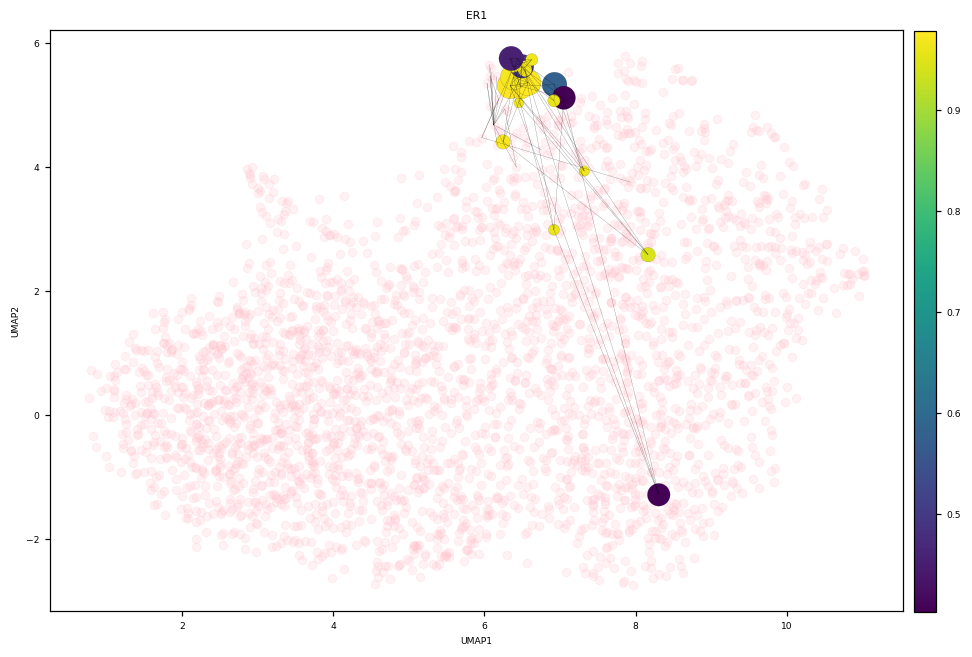

In [580]:
fig,_ = plt.subplots(figsize=(10,7))

comps = [0,1] #0 1 2 6 12
a,b = comps

texts = []
sc.obs["select"] = np.repeat("other", len(sc.obs_names))

for barcode in sc.obs_names :
    for i in comps :
        if barcode in connected_components[i] :
            sc.obs["select"].loc[barcode] = f"connected component {i}\n({len(connected_components[i])} barcodes)"


explored = []
for i in comps :
    for barcode1 in connected_components[i] :
        for barcode2 in connected_components[i] :
            if hammingDist(barcode1, barcode2) == 1 and {barcode1,barcode2} not in explored :
                x = (sc[barcode1].obsm["X_umap"].T[0], sc[barcode2].obsm["X_umap"].T[0])
                y = (sc[barcode1].obsm["X_umap"].T[1], sc[barcode2].obsm["X_umap"].T[1])
                plt.plot(x,y, linewidth = 0.1, color = "black")
                explored.append({barcode1, barcode2})
    #     texts.append(plt.text(sc[barcode1].obsm["X_umap"].T[0],\
    #                               sc[barcode1].obsm["X_umap"].T[1], barcode1, fontsize = 5.5))


# markers = np.array(['v' if t < 1200 else 'o' for t in sc.obs["total_UMIs"]])
# rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0], sc.obsm["X_umap"].T[1], s = 30, linewidth=0.07, color = sc.obs["select"].values,\
#                         xlabel = "UMAP1", ylabel="UMAP2",\
#                         title = "ER1",\
#                         palette = {f"connected component 0\n({len(connected_components[0])} barcodes)" : "dodgerblue", \
#                                    f"connected component {b}\n({len(connected_components[b])} barcodes)" : "chocolate", \
#                                    "other":"white"}, \
#                         fig = fig, order_color = ["other", f"connected component 0\n({len(connected_components[0])} barcodes)", \
#                                                  f"connected component {b}\n({len(connected_components[b])} barcodes)"])

rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0], sc.obsm["X_umap"].T[1], s = 30, linewidths=0.8, color = "pink",\
                        xlabel = "UMAP1", ylabel="UMAP2", edgecolor="black", alpha = 0.2,\
                        title = "ER1", fig = fig)
rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0][[cb in connected_components[0] for cb in sc.obs_names]], \
                        sc.obsm["X_umap"].T[1][[cb in connected_components[0] for cb in sc.obs_names]], linewidth=0.07, 
                        color = sc.obs["DedupRate"].loc[connected_components[0]].values,\
                        s = (sc.obs["max_corr"].loc[connected_components[0]].values*10)**2.5,
                        xlabel = "UMAP1", ylabel="UMAP2",\
                        title = "ER1", fig= fig)


adjust_text(texts)
# plt.savefig(f"./figs/{prefix}_umap.pdf")
plt.show()

/u/davidm/VirtualEns/python_3.9.5/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


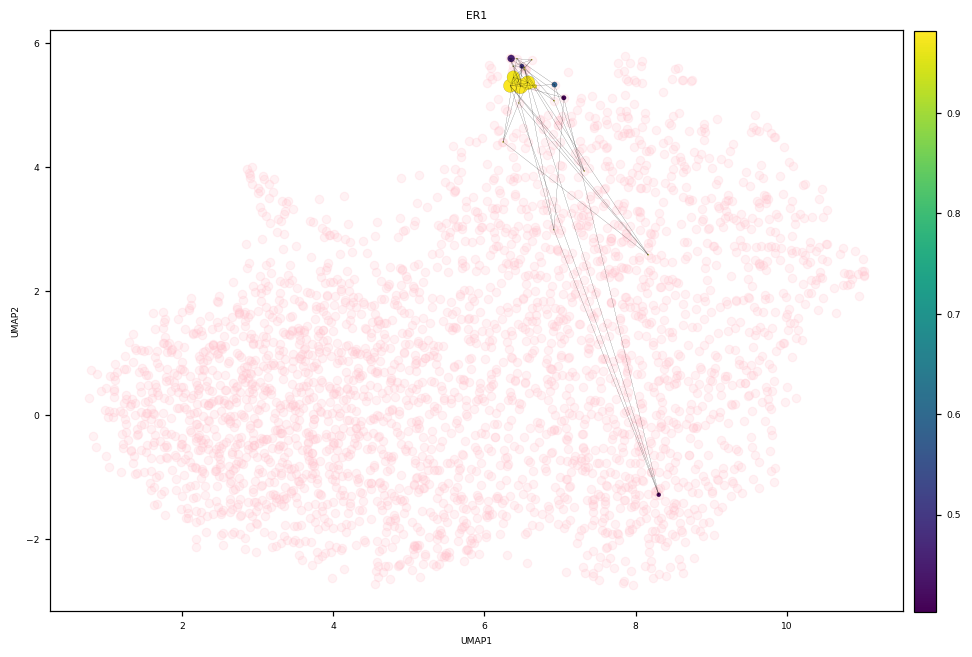

In [821]:
fig,_ = plt.subplots(figsize=(10,7))

comps = [0] #0 1 2 6 12
# a,b = comps

texts = []
sc.obs["select"] = np.repeat("other", len(sc.obs_names))

for barcode in sc.obs_names :
    for i in comps :
        if barcode in connected_components[i] :
            sc.obs["select"].loc[barcode] = f"connected component {i}\n({len(connected_components[i])} barcodes)"


explored = []
for i in comps :
    for barcode1 in connected_components[i] :
        for barcode2 in connected_components[i] :
            if hammingDist(barcode1, barcode2) == 1 and {barcode1,barcode2} not in explored :
                x = (sc[barcode1].obsm["X_umap"].T[0], sc[barcode2].obsm["X_umap"].T[0])
                y = (sc[barcode1].obsm["X_umap"].T[1], sc[barcode2].obsm["X_umap"].T[1])
                plt.plot(x,y, linewidth = 0.1, color = "black")
                explored.append({barcode1, barcode2})
    #     texts.append(plt.text(sc[barcode1].obsm["X_umap"].T[0],\
    #                               sc[barcode1].obsm["X_umap"].T[1], barcode1, fontsize = 5.5))


# markers = np.array(['v' if t < 1200 else 'o' for t in sc.obs["total_UMIs"]])
# rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0], sc.obsm["X_umap"].T[1], s = 30, linewidth=0.07, color = sc.obs["select"].values,\
#                         xlabel = "UMAP1", ylabel="UMAP2",\
#                         title = "ER1",\
#                         palette = {f"connected component 0\n({len(connected_components[0])} barcodes)" : "dodgerblue", \
#                                    f"connected component {b}\n({len(connected_components[b])} barcodes)" : "chocolate", \
#                                    "other":"white"}, \
#                         fig = fig, order_color = ["other", f"connected component 0\n({len(connected_components[0])} barcodes)", \
#                                                  f"connected component {b}\n({len(connected_components[b])} barcodes)"])

rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0], sc.obsm["X_umap"].T[1], s = 30, linewidths=0.8, color = "pink",\
                        xlabel = "UMAP1", ylabel="UMAP2", edgecolor="black", alpha = 0.2,\
                        title = "ER1", fig = fig)
rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0][[cb in connected_components[0] for cb in sc.obs_names]], \
                        sc.obsm["X_umap"].T[1][[cb in connected_components[0] for cb in sc.obs_names]], linewidth=0.07, 
                        color = sc.obs["DedupRate"].loc[connected_components[0]].values,\
                        s = ((sc.obs["total_UMIs"].loc[connected_components[0]].values)/np.median((sc.obs["total_UMIs"].loc[connected_components[0]].values)))**1.15,
                        xlabel = "UMAP1", ylabel="UMAP2",\
                        title = "ER1", fig= fig)


adjust_text(texts)
# plt.savefig(f"./figs/{prefix}_umap.pdf")
plt.show()

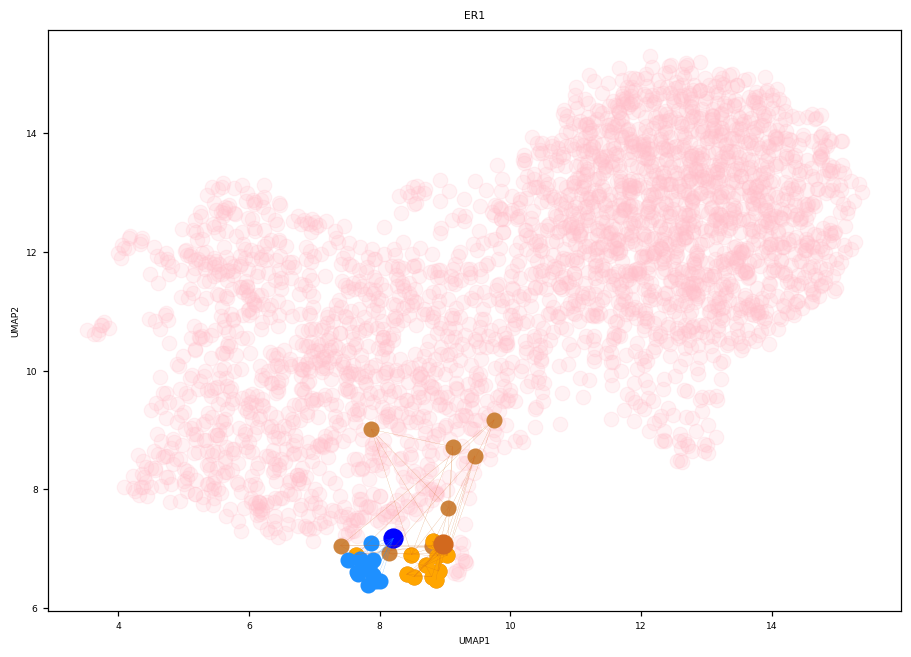

In [267]:
fig,_ = plt.subplots(figsize=(10,7))

comps = [0,2] #0 1 2 6 12
# a,b = comps
cc = np.intersect1d(connected_components[0], np.concatenate([whitelist, np.concatenate(list(correction_dict.values()))]))
cc2 = np.intersect1d(connected_components[2], np.concatenate([whitelist, np.concatenate(list(correction_dict.values()))]))


texts = []
sc.obs["select"] = np.repeat("other", len(sc.obs_names))

# for barcode in sc.obs_names :
#     for i in comps :
#         if barcode in np.intersect1d(connected_components[i], whitelist) :
#             sc.obs["select"].loc[barcode] = f"connected component {i}\n({len(connected_components[i])} barcodes)"


explored = []
for i,c in zip(comps,["chocolate","dodgerblue"]) :
    for barcode1 in connected_components[i] :
        for barcode2 in connected_components[i] :
            if (hammingDist(barcode1, barcode2) == 1  or levenshtein_distance(barcode1[:-1], barcode2) == 1 \
                            or levenshtein_distance(barcode1, barcode2[:-1]) == 1) and {barcode1,barcode2} not in explored :
                x = (sc[barcode1].obsm["X_umap"].T[0], sc[barcode2].obsm["X_umap"].T[0])
                y = (sc[barcode1].obsm["X_umap"].T[1], sc[barcode2].obsm["X_umap"].T[1])
                plt.plot(x,y, linewidth = 0.1, color = c)
                explored.append({barcode1, barcode2})
    #     texts.append(plt.text(sc[barcode1].obsm["X_umap"].T[0],\
    #                               sc[barcode1].obsm["X_umap"].T[1], barcode1, fontsize = 5.5))


# markers = np.array(['v' if t < 1200 else 'o' for t in sc.obs["total_UMIs"]])
# rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0], sc.obsm["X_umap"].T[1], s = 30, linewidth=0.07, color = sc.obs["select"].values,\
#                         xlabel = "UMAP1", ylabel="UMAP2",\
#                         title = "ER1",\
#                         palette = {f"connected component 0\n({len(connected_components[0])} barcodes)" : "dodgerblue", \
#                                    f"connected component {b}\n({len(connected_components[b])} barcodes)" : "chocolate", \
#                                    "other":"white"}, \
#                         fig = fig, order_color = ["other", f"connected component 0\n({len(connected_components[0])} barcodes)", \
#                                                  f"connected component {b}\n({len(connected_components[b])} barcodes)"])

rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0], sc.obsm["X_umap"].T[1], s = 90, linewidths=0.8, color = "pink",\
                        xlabel = "UMAP1", ylabel="UMAP2", edgecolor="black", alpha = 0.2,\
                        title = "ER1", fig = fig)


rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0][[cb in connected_components[0] for cb in sc.obs_names]], \
                        sc.obsm["X_umap"].T[1][[cb in connected_components[0] for cb in sc.obs_names]], linewidths=1, 
                        color = "peru", edgecolor="black",\
                        s = 90,
                        xlabel = "UMAP1", ylabel="UMAP2",\
                        title = "ER1", fig= fig)


rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0][[cb in cc for cb in sc.obs_names]], \
                        sc.obsm["X_umap"].T[1][[cb in cc for cb in sc.obs_names]], linewidth=0.07, 
                        color = "orange",\
                        s = 90,
                        xlabel = "UMAP1", ylabel="UMAP2",\
                        title = "ER1", fig= fig)


rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0][[cb in np.intersect1d(cc,whitelist) for cb in sc.obs_names]], \
                        sc.obsm["X_umap"].T[1][[cb in np.intersect1d(cc,whitelist) for cb in sc.obs_names]], linewidths=1, 
                        color = "chocolate", edgecolor="black",\
                        s = 150,
                        xlabel = "UMAP1", ylabel="UMAP2",\
                        title = "ER1", fig= fig)

rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0][[cb in cc2 for cb in sc.obs_names]], \
                        sc.obsm["X_umap"].T[1][[cb in cc2 for cb in sc.obs_names]], linewidth=0.07, 
                        color = "dodgerblue",\
                        s = 90,
                        xlabel = "UMAP1", ylabel="UMAP2",\
                        title = "ER1", fig= fig)

rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0][[cb in np.intersect1d(cc2,whitelist) for cb in sc.obs_names]], \
                        sc.obsm["X_umap"].T[1][[cb in np.intersect1d(cc2,whitelist) for cb in sc.obs_names]], linewidths=1, 
                        color = "blue",edgecolor="black",\
                        s = 150,
                        xlabel = "UMAP1", ylabel="UMAP2",\
                        title = "ER1", fig= fig)

adjust_text(texts)
plt.savefig(f"./figs/{prefix}_umap.pdf")
plt.show()

In [268]:
len(connected_components[0])

22

In [269]:
len(cc)

13

In [252]:
len(cc)

13

In [230]:
np.intersect1d(sc.obs_names[(sc.obsm["X_umap"].T[0]>8.5) & (sc.obsm["X_umap"].T[0]<9.5) & (sc.obsm["X_umap"].T[1]>12.5)],errors)

array(['AGGGGGGGGGGG', 'CGAACGAGCCTC', 'CGGGGGGGGGGG', 'CTTATGGAACTT',
       'GTTTGGAAACGC'], dtype=object)

In [239]:
np.argwhere(["CTTATGGAACTT" in comp for comp in connected_components])

array([[119]])

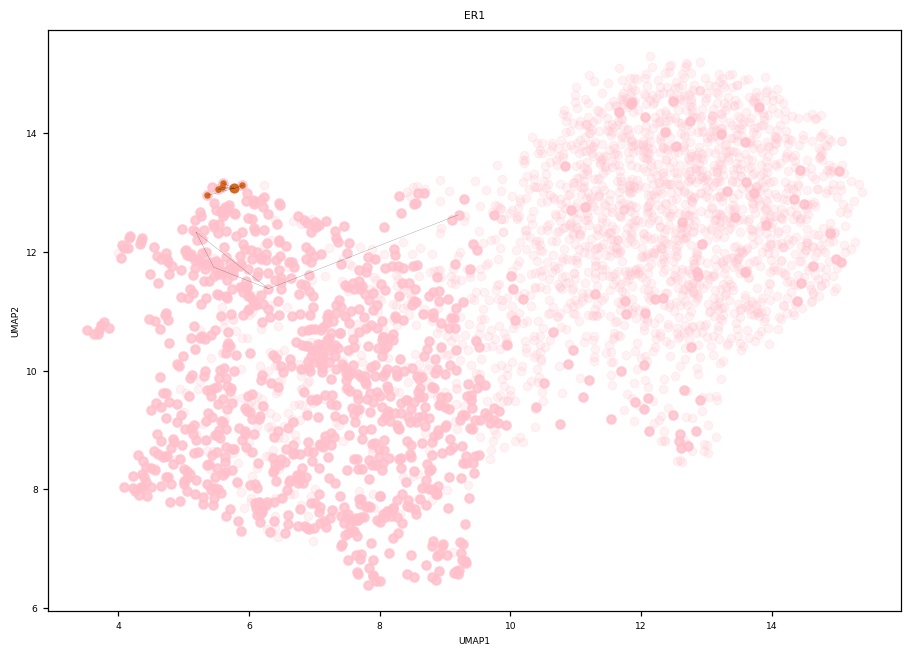

In [189]:
fig,_ = plt.subplots(figsize=(10,7))

comps = [6] #0 1 2 6 12
# a,b = comps
cc = np.intersect1d(connected_components[6], np.concatenate([whitelist, np.concatenate(list(correction_dict.values()))]))


texts = []
sc.obs["select"] = np.repeat("other", len(sc.obs_names))

# for barcode in sc.obs_names :
#     for i in comps :
#         if barcode in np.intersect1d(connected_components[i], whitelist) :
#             sc.obs["select"].loc[barcode] = f"connected component {i}\n({len(connected_components[i])} barcodes)"


explored = []
for i in comps :
    for barcode1 in connected_components[i] :
        for barcode2 in connected_components[i] :
            if (hammingDist(barcode1, barcode2) == 1) and {barcode1,barcode2} not in explored :
                x = (sc[barcode1].obsm["X_umap"].T[0], sc[barcode2].obsm["X_umap"].T[0])
                y = (sc[barcode1].obsm["X_umap"].T[1], sc[barcode2].obsm["X_umap"].T[1])
                plt.plot(x,y, linewidth = 0.1, color = "black")
                explored.append({barcode1, barcode2})
    #     texts.append(plt.text(sc[barcode1].obsm["X_umap"].T[0],\
    #                               sc[barcode1].obsm["X_umap"].T[1], barcode1, fontsize = 5.5))


# markers = np.array(['v' if t < 1200 else 'o' for t in sc.obs["total_UMIs"]])
# rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0], sc.obsm["X_umap"].T[1], s = 30, linewidth=0.07, color = sc.obs["select"].values,\
#                         xlabel = "UMAP1", ylabel="UMAP2",\
#                         title = "ER1",\
#                         palette = {f"connected component 0\n({len(connected_components[0])} barcodes)" : "dodgerblue", \
#                                    f"connected component {b}\n({len(connected_components[b])} barcodes)" : "chocolate", \
#                                    "other":"white"}, \
#                         fig = fig, order_color = ["other", f"connected component 0\n({len(connected_components[0])} barcodes)", \
#                                                  f"connected component {b}\n({len(connected_components[b])} barcodes)"])

cbs = np.concatenate([errors, list(correction_dict.keys())])

rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0][[cb in cbs for cb in sc.obs_names]], \
                        sc.obsm["X_umap"].T[1][[cb in cbs for cb in sc.obs_names]], s = 30, linewidths=1.5, color = "pink",\
                        xlabel = "UMAP1", ylabel="UMAP2", edgecolor="black", alpha = 0.8,\
                        title = "ER1", fig = fig)

rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0][[cb not in cbs for cb in sc.obs_names]], \
                        sc.obsm["X_umap"].T[1][[cb not in cbs for cb in sc.obs_names]], s = 30, linewidths=0.8, color = "pink",\
                        xlabel = "UMAP1", ylabel="UMAP2", edgecolor="black", alpha = 0.2,\
                        title = "ER1", fig = fig)
rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0][[cb in cc for cb in sc.obs_names]], \
                        sc.obsm["X_umap"].T[1][[cb in cc for cb in sc.obs_names]], linewidth=0.07, 
                        color = "chocolate",\
                        s = 10,
                        xlabel = "UMAP1", ylabel="UMAP2",\
                        title = "ER1", fig= fig)

rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0][[cb in np.intersect1d(cc,whitelist) for cb in sc.obs_names]], \
                        sc.obsm["X_umap"].T[1][[cb in np.intersect1d(cc,whitelist) for cb in sc.obs_names]], linewidth=0.07, 
                        color = "chocolate",\
                        s = 30,
                        xlabel = "UMAP1", ylabel="UMAP2",\
                        title = "ER1", fig= fig)

adjust_text(texts)
plt.savefig(f"./figs/{prefix}_umap.pdf")
plt.show()

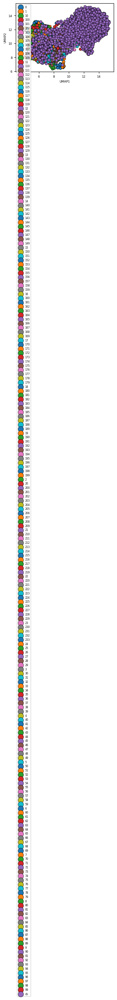

In [190]:
sc.obs["comp"] = np.array([int(np.argwhere([cb in comp for comp in connected_components]).ravel()) for cb in sc.obs_names]).astype(str)

sc.obs["comp"] = [comp if len(connected_components[int(comp)]) > 1 else "cb" for comp in sc.obs["comp"].values]

rnaseq.plotting.scatter(sc.obsm["X_umap"].T[0], sc.obsm["X_umap"].T[1], s = 30, linewidths=0.8, color=sc.obs["comp"].values,\
                        xlabel = "UMAP1", ylabel="UMAP2", edgecolor="black")

In [569]:
sc.obs["total_UMIs"].loc[cc]

CB
CCTTGTCGCGTG    17295.0
Name: total_UMIs, dtype: float32

In [567]:
sc.obs["total_UMIs"].loc[connected_components[0]]

CB
CCTTGTCGCGTG    17295.000000
CCTTGTCGCGTC    13654.000000
CCTTGTCGCGTA    14682.000000
CCTTGTCGCGTT    12573.000977
CCTTGTCGCGGT     2830.000000
CCTTGTCGCGGA     2176.000000
CCTTGTCGCGGG     2251.000000
CCTTGTCGCGGC     1816.000000
CCTTGTCGCATT      187.000000
CCTTGTCGCATG      337.000000
CCTTGTCGCATC      297.000000
CCTTGTCGCATA      277.000000
CCTTGTCACGTT      145.000000
CCTTGTCACGTG      264.000000
CCTTGTCACGTC      182.000000
CCTTGTCACGTA      213.000000
CCTTATCGCGTT      147.000000
CCTTATCGCGTG      287.000000
CCTTATCGCGTC      205.000000
CCTTATCGCGTA      251.000000
GCTTGTCGCGTG     4620.000000
Name: total_UMIs, dtype: float32

In [220]:
(markers == 'o').sum()

508

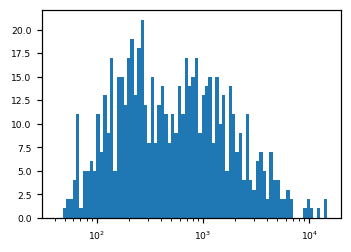

In [211]:
rnaseq.plotting.loghist(sc.obs["total_UMIs"].loc[np.concatenate(list(correction_dict.values()))], bins=80);

In [1431]:
# b = sc.obs_names[np.array(n_neighbors) == 14][0]
# dedup = sc.obs["DedupRate"].loc[errors_dict[b]]
# phred = np.mean(total_scores[[cb in correction_dict[b] for cb in sc.obs_names]], axis = 1)

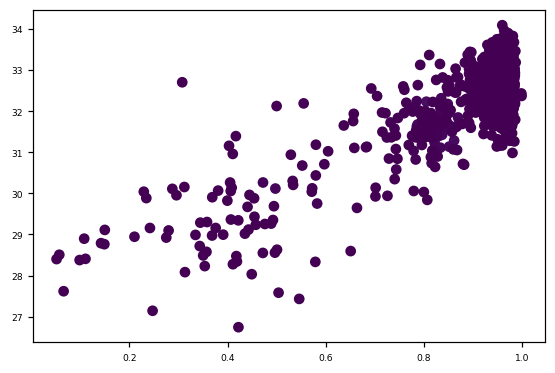

In [1439]:
# dedup = sc.obs["DedupRate"]
# phred = np.mean(total_scores, axis = 1)
# plt.scatter(dedup, phred, c=sc.obs["raw_cb_freq"])

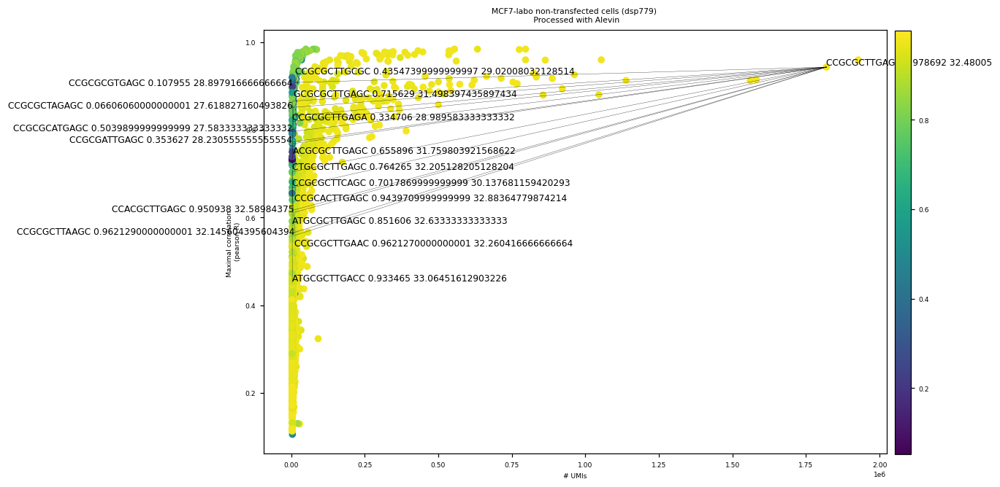

In [1440]:
fig,_ = plt.subplots(figsize=(10,7))

i = 1

component = connected_components[i]

texts = []
select = []
for barcode in sc.obs["CB"] :
    if barcode in component :
        select.append(f"connected component {i}\n({len(component)} barcodes)")
    else :
        select.append("other")   

sc.obs["select"] = np.array(select, dtype=str)
explored = []
for barcode1 in component :
    for barcode2 in component :
        if hammingDist(barcode1, barcode2) == 1 and {barcode1,barcode2} not in explored :
            x = (sc.obs["raw_cb_freq"].values[sc.obs["CB"] == barcode1], sc.obs["raw_cb_freq"].values[sc.obs["CB"] == barcode2])
            y = (sc.obs["max_corr"].values[sc.obs["CB"] == barcode1], sc.obs["max_corr"].values[sc.obs["CB"] == barcode2])
            plt.plot(x,y, linewidth = 0.2, color = "black")
            explored.append({barcode1, barcode2})
    dedup = sc.obs["DedupRate"].loc[barcode1]
    phred = total_scores[sc.obs_names == barcode1].mean()
    t = f"{barcode1} {dedup} {phred}"
    texts.append(plt.text(sc.obs["raw_cb_freq"].values[sc.obs["CB"] == barcode1],\
                              sc.obs["max_corr"].values[sc.obs["CB"] == barcode1], t, fontsize = 8))


rnaseq.plotting.scatter(sc.obs["raw_cb_freq"].values, sc.obs["max_corr"].values, s = 40, color = sc.obs["DedupRate"].values,\
                        xlabel = "# UMIs", ylabel="Maximal correlation \n (pearson R)", linewidth=0,\
                        title = "MCF7-labo non-transfected cells (dsp779) \n Processed with Alevin",\
                        palette = {f"connected component {i}\n({len(component)} barcodes)" : "dodgerblue", "other":"lightgray"},\
                        order_color = ["other", f"connected component {i}\n({len(component)} barcodes)"], fig = fig)
adjust_text(texts)

plt.savefig("./cluster_error.pdf")

plt.show()

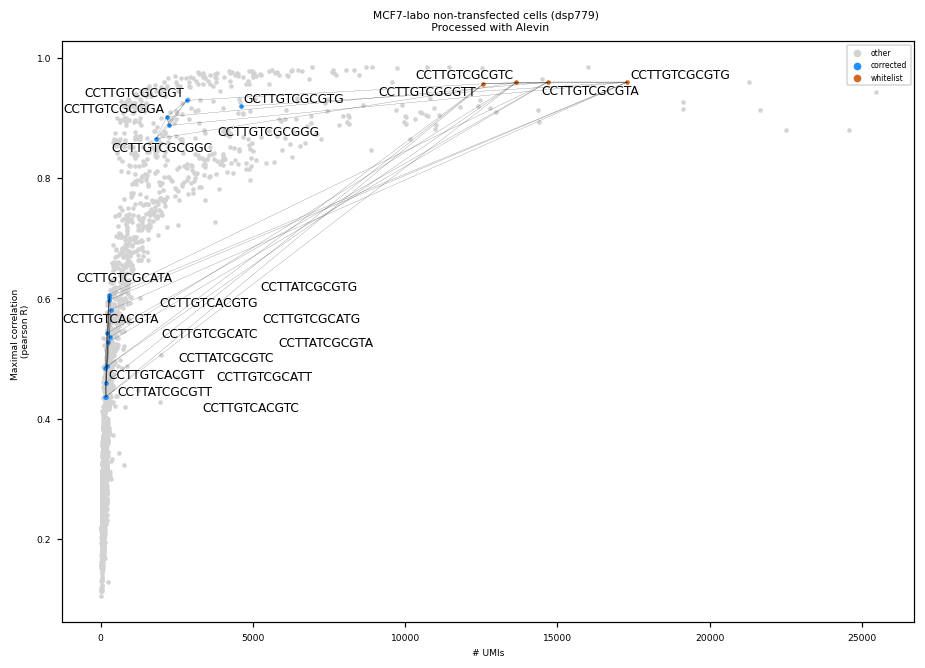

In [545]:
fig,_ = plt.subplots(figsize=(10,7))

i = 0

component = connected_components[i]

texts = []
select = []
for barcode in sc.obs["CB"] :
    if barcode in component and barcode in whitelist :
        select.append(f"whitelist")
    elif barcode in component :
        select.append("corrected")
    else :
        select.append("other")   

sc.obs["select"] = np.array(select, dtype=str)
explored = []
for barcode1 in component :
    for barcode2 in component :
        if hammingDist(barcode1, barcode2) == 1 and {barcode1,barcode2} not in explored :
            x = (sc.obs["total_UMIs"].values[sc.obs["CB"] == barcode1], sc.obs["total_UMIs"].values[sc.obs["CB"] == barcode2])
            y = (sc.obs["max_corr"].values[sc.obs["CB"] == barcode1], sc.obs["max_corr"].values[sc.obs["CB"] == barcode2])
            plt.plot(x,y, linewidth = 0.1, color = "black")
            explored.append({barcode1, barcode2})
    texts.append(plt.text(sc.obs["total_UMIs"].values[sc.obs["CB"] == barcode1],\
                              sc.obs["max_corr"].values[sc.obs["CB"] == barcode1], barcode1, fontsize = 8))


rnaseq.plotting.scatter(sc.obs["total_UMIs"].values, sc.obs["max_corr"].values, s = 4, color = sc.obs["select"].values,\
                        xlabel = "# UMIs", ylabel="Maximal correlation \n (pearson R)",\
                        title = "MCF7-labo non-transfected cells (dsp779) \n Processed with Alevin",\
                        palette = {f"corrected" : "dodgerblue", "whitelist": "chocolate", "other":"lightgray"},\
                        order_color = ["other", f"corrected", "whitelist"], fig = fig)
adjust_text(texts)

plt.savefig("./cluster_error.pdf")

plt.show()

### Umap

In [2218]:
# hd_errors = errors[[sc.obs["DedupRate"].loc[cb] > 0.9 for cb in errors]]

In [2219]:
# sc._inplace_subset_obs([cb not in correction_dict.keys() for cb in sc.obs_names])

In [2221]:
# sc._inplace_subset_obs([cb not in hd_errors for cb in sc.obs_names])

In [2254]:
sc.X.shape

(2304, 60240)

In [2123]:
# sc.layers["nd"] = nd

In [2143]:
# sc.obs["nd"] = (sc.layers["nd"] - sc.layers["raw"].toarray()).sum(1)

In [181]:
sc._inplace_subset_obs(sc.obs["total_UMIs"]>300)

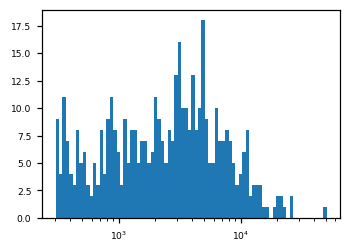

In [182]:
rnaseq.plotting.loghist(sc.obs["total_UMIs"]);

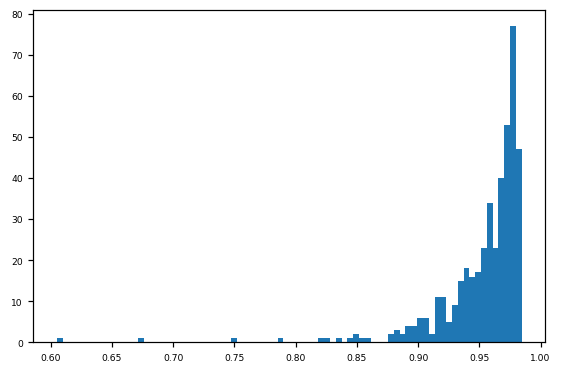

In [183]:
plt.hist(sc.obs["DedupRate"],bins=80);

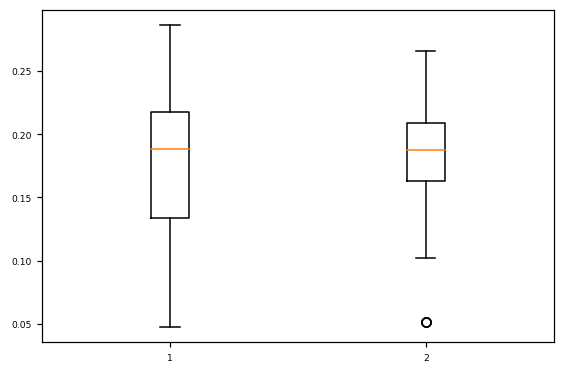

In [1894]:
e = sc.obs_names[sc.obs["DedupRate"]<0.8]
o, e = get_intended_barcodes(correction_dict, e)
plt.boxplot([sc.obs["rp_frac"].loc[e].values, sc.obs["rp_frac"].loc[o].values]);

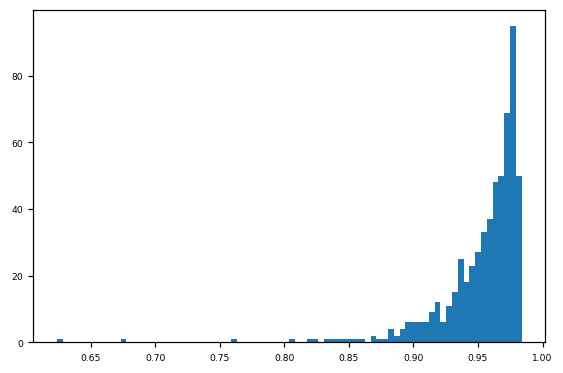

In [111]:
plt.hist(sc.obs["DedupRate"], bins = 80);

In [1560]:
# sc._inplace_subset_var([not g.startswith('AP') for g in sc.var["external_gene_name"]]);

In [1557]:
# rnaseq.setup.annotate_genes(sc, "gene_biotype")
# sc._inplace_subset_var(sc.var["gene_biotype"]=="protein_coding")

Annotating gene_biotype using Biomart (Ensembl Genes 100, 'hsapiens_gene_ensembl')...


In [88]:
rnaseq.setup.annotate_genes(sc, "gene_biotype")

Annotating gene_biotype using Biomart (Ensembl Genes 100, 'hsapiens_gene_ensembl')...


In [2000]:
np.unique(sc.var["gene_biotype"])

array(['IG_C_gene', 'Mt_rRNA', 'Mt_tRNA', 'TEC', 'TR_V_gene', 'lncRNA',
       'miRNA', 'misc_RNA', 'polymorphic_pseudogene',
       'processed_pseudogene', 'protein_coding', 'rRNA', 'scRNA',
       'scaRNA', 'snRNA', 'snoRNA', 'transcribed_processed_pseudogene',
       'transcribed_unitary_pseudogene',
       'transcribed_unprocessed_pseudogene',
       'translated_processed_pseudogene', 'unprocessed_pseudogene'],
      dtype=object)

In [2236]:
sc._inplace_subset_obs(whitelist)

In [2256]:
sc._inplace_subset_obs(sc.obs["total_UMIs"]>300)

In [2257]:
sc._inplace_subset_obs(sc.obs["total_UMIs"]<50000)

In [2204]:
sc._inplace_subset_obs(sc.obs["MappingRate"]>0.6)

In [2258]:
sc._inplace_subset_obs(sc.obs["DedupRate"]>0.8)

In [1284]:
# sc._inplace_subset_obs(sc.obs["mt_frac"]<0.05)

In [1325]:
sc._inplace_subset_obs(sc.obs["total_UMIs"]<12000)

In [1253]:
sc._inplace_subset_obs(sc.obs["raw_cb_freq"]<1e6)

In [1355]:
sc._inplace_subset_obs(sc.obs["raw_cb_freq"]>1.5*1e4)

In [1537]:
sc._inplace_subset_obs(sc.obs["len"]<0.00012)

In [1220]:
sc._inplace_subset_obs(sc.obs["phred"]<33.2)

In [1223]:
sc._inplace_subset_obs(sc.obs["phred"]>32.1)

In [1333]:
sc._inplace_subset_obs(sc.obs["rp_frac"]>0.05)

In [1545]:
sc._inplace_subset_obs(sc.obs["rp_frac"]<0.25)

In [141]:
rnaseq.pp.filter_genes(sc, n_counts=5)
sc.X.shape

(1026, 11149)

Normalization by total UMIs...
Log2 + 1 tranformation...


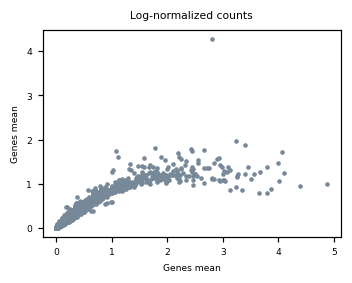

In [70]:
rnaseq.pp.log_norm(sc, plot=True, inplace=True, ow = True)

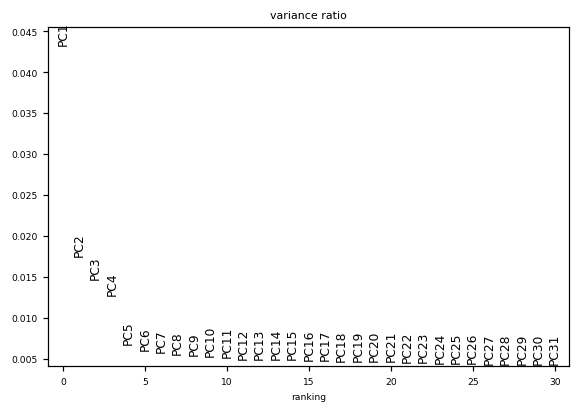

In [71]:
scanpy.pp.pca(sc, n_comps=50)
scanpy.pl.pca_variance_ratio(sc)

In [73]:
scanpy.pp.neighbors(sc, n_pcs = 40, n_neighbors = 20)
scanpy.tl.umap(sc, n_components=2)

In [143]:
sc.obs["error"] = np.array([cb in errors for cb in sc.obs_names], dtype = "str")

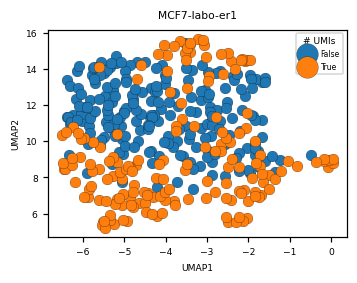

In [2241]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["error"], \
    s = 50, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "# UMIs",\
    title = new_sample_name, order_color = "descending", save = "./figs/ns_umap_umis.pdf", linewidth=0.15)

In [144]:
sc.obs["original"] = np.array([cb in correction_dict.keys() for cb in sc.obs_names], dtype = "str")

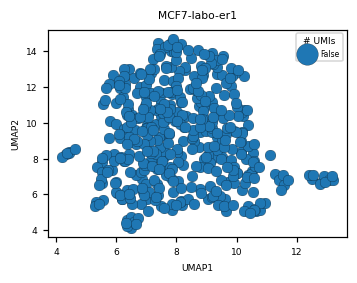

In [2233]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["original"], \
    s = 50, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "# UMIs",\
    title = new_sample_name, order_color = "descending", save = "./figs/ns_umap_umis.pdf", linewidth=0.15)

In [ ]:
sc.obs["phred"] = np.min(total_scores, axis = 1)
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["phred"], \
    s = 50, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "# UMIs",\
    title = new_sample_name, save = "./figs/ns_umap_umis.pdf", linewidth=0.15, vmin = 25)

In [187]:
sc._inplace_subset_obs([cb not in correction_dict.keys() for cb in sc.obs_names])

Text(0, 0.5, 'umis')

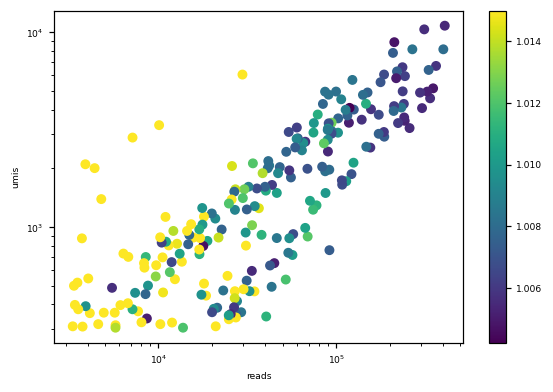

In [195]:
plt.scatter(sc.obs["raw_cb_freq"], sc.obs["total_UMIs"], s = 30,\
            c = np.log(sc.obs["CorrectedReads"])/np.log(sc.obs["raw_cb_freq"]), vmax = 1.015)
plt.colorbar()
plt.xscale('log')
plt.yscale('log')
plt.xlabel("reads")
plt.ylabel("umis")

In [43]:
project_path = "/home/arion/davidm/Data/datasets/raw/private/RNA-seq/sc/dsp779"
umis = pd.read_csv(f"{project_path}/raw-fastqs/{sample}/new_umis.csv")

In [44]:
dict_umis = {}
for cb in umis.columns :
    dict_umis[cb] = np.unique(np.concatenate([ast.literal_eval(umis[cb].values[chunk]) for chunk in range(umis.shape[0])]))

In [49]:
for cb in dict_umis.keys() :
    dict_umis[cb] = [list(x) for x in dict_umis[cb]]

In [146]:
sc.obs["last_pos_umi_T"] = [(np.array(dict_umis[cb]).T[-1]=="T").sum()/len(dict_umis[cb]) for cb in sc.obs_names]
sc.obs["non-corrected_UMIs"] = [len(dict_umis[cb]) for cb in sc.obs_names]

Text(0, 0.5, 'umis')

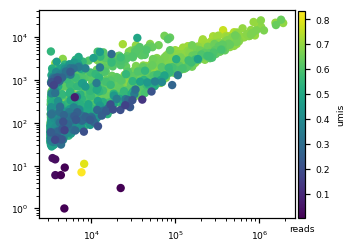

In [149]:
fig,_ = plt.subplots(figsize=(3,2.5))
plt.xscale('log')
plt.yscale('log')
rnaseq.plotting.scatter(sc.obs["raw_cb_freq"], sc.obs["total_UMIs"], s = 30, color = sc.obs["MappingRate"], fig=fig, linewidth=0, order_color="descending")
# plt.scatter(sc.obs["raw_cb_freq"], sc.obs["raw_cb_freq"]/20)
plt.xlabel("reads")
plt.ylabel("umis")
# plt.colorbar()

Text(0, 0.5, 'umis')

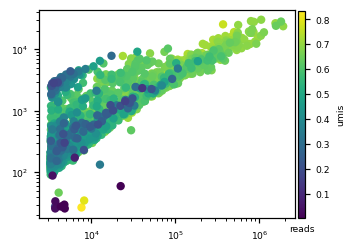

In [151]:
fig,_ = plt.subplots(figsize=(3,2.5))
plt.xscale('log')
plt.yscale('log')
rnaseq.plotting.scatter(sc.obs["raw_cb_freq"], sc.obs["non-corrected_UMIs"], s = 30, color = sc.obs["MappingRate"], fig=fig, linewidth=0, order_color="descending")
# plt.scatter(sc.obs["raw_cb_freq"], sc.obs["raw_cb_freq"]/20)
plt.xlabel("reads")
plt.ylabel("umis")
# plt.colorbar()

Text(0, 0.5, 'umis')

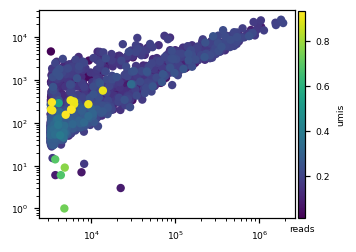

In [150]:
fig,_ = plt.subplots(figsize=(3,2.5))
plt.xscale('log')
plt.yscale('log')
rnaseq.plotting.scatter(sc.obs["raw_cb_freq"], sc.obs["total_UMIs"], s = 30, color = sc.obs["last_pos_umi_T"], fig=fig, linewidth=0, order_color="ascending")
# plt.scatter(sc.obs["raw_cb_freq"], sc.obs["raw_cb_freq"]/20)
plt.xlabel("reads")
plt.ylabel("umis")
# plt.colorbar()

In [41]:
sc.obs[sc.obs["total_UMIs"]<20]

,CB,CorrectedReads,MappedReads,DeduplicatedReads,MappingRate,DedupRate,MeanByMax,NumGenesExpressed,NumGenesOverMean,raw_cb_freq,samples,project_id,total_UMIs,max_corr,mt_frac,rp_frac
CB,,,,,,,,,,,,,,,,
GACAAACCTACC,GACAAACCTACC,24110,23,3,0.000954,0.869565,1.000000,3,0,22333,Sample_N705_-_ER1,dsp779,3.0,0.130533,0.000000,0.000000
ATGGGGCAATGG,ATGGGGCAATGG,10175,8123,11,0.798329,0.998646,0.314286,5,1,8199,Sample_N705_-_ER1,dsp779,11.0,0.220553,0.000000,0.636364
ATGGGTTTTTGT,ATGGGTTTTTGT,9062,7559,7,0.834143,0.999074,0.583333,6,1,7621,Sample_N705_-_ER1,dsp779,7.0,0.156659,0.000000,0.142857
TCAAATACGTGG,TCAAATACGTGG,5015,13,9,0.002592,0.307692,1.000000,9,0,4816,Sample_N705_-_ER1,dsp779,9.0,0.220553,0.111111,0.222222
ACCGACTACGGC,ACCGACTACGGC,5674,15,1,0.002644,0.933333,1.000000,1,0,4763,Sample_N705_-_ER1,dsp779,1.0,0.213483,0.000000,0.000000
CCGACAAACCTA,CCGACAAACCTA,10237,12,6,0.001172,0.500000,1.000000,6,0,4327,Sample_N705_-_ER1,dsp779,6.0,0.105652,0.000000,0.000000
CCAAACCCACTC,CCAAACCCACTC,5179,109,6,0.021046,0.944954,1.000000,6,0,3720,Sample_N705_-_ER1,dsp779,6.0,0.151384,0.000000,0.166667
GAGTCTGAGGCG,GAGTCTGAGGCG,4378,127,14,0.029009,0.889764,0.933333,15,13,3707,Sample_N705_-_ER1,dsp779,14.0,0.155267,0.071429,0.142857
TGGGATTACAGG,TGGGATTACAGG,5790,209,15,0.036097,0.928230,1.000000,15,0,3445,Sample_N705_-_ER1,dsp779,15.0,0.112860,0.066667,0.066667


In [143]:
np.unique(np.concatenate([ast.literal_eval(umis["ATGGGTTTTTGT"].values[chunk]) for chunk in range(umis.shape[0])]), return_counts=True) 

(array(['ATTACTGC', 'ATTACTTC', 'CTGTCTCT', 'CTTACTGC', 'GTTACTGC',
        'NTTACTGC', 'TATACTGC', 'TCTGTCTC', 'TGTACTGC', 'TTAACTGC',
        'TTACTGCT', 'TTCACTGC', 'TTTAATGC', 'TTTAATTC', 'TTTACAGC',
        'TTTACCGC', 'TTTACCTG', 'TTTACGGC', 'TTTACTAC', 'TTTACTCC',
        'TTTACTGA', 'TTTACTGC', 'TTTACTTC', 'TTTAGTGC', 'TTTATTGC',
        'TTTCCTGC', 'TTTGCTGC'], dtype='<U8'),
 array([  13,    1,   14,    1,    1,    1,    7,    2,    1,    8,    2,
           1,    4,    1,    2,    1,    8,    2,    1,    3,   10, 7552,
           2,    3,    1,    2,    1]))

In [130]:
np.unique(np.concatenate([ast.literal_eval(umis["ATGGGGCAATGG"].values[chunk]) for chunk in range(umis.shape[0])]), return_counts=True) 

(array(['AAAAACAA', 'AACCAGCA', 'AACCAGTA', 'CAACAGCA', 'CAACCGCA',
        'CACAAGCA', 'CACCAACA', 'CACCACCA', 'CACCAGAA', 'CACCAGCA',
        'CACCAGCC', 'CACCAGCG', 'CACCAGCT', 'CACCAGGA', 'CACCATCA',
        'CACCCGCA', 'CACCCTGT', 'CACCGGCA', 'CACCTGCA', 'CACCTGTC',
        'CACGAGCA', 'CACTAGCA', 'CACTGTCT', 'CAGTCTCT', 'CCACAGCA',
        'CCCCAGCA', 'CCCCCGCA', 'CCTGTCTC', 'CGCCAGCA', 'CTATCTCT',
        'CTCCAGCA', 'CTGTCTCT', 'GACCAGCA', 'GTGCTGCA', 'TACCAGCA'],
       dtype='<U8'),
 array([   1,    8,    1,    7,    1,   15,    1,    6,   11, 8000,   40,
           3,    6,    1,    6,   16,    4,    3,    2,    5,    1,    2,
           1,    1,    1,   39,    1,    5,   12,    1,    4,   40,    1,
           5,    2]))

In [139]:
np.unique(np.concatenate([ast.literal_eval(umis["TGGGATTACAGG"].values[chunk]) for chunk in range(umis.shape[0])]), return_counts=True) 

(array(['AATGAGCC', 'AATGATCC', 'AGTGAGCC', 'AGTGAGCT', 'AGTGAGTC',
        'CAAGAGCC', 'CACTGTCT', 'CAGAGCCG', 'CAGCGCCG', 'CAGGAGCC',
        'CAGTCTCT', 'CATCAGCC', 'CATGAACC', 'CATGACCC', 'CATGAGCC',
        'CATGAGTC', 'CATGATCC', 'CATGCGCC', 'CATGGGCC', 'CATGGGTC',
        'CCTAAGCC', 'CCTATAGT', 'CCTGCGCC', 'CGAGAGCC', 'CGCAAGCC',
        'CGCTGTCT', 'CGGAGCCA', 'CGTAAGCC', 'CGTGAACC', 'CGTGAACT',
        'CGTGAATC', 'CGTGACCT', 'CGTGAGAA', 'CGTGAGAC', 'CGTGAGCA',
        'CGTGAGCC', 'CGTGAGCT', 'CGTGAGGC', 'CGTGAGTC', 'CGTGATCC',
        'CGTGCACC', 'CGTGCCCT', 'CGTGCGCC', 'CGTGCGTC', 'CGTGGGCC',
        'CGTGTGCC', 'CGTGTGGC', 'CGTTAGCC', 'CGTTCGCC', 'CTGTCTCT',
        'CTTGAGCC', 'CTTGCGCC', 'CTTGGGCC', 'GATGAGCC', 'GGTGAGCC',
        'GGTGAGTC', 'TAATGAGG', 'TATAAGCC', 'TATGAGCC', 'TATGAGCT',
        'TATGCGCC', 'TATGGGCC', 'TCTGAGTC', 'TCTGATCC', 'TCTTGCTC',
        'TGCAGATG', 'TGCGAGCC', 'TGCTGTCT', 'TGTAAGCC', 'TGTAAGTC',
        'TGTCAGCC', 'TGTGAAAC', 'TGTGAACC', 'TGT

(30, 40000)

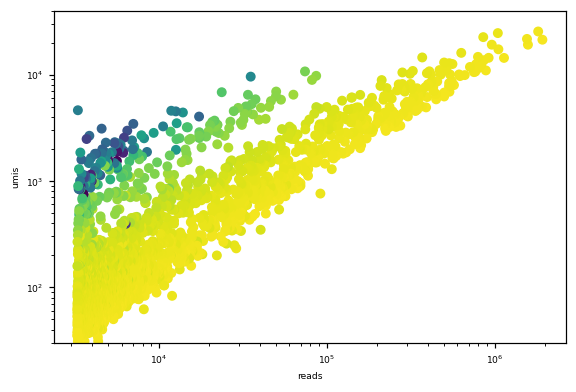

In [154]:
plt.scatter(sc.obs["raw_cb_freq"], sc.obs["total_UMIs"], s = 30, c = sc.obs["DedupRate"])
plt.xscale('log')
plt.yscale('log')
plt.xlabel("reads")
plt.ylabel("umis")
plt.ylim(30,40000)

(30, 40000)

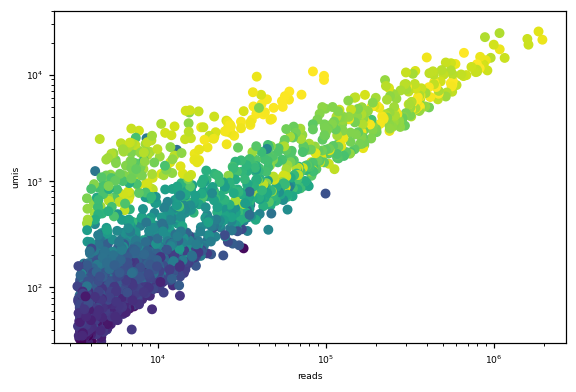

In [156]:
plt.scatter(sc.obs["CorrectedReads"], sc.obs["total_UMIs"], s = 30, c = sc.obs["max_corr"])
plt.xscale('log')
plt.yscale('log')
plt.xlabel("reads")
plt.ylabel("umis")
plt.ylim(30,40000)

Text(0, 0.5, 'umis')

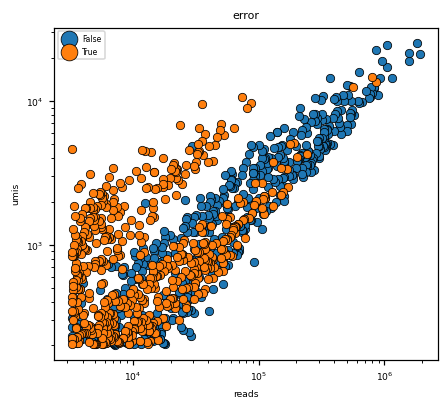

In [158]:
rnaseq.plotting.scatter(sc.obs["raw_cb_freq"], sc.obs["total_UMIs"], s = 30, color = sc.obs["error"].values, figsize=(4.5,4))
plt.title("error")
plt.xscale('log')
plt.yscale('log')
plt.xlabel("reads")
plt.ylabel("umis")

Text(0, 0.5, 'umis')

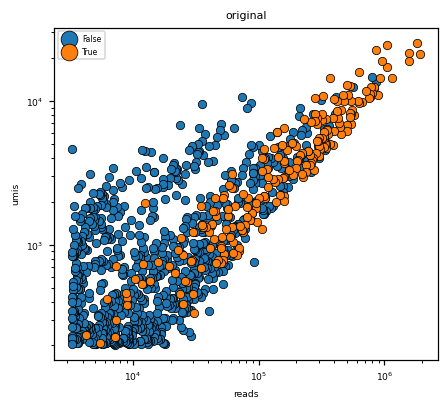

In [159]:
rnaseq.plotting.scatter(sc.obs["raw_cb_freq"], sc.obs["total_UMIs"], s = 30, color = sc.obs["original"].values, figsize=(4.5,4))
plt.title("original")
plt.xscale('log')
plt.yscale('log')
plt.xlabel("reads")
plt.ylabel("umis")

Text(0, 0.5, 'umis')

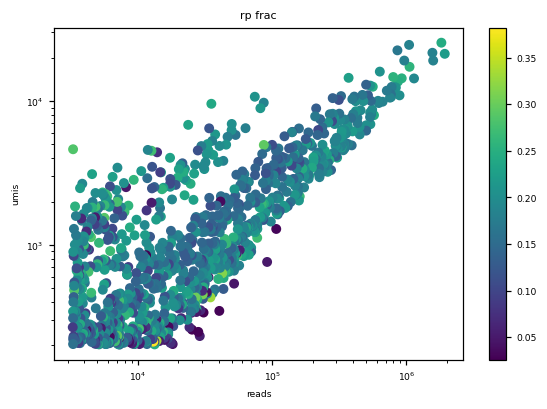

In [160]:
plt.scatter(sc.obs["raw_cb_freq"], sc.obs["total_UMIs"], s = 30, c = sc.obs["rp_frac"])
plt.colorbar()
plt.title("rp frac")
plt.xscale('log')
plt.yscale('log')
plt.xlabel("reads")
plt.ylabel("umis")

Text(0, 0.5, 'umis')

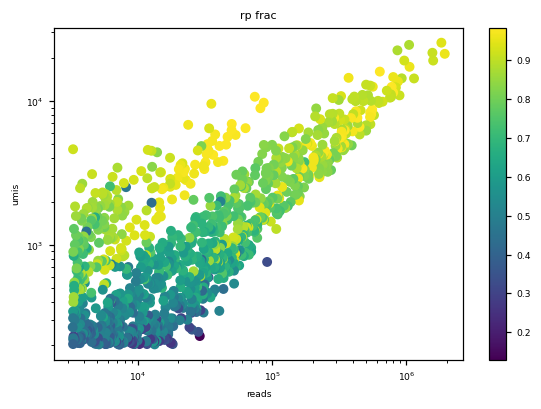

In [149]:
plt.scatter(sc.obs["raw_cb_freq"], sc.obs["total_UMIs"], s = 30, c = sc.obs["max_corr"])
plt.colorbar()
plt.title("rp frac")
plt.xscale('log')
plt.yscale('log')
plt.xlabel("reads")
plt.ylabel("umis")

Text(0, 0.5, 'umis')

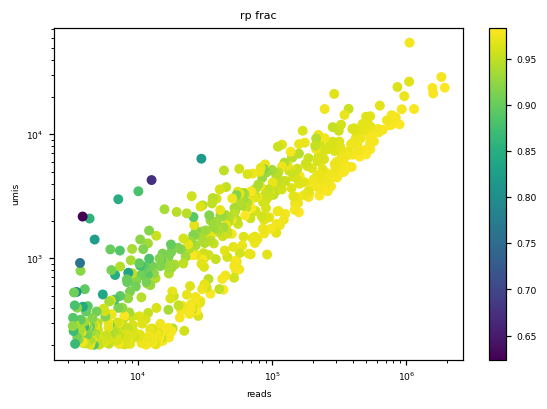

In [123]:
plt.scatter(sc.obs["raw_cb_freq"], sc.obs["total_UMIs"], s = 30, c = sc.obs["DedupRate"])
plt.colorbar()
plt.title("rp frac")
plt.xscale('log')
plt.yscale('log')
plt.xlabel("reads")
plt.ylabel("umis")

Text(0, 0.5, 'umis')

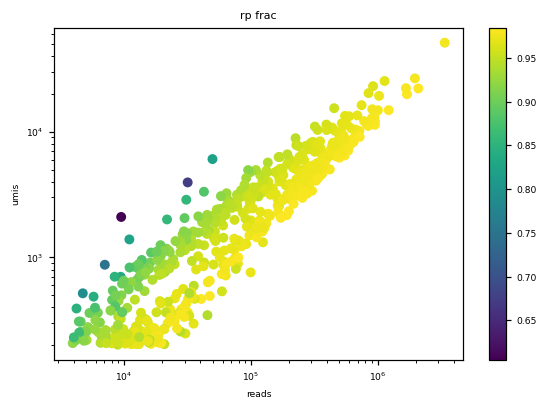

In [131]:
plt.scatter(sc.obs["CorrectedReads"], sc.obs["total_UMIs"], s = 30, c = sc.obs["DedupRate"])
plt.colorbar()
plt.title("rp frac")
plt.xscale('log')
plt.yscale('log')
plt.xlabel("reads")
plt.ylabel("umis")

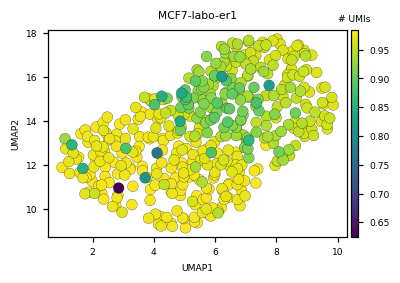

In [93]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["DedupRate"], \
    s = 50, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "# UMIs",\
    title = new_sample_name, order_color = "descending", save = "./figs/ns_umap_umis.pdf", linewidth=0.15)

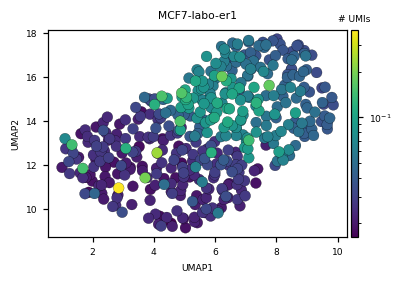

In [82]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["DeduplicatedReads"]/sc.obs["MappedReads"], \
    s = 50, norm = LogNorm(), palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "# UMIs",\
    title = new_sample_name, order_color = "ascending", save = "./figs/ns_umap_umis.pdf", linewidth=0.15)

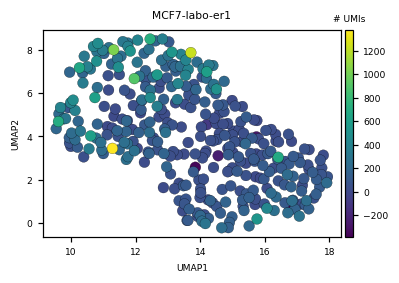

In [2144]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["nd"], \
    s = 50, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "# UMIs",\
    title = new_sample_name, order_color = "ascending", save = "./figs/ns_umap_umis.pdf", linewidth=0.15)

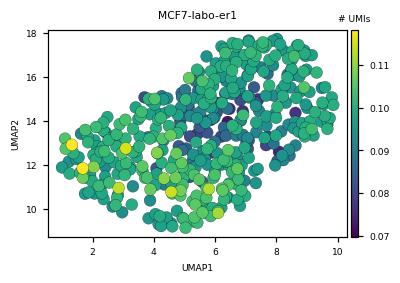

In [84]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["max_corr"]/np.log(sc.obs["total_UMIs"]), \
    s = 60, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "# UMIs",\
    title = new_sample_name, order_color = "ascending", save = "./figs/ns_umap_umis.pdf", linewidth=0.15)

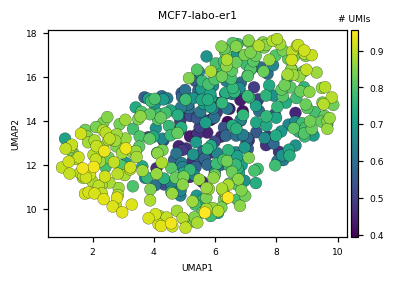

In [83]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["max_corr"], \
    s = 60, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "# UMIs",\
    title = new_sample_name, order_color = "ascending", save = "./figs/ns_umap_umis.pdf", linewidth=0.15)

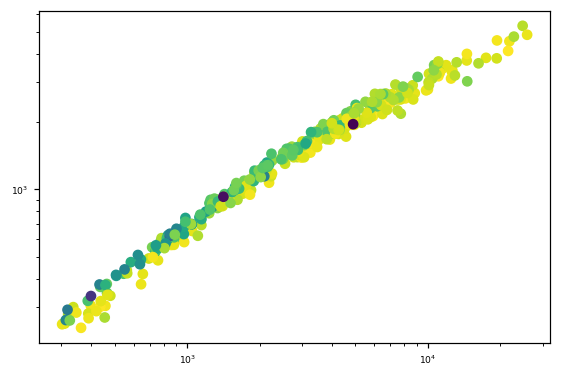

In [2078]:
plt.scatter(sc.obs["total_UMIs"], sc.obs["NumGenesExpressed"], c = sc.obs["DedupRate"])
plt.xscale('log')
plt.yscale('log')

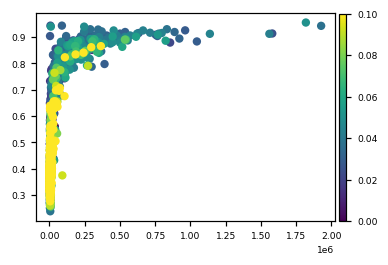

In [1995]:
rnaseq.plotting.scatter(sc.obs["raw_cb_freq"], sc.obs["max_corr"], color = sc.obs["mt_frac"], linewidth=0, s = 30, order_color="ascending", vmax=0.1);

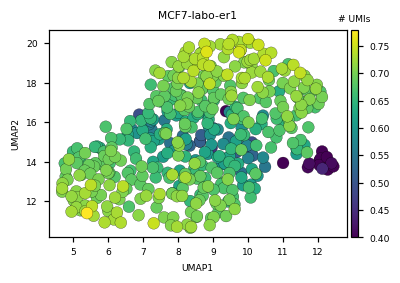

In [2264]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["MappingRate"], \
    s = 60, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "# UMIs", vmin = 0.4, \
    title = new_sample_name,order_color = "ascending", save = "./figs/ns_umap_umis.pdf", linewidth=0.15)

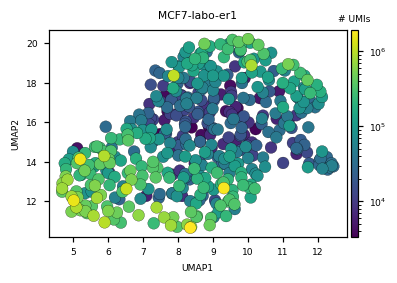

In [2265]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["raw_cb_freq"], \
    s = 60, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "# UMIs",\
    title = new_sample_name, norm = LogNorm(),order_color = "ascending", save = "./figs/ns_umap_umis.pdf", linewidth=0.15)

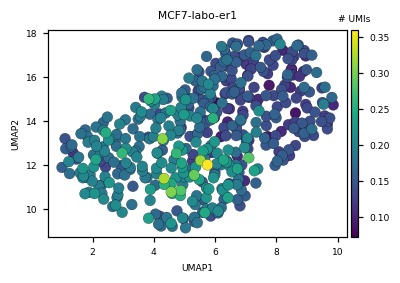

In [86]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["rp_frac"], \
    s = 50, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "# UMIs",\
    title = new_sample_name, order_color = "ascending", save = "./figs/ns_umap_umis.pdf", linewidth=0.15)

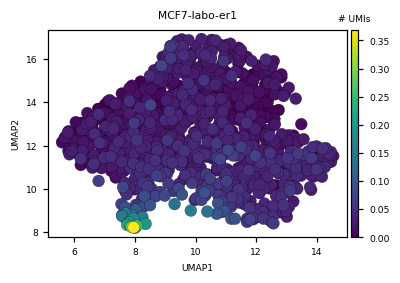

In [2029]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["mt_frac"], \
    s = 60, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "# UMIs",\
    title = new_sample_name, order_color = "ascending", save = "./figs/ns_umap_umis.pdf", linewidth=0.15)

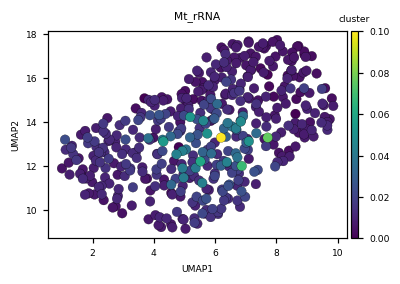

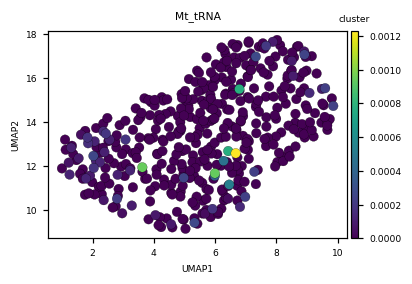

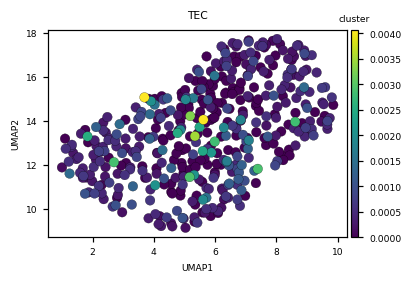

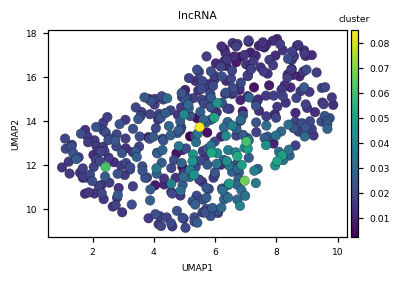

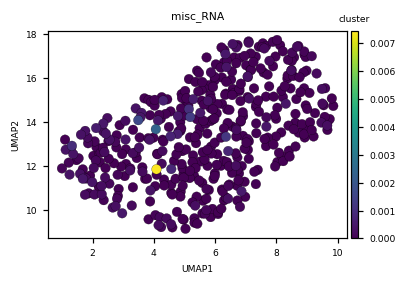

...

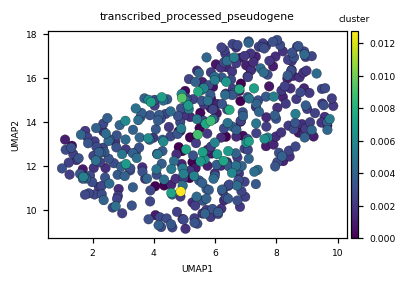

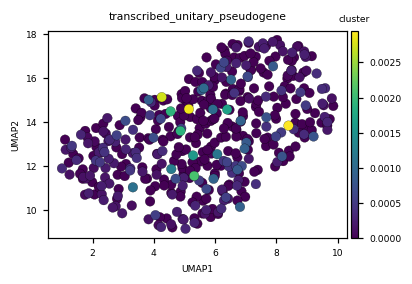

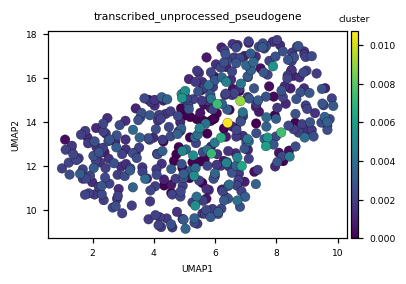

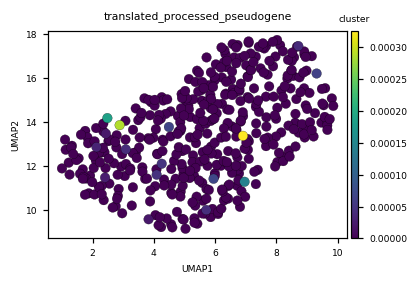

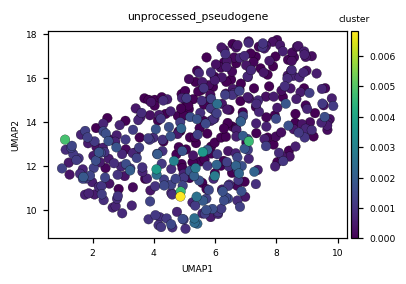

In [89]:
for ch in np.unique(sc.var["gene_biotype"]) :
    x = sc.layers["raw"].toarray()[:, sc.var["gene_biotype"] == ch]
    sc.obs["biotype"] = x.sum(1) / sc.obs["total_UMIs"]
    rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["biotype"], \
    s = 40, xlabel="UMAP1", ylabel="UMAP2", color_title = "cluster", title = ch, linewidth=0.15, order_color = "ascending")

/u/davidm/Documents/Master-thesis/Scripts/RNA-seq/python/rnaseq/plotting.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, _ = plt.subplots(figsize = figsize)


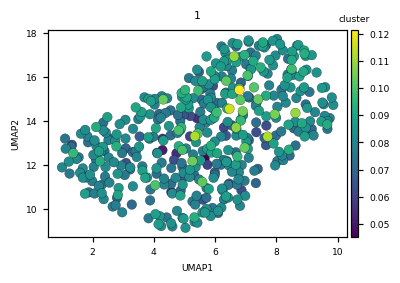

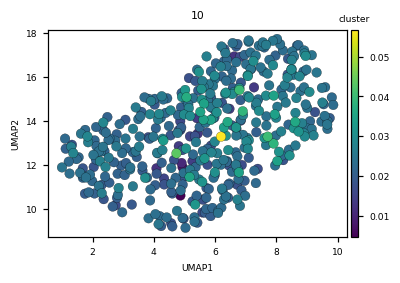

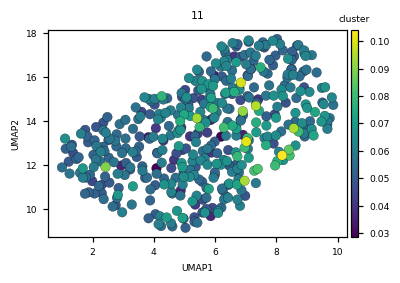

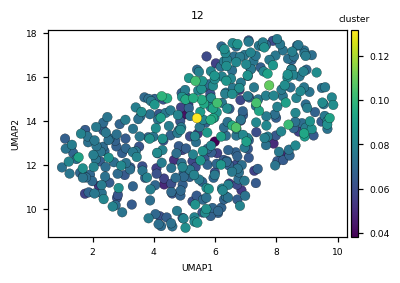

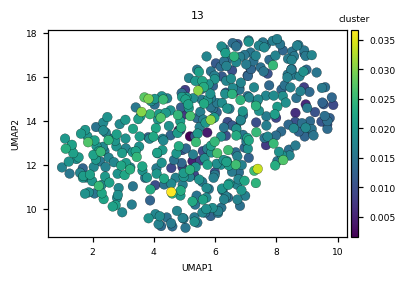

...

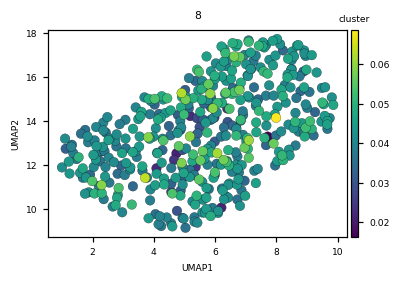

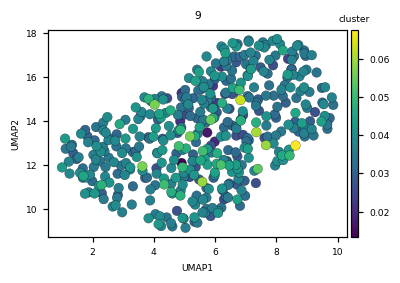

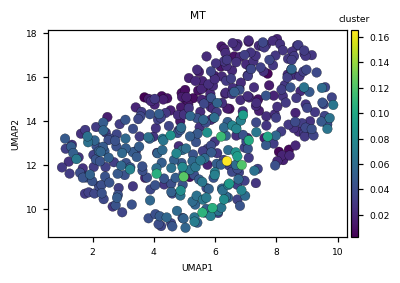

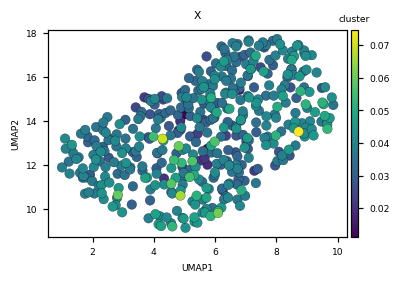

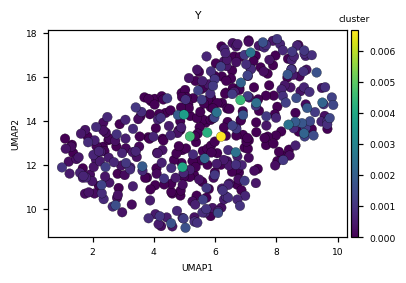

In [90]:
for ch in np.unique(sc.var["chromosome_name"]) :
    x = sc.layers["raw"].toarray()[:, sc.var["chromosome_name"] == ch]
    sc.obs["biotype"] = x.sum(1) / sc.obs["total_UMIs"]
    rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["biotype"], \
    s = 40, xlabel="UMAP1", ylabel="UMAP2", color_title = "cluster", title = ch, linewidth=0.15, order_color = "ascending")

In [ ]:
# sc.obs["phred"] = total_scores.sum(1)/total_scores.shape[1]
# rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["phred"], \
#     s = 70, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "# UMIs",\
#     title = new_sample_name, order_color = "descending", save = "./figs/ns_umap_umis.pdf", linewidth=0.15)

Annotating exonic_length using /home/arion/davidm/Data/references/human/assembly__GRCh38-hg38/annotation__gencode/gencode_34/biomart_ens100/ensembl_gene_id-to-exonic_length.csv...


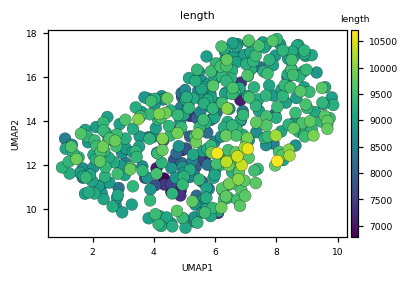

In [91]:
annot_path = "/home/arion/davidm/Data/references/human/assembly__GRCh38-hg38/annotation__gencode/gencode_34"
rnaseq.setup.annotate_genes(sc, genes_annot_name = "exonic_length", compute_length = {"start" : "exon_chrom_start", "stop" : "exon_chrom_end"}, save_path = annot_path + "/biomart_ens100", ow=True)

x = (sc.layers["raw"].toarray() > 0) * sc.var["exonic_length"].values.astype(float)
sc.obs["len"] = x.sum(1) / (sc.obs["NumGenesExpressed"]) #*sc.var["exonic_length"].values.astype(float).sum())
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["len"], \
s = 60, xlabel="UMAP1", ylabel="UMAP2", color_title = "length", title = "length", linewidth=0.15, order_color = "ascending")

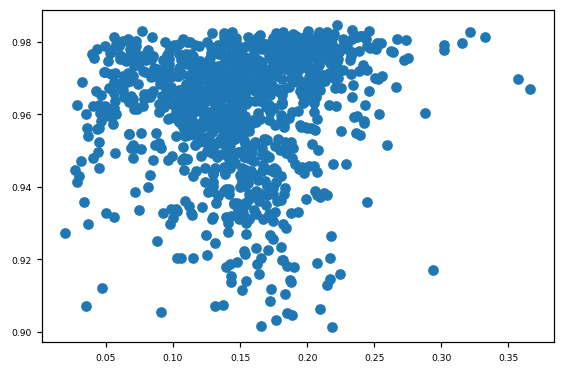

In [1591]:
plt.scatter(sc.obs["rp_frac"], sc.obs["DedupRate"])

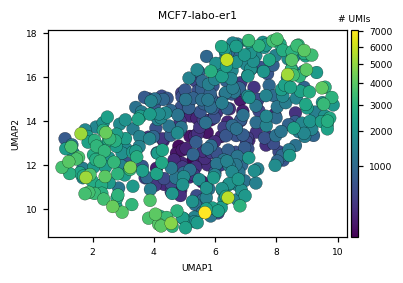

In [92]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["NumGenesExpressed"], \
    s = 70, norm = PowerNorm(0.5), palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "# UMIs",\
    title = new_sample_name, order_color = "ascending", save = "./figs/ns_umap_umis.pdf", linewidth=0.15)

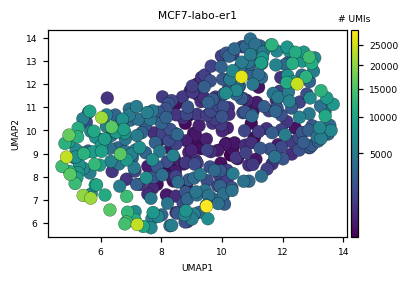

In [2190]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["DeduplicatedReads"], \
    s = 70, norm = PowerNorm(0.5), palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "# UMIs",\
    title = new_sample_name, order_color = "ascending", save = "./figs/ns_umap_umis.pdf", linewidth=0.15)

Annotating percentage_gene_gc_content using Biomart (Ensembl Genes 100, 'hsapiens_gene_ensembl')...


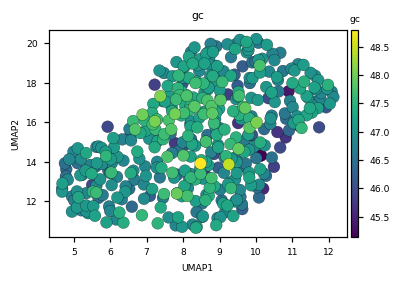

In [2305]:
# sc._inplace_subset_var([not g.startswith('AP') for g in sc.var["external_gene_name"]]);
# sc._inplace_subset_obs(sc.obs["total_UMIs"]<25000)
# sc._inplace_subset_var(sc.var["gene_biotype"]=="protein_coding")

rnaseq.setup.annotate_genes(sc, "percentage_gene_gc_content")

# x = sc.layers["raw"].toarray() * sc.var["percentage_gene_gc_content"].values.astype(float)
# sc.obs["gc"] = x.sum(1) / (sc.obs["total_UMIs"] * (sc.var["percentage_gene_gc_content"].values.astype(float)).sum())

x = sc.layers["raw"].toarray() * sc.var["percentage_gene_gc_content"].values.astype(float)
sc.obs["gc"] = x.sum(1) / sc.obs["total_UMIs"]
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["gc"], \
s = 60, xlabel="UMAP1", ylabel="UMAP2", color_title = "gc", title = "gc", linewidth=0.15, order_color = "ascending")

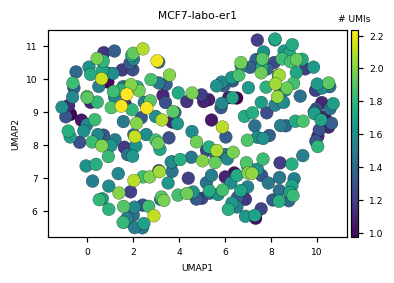

In [1189]:
sc.obs["n_umis"] = [('').join([s[-4:] for s in data[cb]]).count('G')/len(data[cb]) for cb in sc.obs_names]
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["n_umis"], \
    s = 70, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "# UMIs",\
    title = new_sample_name, order_color = "ascending", save = "./figs/ns_umap_umis.pdf", linewidth=0.15)

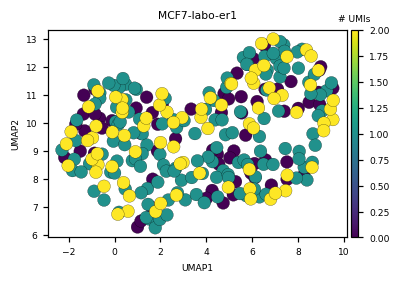

In [1137]:
pos1 = 8
pos2 = 10
sc.obs["n_umis"] = [(cb[pos1:pos2].count('G')+cb[pos1:pos2].count('C')) for cb in sc.obs_names]
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["n_umis"], \
    s = 70, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "# UMIs",\
    title = new_sample_name, order_color = "ascending", save = "./figs/ns_umap_umis.pdf", linewidth=0.15)

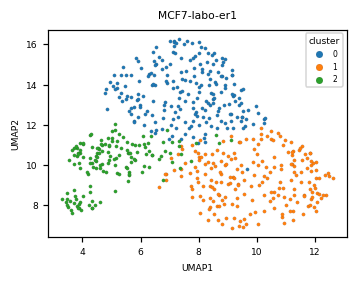

In [67]:
scanpy.tl.leiden(sc, key_added="cnv_leiden", resolution = 0.3, directed=True)

rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.obs["cnv_leiden"], \
    s = 5, xlabel="UMAP1", ylabel="UMAP2", color_title = "cluster", title = new_sample_name, linewidth=0.05)

In [68]:
sc._inplace_subset_obs(sc.obs["cnv_leiden"] != '2')

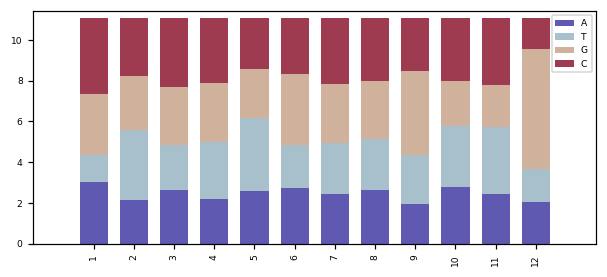

In [2274]:
import seaborn as sb 

nucleotides = ["A","T","G","C"]
freq = {f"{pos}": {nt : 0 for nt in nucleotides} for pos in np.arange(1,13)}

c = '1'

for barcode in sc.obs_names[sc.obs["cnv_leiden"] == c] :
    for pos in np.arange(1,13) :
        nt = list(barcode)[pos-1]
        freq[f"{pos}"][nt] += sc.obs["total_UMIs"].loc[barcode]/sc.obs["raw_cb_freq"].loc[barcode]


counts = np.array([list(list(freq.values())[i].values()) for i in np.arange(12)])
fig, ax = plt.subplots(figsize=(5.5,2.5))
ax.set_prop_cycle('color', sb.color_palette("twilight_shifted", 4))
bottom = 0
for c in counts.T :
    ax.bar(np.arange(12), c, width = 0.7, bottom = bottom)
    bottom += c

ax.legend(labels = nucleotides)
plt.xticks(np.arange(12), labels = freq.keys(), rotation = 90)
plt.ylim(0,np.max(bottom)+np.max(bottom)/30)
plt.xlim(-1.5,12.5)
plt.tight_layout()

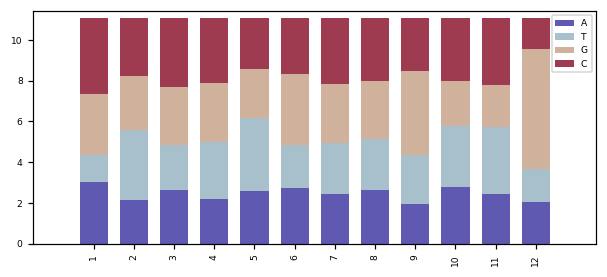

In [2273]:
import seaborn as sb 

nucleotides = ["A","T","G","C"]
freq = {f"{pos}": {nt : 0 for nt in nucleotides} for pos in np.arange(1,13)}

c = '1'

for barcode in sc.obs_names[sc.obs["cnv_leiden"] == c] :
    for pos in np.arange(1,13) :
        nt = list(barcode)[pos-1]
        freq[f"{pos}"][nt] += sc.obs["total_UMIs"].loc[barcode]/sc.obs["raw_cb_freq"].loc[barcode]


counts = np.array([list(list(freq.values())[i].values()) for i in np.arange(12)])
fig, ax = plt.subplots(figsize=(5.5,2.5))
ax.set_prop_cycle('color', sb.color_palette("twilight_shifted", 4))
bottom = 0
for c in counts.T :
    ax.bar(np.arange(12), c, width = 0.7, bottom = bottom)
    bottom += c

ax.legend(labels = nucleotides)
plt.xticks(np.arange(12), labels = freq.keys(), rotation = 90)
plt.ylim(0,np.max(bottom)+np.max(bottom)/30)
plt.xlim(-1.5,12.5)
plt.tight_layout()

In [2290]:
x = []
for cb in sc.obs_names :
    s = []
    for nt in cb :
        s.append(int(nt, base = 36))
    x.append(s)
x = np.array(x)

In [2288]:
import umap

In [2301]:
um = umap.UMAP(10)
um.fit(x)

UMAP(dens_frac=0.0, dens_lambda=0.0, n_neighbors=10)

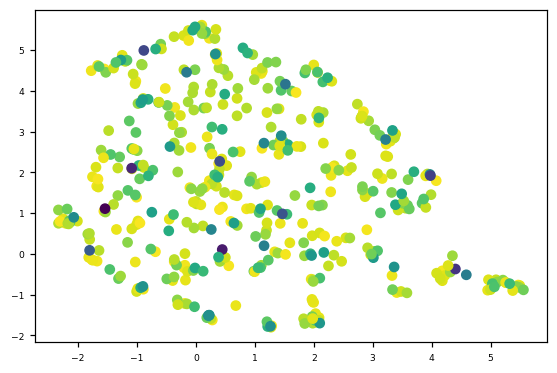

In [2302]:
plt.scatter(um.embedding_[:,0], um.embedding_[:,1], c = sc.obs["DedupRate"])

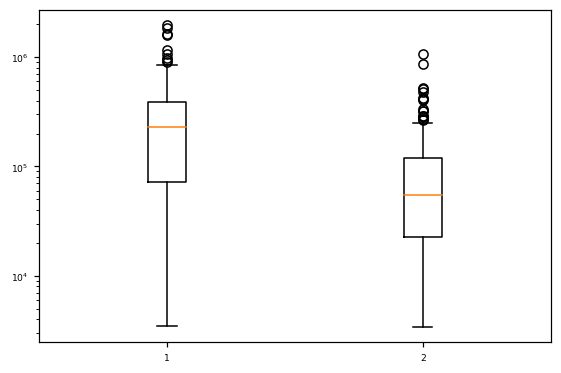

In [2083]:
plt.boxplot([sc.obs["raw_cb_freq"][sc.obs["cnv_leiden"] == '0'], sc.obs["raw_cb_freq"][sc.obs["cnv_leiden"] == '1']])
plt.yscale('log');

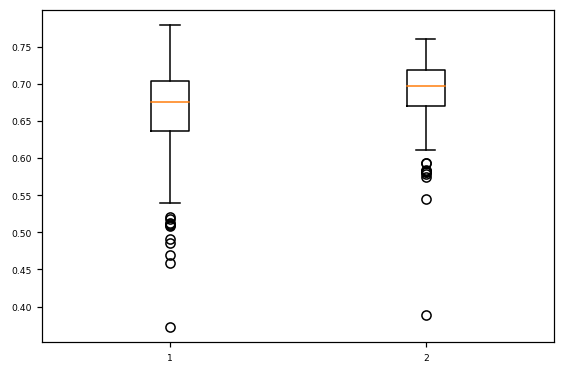

In [2324]:
plt.boxplot([sc.obs["MappingRate"][sc.obs["cnv_leiden"] == '0'], sc.obs["MappingRate"][sc.obs["cnv_leiden"] == '1']]);

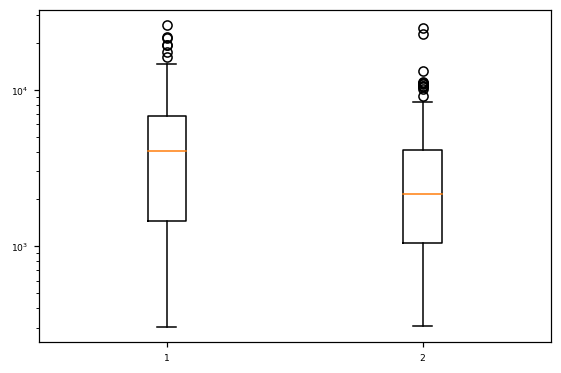

In [2087]:
plt.boxplot([sc.obs["total_UMIs"][sc.obs["cnv_leiden"] == '0'], sc.obs["total_UMIs"][sc.obs["cnv_leiden"] == '1']])
plt.yscale('log');

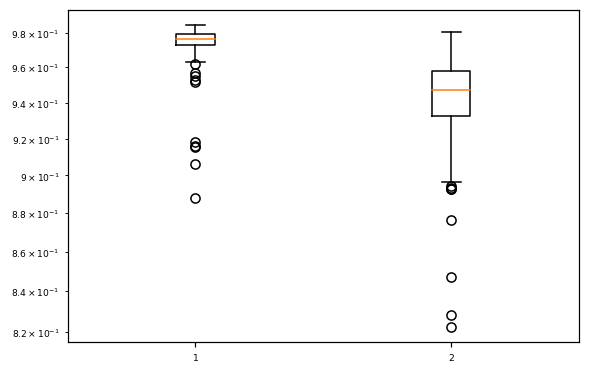

In [2085]:
plt.boxplot([sc.obs["DedupRate"][sc.obs["cnv_leiden"] == '0'], sc.obs["DedupRate"][sc.obs["cnv_leiden"] == '1']])
plt.yscale('log');

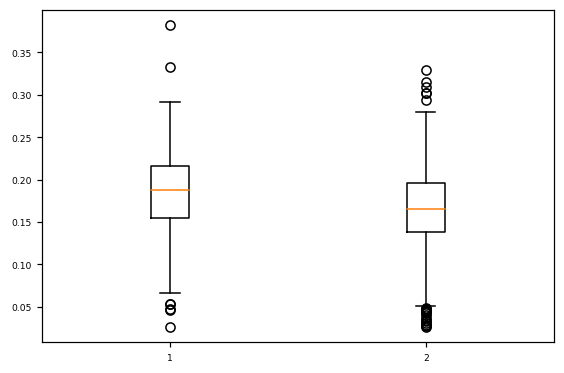

In [163]:
plt.boxplot([sc.obs["rp_frac"][sc.obs["error"] == 'True'], sc.obs["rp_frac"][sc.obs["error"] == 'False']]);

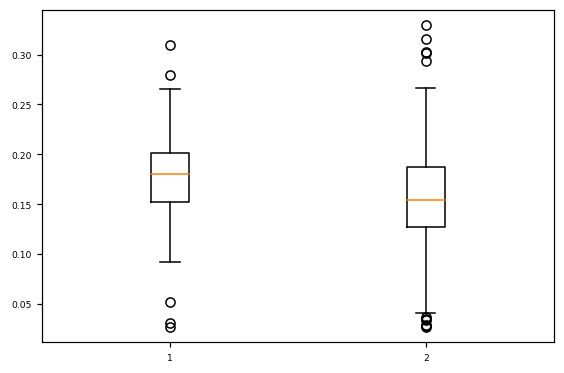

In [166]:
plt.boxplot([sc.obs["rp_frac"][(sc.obs["original"] == 'True') & (sc.obs["error"] == 'False')], sc.obs["rp_frac"][(sc.obs["original"] == 'False') & (sc.obs["error"] == 'False')]]);

In [2088]:
sc.var_names = sc.var["external_gene_name"].values
scanpy.tl.rank_genes_groups(sc, groupby="cnv_leiden", reference="1", n_genes=len(sc.var_names),rankby_abs=True)

/u/davidm/VirtualEns/python_3.9.5/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'samples' as categorical
/u/davidm/VirtualEns/python_3.9.5/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'project_id' as categorical
/u/davidm/VirtualEns/python_3.9.5/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in

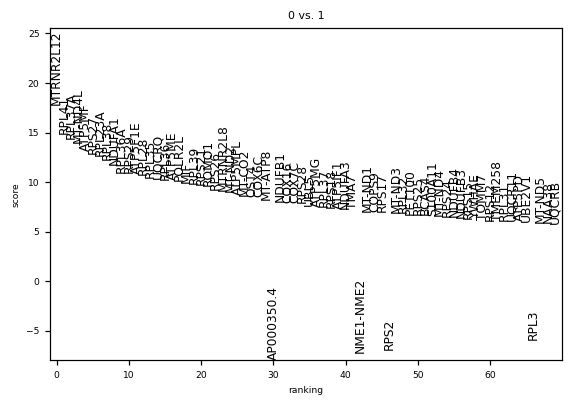

In [2104]:
scanpy.pl.rank_genes_groups(sc, n_genes=70)

/u/davidm/Documents/Master-thesis/Scripts/RNA-seq/python/rnaseq/dea.py:38: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = pd.DataFrame(np.array(data[gene_set_library])[:,1:], columns=["Term", "P-value", "Z-score", "Combined Score", "Genes", "Adjusted P-value", "Old P-value", "Old adjusted P-value"])


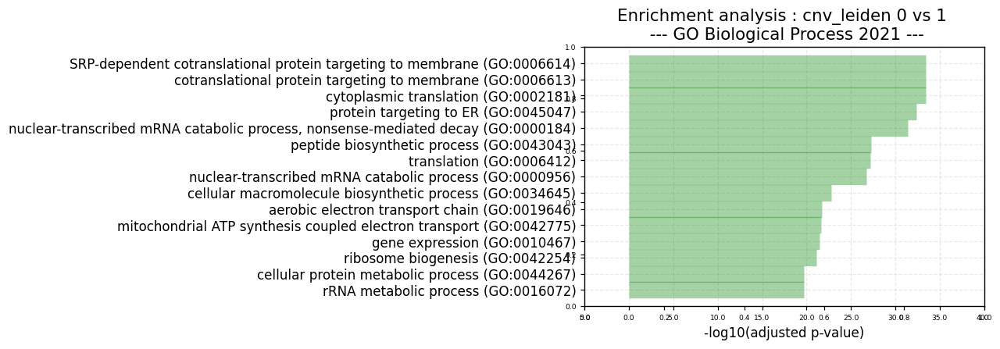

,index,Term,P-value,Z-score,Combined Score,Genes,Adjusted P-value,Old P-value,Old adjusted P-value,color
0,13,rRNA metabolic process (GO:0016072),0.0,31.975069,1563.509484,"[RPL41, RPL31, RPL36A, RPL23A, RPS15, RPS25, RPS28, RPS17, RPS27, RPL37A, RPL36, RPL35, RPLP2, RPL38, RPL37, RPL29, RPL28, RPL39, UBA52, RPS24]",19.704979,0,0,green
1,14,cellular protein metabolic process (GO:0044267),0.0,16.877596,824.445082,"[RPL31, RPL36A, RPS15, UBL5, RPS17, RPS15A, RPL36, RPL35, RPLP2, RPL38, RPL37, RPL39, RPS12, RPL41, RPL23A, RPS26, MRPL52, RPS25, RPS28, RPS27, RPS29, RPL37A, RPL29, RPL28, RPS21, UBA52, RPS24]",19.704979,0,0,green
2,12,ribosome biogenesis (GO:0042254),0.0,30.028097,1565.571657,"[RPL41, RPL31, RPL36A, RPL23A, MRPL22, RPS15, RPS25, RPS28, RPS17, RPS27, RPL37A, RPL36, RPL35, RPLP2, RPL38, RPL37, RPL29, RBIS, RPL28, RPL39, UBA52, RPS24]",21.070966,0,0,green
3,11,gene expression (GO:0010467),0.0,20.069453,1064.289979,"[RPL31, RPL36A, RPS15, RPS17, RPS15A, RPL36, RPL35, RPLP2, RPL38, RPL37, POLR2I, RPL39, RPS12, POLR2L, RPL41, RPL23A, RPS26, MRPL52, RPS25, RPS28, RPS27, RPS29, RPL37A, RPL29, RPL28, RPS21, RPS24]",21.424225,0,0,green
4,10,mitochondrial ATP synthesis coupled electron transport (GO:0042775),0.0,69.395679,3720.409172,"[COX8A, COX7B, NDUFB7, NDUFA6, UQCRB, NDUFB4, NDUFA3, NDUFB3, NDUFA2, NDUFB2, NDUFA1, NDUFB1, UQCR11, COX5B, COX6C, COX7C, UQCRQ]",21.638847,0,0,green
5,9,aerobic electron transport chain (GO:0019646),0.0,70.708595,3809.848307,"[COX8A, COX7B, NDUFB7, NDUFA6, UQCRB, NDUFB4, NDUFA3, NDUFB3, NDUFA2, NDUFB2, NDUFA1, NDUFB1, UQCR11, COX5B, COX6C, COX7C, UQCRQ]",21.714470,0,0,green
6,8,cellular macromolecule biosynthetic process (GO:0034645),0.0,23.055836,1300.225195,"[RPL31, RPL36A, RPS15, RPS17, RPS15A, RPL36, RPL35, RPLP2, RPL38, RPL37, POLR2I, RPL39, RPS12, POLR2L, RPL41, RPL23A, RPS26, MRPL52, RPS25, RPS28, RPS27, RPS29, RPL37A, RPL29, RPL28, RPS21, RPS24]",22.760374,0,0,green
7,7,nuclear-transcribed mRNA catabolic process (GO:0000956),0.0,41.2358,2708.602314,"[RPL31, RPL36A, RPS15, RPS17, RPS15A, RPL36, RPL35, RPLP2, RPL38, RPL37, RPL39, RPS12, RPL41, RPL23A, RPS26, RPS25, RPS28, RPS27, RPS29, RPL37A, RPL29, RPL28, RPS21, UBA52, RPS24]",26.744284,0,0,green
8,6,translation (GO:0006412),0.0,35.565642,2379.990693,"[RPL31, RPL36A, RPS15, RPS17, RPS15A, RPL36, RPL35, RPLP2, RPL38, RPL37, RPL39, RPS12, RPL41, TMA7, RPL23A, RPS26, MRPL52, RPS25, RPS28, RPS27, RPS29, RPL37A, RPL29, RPL28, RPS21, UBA52, RPS24]",27.221585,0,0,green
9,5,peptide biosynthetic process (GO:0043043),0.0,43.96475,2950.46962,"[RPL31, RPL36A, RPS15, RPS17, RPS15A, RPL36, RPL35, RPLP2, RPL38, RPL37, RPL39, RPS12, RPL41, RPL23A, RPS26, MRPL52, RPS25, RPS28, RPS27, RPS29, RPL37A, RPL29, RPL28, RPS21, RPS24]",27.237865,0,0,green


/u/davidm/Documents/Master-thesis/Scripts/RNA-seq/python/rnaseq/dea.py:38: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = pd.DataFrame(np.array(data[gene_set_library])[:,1:], columns=["Term", "P-value", "Z-score", "Combined Score", "Genes", "Adjusted P-value", "Old P-value", "Old adjusted P-value"])


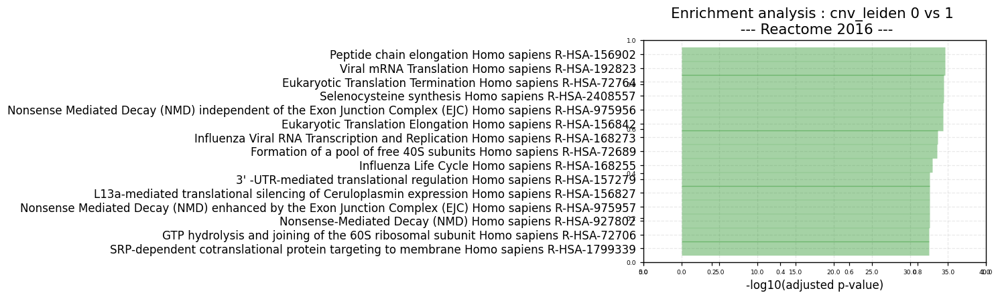

,index,Term,P-value,Z-score,Combined Score,Genes,Adjusted P-value,Old P-value,Old adjusted P-value,color
0,13,SRP-dependent cotranslational protein targeting to membrane Homo sapiens R-HSA-1799339,0.0,73.657793,5771.422776,"[RPL31, RPL36A, RPS15, RPS17, RPS15A, RPL36, RPL35, RPLP2, RPL38, RPL37, RPL39, RPS12, RPL41, RPL23A, RPS26, RPS25, RPS28, RPS27, RPS29, RPL37A, RPL29, RPL28, UBA52, RPS21, RPS24]",32.498320,0,0,green
1,14,GTP hydrolysis and joining of the 60S ribosomal subunit Homo sapiens R-HSA-72706,0.0,73.657793,5771.422776,"[RPL31, RPL36A, RPS15, RPS17, RPS15A, RPL36, RPL35, RPLP2, RPL38, RPL37, RPL39, RPS12, RPL41, RPL23A, RPS26, RPS25, RPS28, RPS27, RPS29, RPL37A, RPL29, RPL28, UBA52, RPS21, RPS24]",32.498320,0,0,green
2,9,Nonsense-Mediated Decay (NMD) Homo sapiens R-HSA-927802,0.0,74.570912,5862.519379,"[RPL31, RPL36A, RPS15, RPS17, RPS15A, RPL36, RPL35, RPLP2, RPL38, RPL37, RPL39, RPS12, RPL41, RPL23A, RPS26, RPS25, RPS28, RPS27, RPS29, RPL37A, RPL29, RPL28, UBA52, RPS21, RPS24]",32.550026,0,0,green
3,10,Nonsense Mediated Decay (NMD) enhanced by the Exon Junction Complex (EJC) Homo sapiens R-HSA-975957,0.0,74.570912,5862.519379,"[RPL31, RPL36A, RPS15, RPS17, RPS15A, RPL36, RPL35, RPLP2, RPL38, RPL37, RPL39, RPS12, RPL41, RPL23A, RPS26, RPS25, RPS28, RPS27, RPS29, RPL37A, RPL29, RPL28, UBA52, RPS21, RPS24]",32.550026,0,0,green
4,11,L13a-mediated translational silencing of Ceruloplasmin expression Homo sapiens R-HSA-156827,0.0,74.570912,5862.519379,"[RPL31, RPL36A, RPS15, RPS17, RPS15A, RPL36, RPL35, RPLP2, RPL38, RPL37, RPL39, RPS12, RPL41, RPL23A, RPS26, RPS25, RPS28, RPS27, RPS29, RPL37A, RPL29, RPL28, UBA52, RPS21, RPS24]",32.550026,0,0,green
5,12,3' -UTR-mediated translational regulation Homo sapiens R-HSA-157279,0.0,74.570912,5862.519379,"[RPL31, RPL36A, RPS15, RPS17, RPS15A, RPL36, RPL35, RPLP2, RPL38, RPL37, RPL39, RPS12, RPL41, RPL23A, RPS26, RPS25, RPS28, RPS27, RPS29, RPL37A, RPL29, RPL28, UBA52, RPS21, RPS24]",32.550026,0,0,green
6,8,Influenza Life Cycle Homo sapiens R-HSA-168255,0.0,61.257798,4895.089824,"[RPL31, RPL36A, RPS15, RPS17, RPS15A, RPL36, RPL35, RPLP2, RPL38, RPL37, POLR2I, RPL39, RPS12, POLR2L, RPL41, RPL23A, RPS26, RPS25, RPS28, RPS27, RPS29, RPL37A, RPL29, RPL28, RPS21, UBA52, RPS24]",32.951849,0,0,green
7,7,Formation of a pool of free 40S subunits Homo sapiens R-HSA-72689,0.0,85.116798,6929.18584,"[RPL31, RPL36A, RPS15, RPS17, RPS15A, RPL36, RPL35, RPLP2, RPL38, RPL37, RPL39, RPS12, RPL41, RPL23A, RPS26, RPS25, RPS28, RPS27, RPS29, RPL37A, RPL29, RPL28, UBA52, RPS21, RPS24]",33.551405,0,0,green
8,6,Influenza Viral RNA Transcription and Replication Homo sapiens R-HSA-168273,0.0,66.136634,5403.519242,"[RPL31, RPL36A, RPS15, RPS17, RPS15A, RPL36, RPL35, RPLP2, RPL38, RPL37, POLR2I, RPL39, RPS12, POLR2L, RPL41, RPL23A, RPS26, RPS25, RPS28, RPS27, RPS29, RPL37A, RPL29, RPL28, RPS21, UBA52, RPS24]",33.621266,0,0,green
9,4,Eukaryotic Translation Elongation Homo sapiens R-HSA-156842,0.0,94.459794,7894.328994,"[RPL31, RPL36A, RPS15, RPS17, RPS15A, RPL36, RPL35, RPLP2, RPL38, RPL37, RPL39, RPS12, RPL41, RPL23A, RPS26, RPS25, RPS28, RPS27, RPS29, RPL37A, RPL29, RPL28, UBA52, RPS21, RPS24]",34.366913,0,0,green


/u/davidm/Documents/Master-thesis/Scripts/RNA-seq/python/rnaseq/dea.py:38: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = pd.DataFrame(np.array(data[gene_set_library])[:,1:], columns=["Term", "P-value", "Z-score", "Combined Score", "Genes", "Adjusted P-value", "Old P-value", "Old adjusted P-value"])


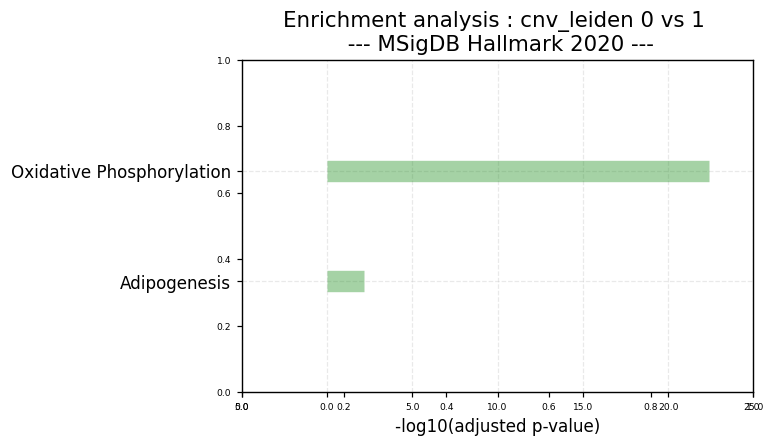

,index,Term,P-value,Z-score,Combined Score,Genes,Adjusted P-value,Old P-value,Old adjusted P-value,color
0,1,Adipogenesis,0.000726,6.032153,43.603035,"[COX8A, COX7B, NDUFB7, UQCRQ, DDT, UQCR11]",2.139270,0,0,green
1,0,Oxidative Phosphorylation,0.0,30.499596,1665.951098,"[COX8A, COX7B, NDUFB7, ATP5PD, NDUFA6, UQCRB, NDUFB4, NDUFA3, NDUFB3, NDUFA2, NDUFB2, NDUFA1, NDUFB1, UQCR11, COX7A2, COX6C, COX5B, COX7C, ATP5F1E, UQCRQ, ATP5MG, ATP5MF, ATP5ME]",22.421034,0,0,green


/u/davidm/Documents/Master-thesis/Scripts/RNA-seq/python/rnaseq/dea.py:38: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = pd.DataFrame(np.array(data[gene_set_library])[:,1:], columns=["Term", "P-value", "Z-score", "Combined Score", "Genes", "Adjusted P-value", "Old P-value", "Old adjusted P-value"])


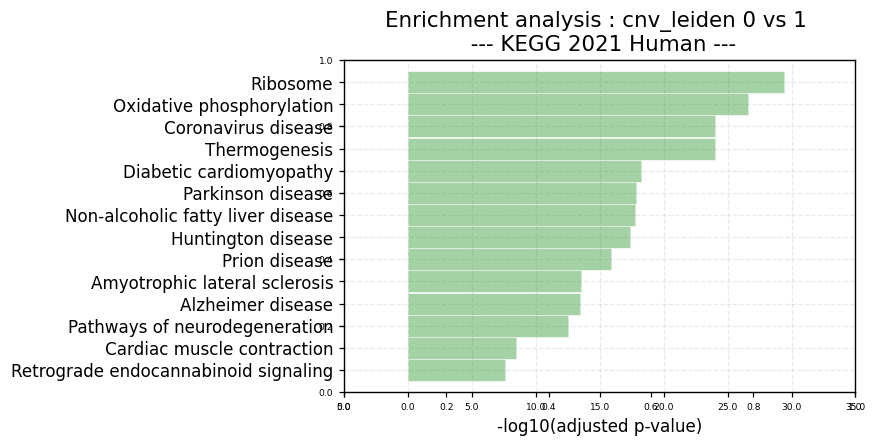

,index,Term,P-value,Z-score,Combined Score,Genes,Adjusted P-value,Old P-value,Old adjusted P-value,color
0,13,Retrograde endocannabinoid signaling,0.0,14.757956,277.325453,"[NDUFB7, NDUFA6, GNG5, NDUFB4, NDUFA3, NDUFB3, NDUFA2, NDUFB2, NDUFA1, NDUFB1]",7.591208,0,0,green
1,12,Cardiac muscle contraction,0.0,23.330063,485.302157,"[COX8A, COX7B, UQCRB, UQCRQ, COX7A2, UQCR11, COX5B, COX6C, COX7C]",8.431951,0,0,green
2,11,Pathways of neurodegeneration,0.0,10.455358,315.964472,"[COX8A, COX7B, NDUFB7, ATP5PD, NDUFA6, UQCRB, NDUFB4, NDUFA3, NDUFB3, NDUFA2, NDUFB2, NDUFA1, NDUFB1, UQCR11, COX7A2, COX6C, COX5B, COX7C, ATP5F1E, UQCRQ, UBA52]",12.487705,0,0,green
3,10,Alzheimer disease,0.0,12.873563,419.712449,"[COX8A, COX7B, NDUFB7, ATP5PD, NDUFA6, UQCRB, NDUFB4, NDUFA3, NDUFB3, NDUFA2, NDUFB2, NDUFA1, NDUFB1, UQCR11, COX7A2, COX6C, COX5B, COX7C, ATP5F1E, UQCRQ]",13.484546,0,0,green
4,9,Amyotrophic lateral sclerosis,0.0,13.06402,429.307344,"[COX8A, COX7B, NDUFB7, ATP5PD, NDUFA6, UQCRB, NDUFB4, NDUFA3, NDUFB3, NDUFA2, NDUFB2, NDUFA1, NDUFB1, UQCR11, COX7A2, COX6C, COX5B, COX7C, ATP5F1E, UQCRQ]",13.555699,0,0,green
5,8,Prion disease,0.0,17.845623,685.535691,"[COX8A, COX7B, NDUFB7, ATP5PD, NDUFA6, UQCRB, NDUFB4, NDUFA3, NDUFB3, NDUFA2, NDUFB2, NDUFA1, NDUFB1, UQCR11, COX7A2, COX6C, COX5B, COX7C, ATP5F1E, UQCRQ]",15.921567,0,0,green
6,7,Huntington disease,0.0,17.870671,748.318193,"[COX8A, COX7B, NDUFB7, ATP5PD, NDUFA6, UQCRB, NDUFB4, NDUFA3, NDUFB3, NDUFA2, NDUFB2, NDUFA1, NDUFB1, UQCR11, COX7A2, COX6C, COX5B, COX7C, ATP5F1E, UQCRQ, POLR2I, POLR2L]",17.372775,0,0,green
7,6,Non-alcoholic fatty liver disease,0.0,29.164931,1250.621962,"[COX8A, COX7B, NDUFB7, NDUFA6, UQCRB, NDUFB4, NDUFA3, NDUFB3, NDUFA2, NDUFB2, NDUFA1, NDUFB1, UQCR11, COX7A2, COX6C, COX5B, COX7C, UQCRQ]",17.752085,0,0,green
8,5,Parkinson disease,0.0,21.061047,911.097892,"[COX8A, COX7B, NDUFB7, ATP5PD, NDUFA6, UQCRB, NDUFB4, NDUFA3, NDUFB3, NDUFA2, NDUFB2, NDUFA1, NDUFB1, UQCR11, COX7A2, COX6C, COX5B, COX7C, ATP5F1E, UQCRQ, UBA52]",17.849666,0,0,green
9,4,Diabetic cardiomyopathy,0.0,24.759751,1096.889527,"[COX8A, COX7B, NDUFB7, ATP5PD, NDUFA6, UQCRB, NDUFB4, NDUFA3, NDUFB3, NDUFA2, NDUFB2, NDUFA1, NDUFB1, UQCR11, COX7A2, COX6C, COX5B, COX7C, ATP5F1E, UQCRQ]",18.222783,0,0,green


/u/davidm/Documents/Master-thesis/Scripts/RNA-seq/python/rnaseq/dea.py:38: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = pd.DataFrame(np.array(data[gene_set_library])[:,1:], columns=["Term", "P-value", "Z-score", "Combined Score", "Genes", "Adjusted P-value", "Old P-value", "Old adjusted P-value"])


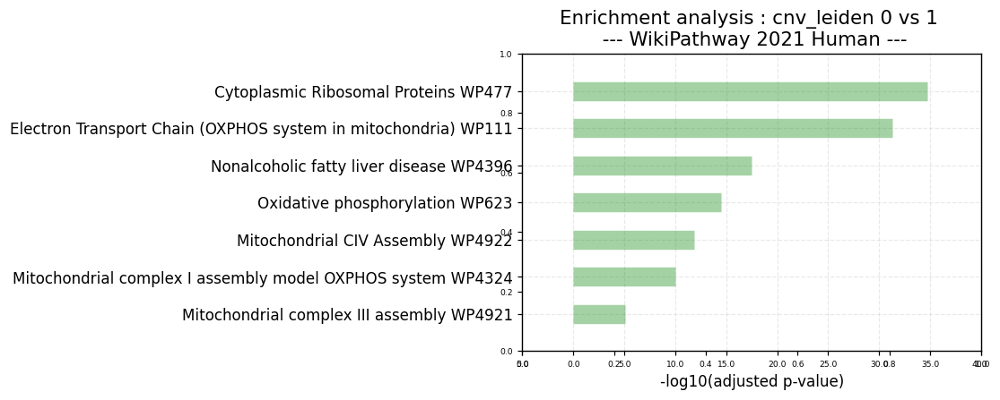

,index,Term,P-value,Z-score,Combined Score,Genes,Adjusted P-value,Old P-value,Old adjusted P-value,color
0,6,Mitochondrial complex III assembly WP4921,0.000001,64.339806,870.005658,"[UQCRB, UQCC2, UQCRQ, UQCR11]",5.104863,0,0,green
1,5,Mitochondrial complex I assembly model OXPHOS system WP4324,0.0,38.77855,964.799844,"[NDUFB7, NDUFA6, NDUFB4, NDUFA3, NDUFB3, NDUFA2, NDUFB2, NDUFA1, NDUFB1]",9.970497,0,0,green
2,4,Mitochondrial CIV Assembly WP4922,0.0,70.173862,2067.503847,"[COX8A, COX7B, COX16, PET100, COX7A2, COX14, COX5B, COX6C, COX7C]",11.881627,0,0,green
3,3,Oxidative phosphorylation WP623,0.0,52.223684,1861.749073,"[NDUFB7, NDUFA6, ATP5PD, NDUFB4, NDUFA3, NDUFA2, NDUFB2, NDUFB1, ATP5MG, ATP5MF, ATP5F1E, ATP5ME]",14.471664,0,0,green
4,2,Nonalcoholic fatty liver disease WP4396,0.0,29.164931,1250.621962,"[COX8A, COX7B, NDUFB7, NDUFA6, UQCRB, NDUFB4, NDUFA3, NDUFB3, NDUFA2, NDUFB2, NDUFA1, NDUFB1, UQCR11, COX7A2, COX6C, COX5B, COX7C, UQCRQ]",17.487328,0,0,green
5,1,Electron Transport Chain (OXPHOS system in mitochondria) WP111,0.0,72.52341,5446.130591,"[COX8A, COX7B, NDUFB7, ATP5PD, NDUFA6, UQCRB, NDUFB4, NDUFA3, NDUFB3, NDUFA2, NDUFB2, NDUFA1, NDUFB1, COX7A2, UQCR11, COX5B, COX6C, COX7C, ATP5F1E, ATP5IF1, UQCRQ, ATP5MG, ATP5MF, ATP5ME]",31.301501,0,0,green
6,0,Cytoplasmic Ribosomal Proteins WP477,0.0,94.459794,7894.328994,"[RPL31, RPL36A, RPS15, RPS17, RPS15A, RPL36, RPL35, RPLP2, RPL38, RPL37, RPL39, RPS12, RPL41, RPL23A, RPS26, RPS25, RPS28, RPS27, RPS29, RPL37A, RPL29, RPL28, UBA52, RPS21, RPS24]",34.682696,0,0,green


In [2105]:
rnaseq.dea.enrichr(sc, group = "0", libraries=["GO_Biological_Process_2021", "Reactome_2016","MSigDB_Hallmark_2020","KEGG_2021_Human","WikiPathway_2021_Human"], lfc_cutoff=1, top = 15, pval_cutoff_enr = 0.01,  pval_cutoff_de = 0.01)

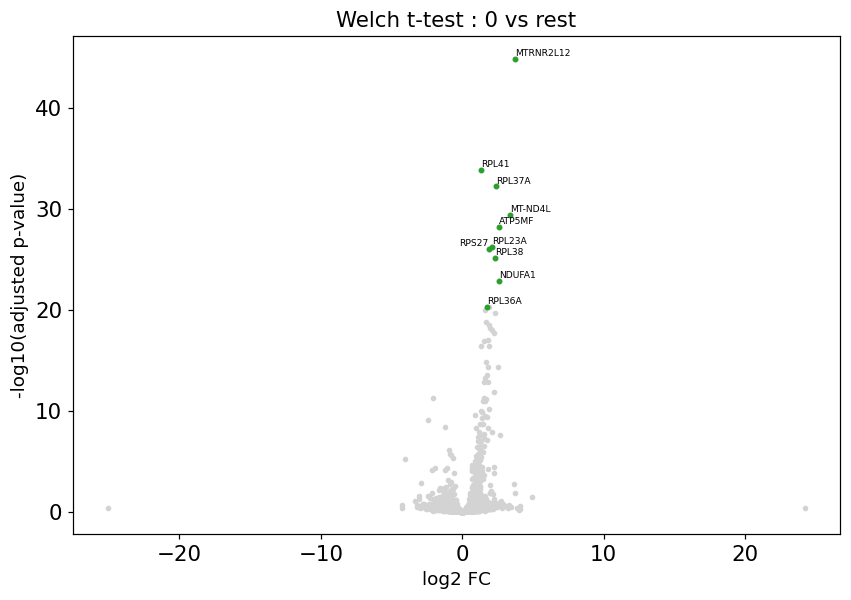

In [2103]:
rnaseq.dea.volcano_plot(sc, group="0", top=10, show_genes = 'up')

In [2310]:
import gseapy as gp
importlib.reload(gp)

<module 'gseapy' from '/u/davidm/VirtualEns/python_3.9.5/lib/python3.9/site-packages/gseapy/__init__.py'>

In [2311]:
rnaseq.setup.annotate_genes(sc, 'description')

Annotating description using Biomart (Ensembl Genes 100, 'hsapiens_gene_ensembl')...


In [2314]:
gene_exp = pd.DataFrame(sc.X.toarray().T, columns = sc.obs["CB"].values)
class_vector = (sc.obs["cnv_leiden"].values == '1').astype(str)
class_vector = np.where(class_vector == 'True', "cluster", class_vector) 
class_vector = np.where(class_vector == 'False', "rest", class_vector) 

In [2315]:
idx = np.argsort(class_vector)
gene_exp = gene_exp[gene_exp.columns[idx]]
gene_exp.insert(0, "DESCRIPTION", sc.var["description"].values, True)
gene_exp.insert(0, "NAME", sc.var["external_gene_name"].values, True)

class_vector = list(class_vector[idx])

In [ ]:
gs_res = gp.gsea(gene_exp, # ordata='./P53_resampling_data.txt'
                 'Reactome_2016', # enrichr library names
                  class_vector,
                 # set permutation_type to phenotype if samples >=15
                 permutation_type='phenotype',
                 permutation_num=100, # reduce number to speed up test
                 outdir=None,  # do not write output to disk
                 no_plot=True, # Skip plotting
                 method='signal_to_noise',
                 processes=4, seed= 7,
                 format='png')

2021-11-29 05:17:15,248 Warning: dropping duplicated gene names, only keep the first values


In [ ]:
res = gs_res.res2d.sort_values(by='nes', ascending=False)
res = res.loc[res.index[(res['fdr'].values < 0.05) & (res['pval'].values < 0.05)]]

In [ ]:
res

In [2321]:
res

,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
Term,,,,,,,,
Myc Targets V1,0.497128,2.223279,0.000000,0.000000,200,200,RPS2;RPS3;RPLP0;ILF2;PHB;CANX;CYC1;NPM1;U2AF1;...,RPS2;RPS3;RPLP0;ILF2;PHB;CANX;CYC1;NPM1;U2AF1;...
E2F Targets,0.493803,2.062519,0.000000,0.000000,200,200,MAD2L1;H2AZ1;DONSON;DCTPP1;RAN;CKS1B;SRSF1;LMN...,MAD2L1;H2AZ1;DONSON;DCTPP1;RAN;CKS1B;SRSF1;LMN...
G2-M Checkpoint,0.438685,2.030405,0.000000,0.000000,200,197,MAD2L1;H2AZ2;H2AZ1;CKS1B;SRSF1;RAD23B;HNRNPU;L...,MAD2L1;H2AZ2;H2AZ1;CKS1B;SRSF1;RAD23B;HNRNPU;L...
Androgen Response,0.423841,1.934301,0.000000,0.000000,100,86,UBE2I;B2M;LMAN1;H1-0;KRT19;TMEM50A;PLPP1;ADRM1...,UBE2I;B2M;LMAN1;H1-0;KRT19;TMEM50A;PLPP1;ADRM1...
Pperoxisome,0.396558,1.903828,0.000000,0.000000,104,83,YWHAH;ELOVL5;ECH1;FDPS;SLC25A4;FADS1;ITGB1BP1;...,YWHAH;ELOVL5;ECH1;FDPS;SLC25A4;FADS1;ITGB1BP1;...
Myc Targets V2,0.458435,1.840957,0.032258,0.006195,58,58,PHB;NPM1;DCTPP1;AIMP2;SRM;HSPD1;PPRC1;PPAN;SLC...,PHB;NPM1;DCTPP1;AIMP2;SRM;HSPD1;PPRC1;PPAN;SLC...
Unfolded Protein Response,0.373690,1.836537,0.000000,0.005310,113,110,NPM1;CKS1B;IARS1;LSM4;HSPA5;PDIA6;DNAJA4;CEBPB...,NPM1;CKS1B;IARS1;LSM4;HSPA5;PDIA6;DNAJA4;CEBPB...
mTORC1 Signaling,0.387947,1.772467,0.000000,0.004646,200,188,CANX;CD9;PSMA4;PSMC4;LDHA;HSPA5;PSMB5;ELOVL5;T...,CANX;CD9;PSMA4;PSMC4;LDHA;HSPA5;PSMB5;ELOVL5;T...
Estrogen Response Late,0.354146,1.696172,0.000000,0.016521,200,181,CD9;PRSS23;KRT19;SERPINA3;PLXNB1;MDK;ELOVL5;PD...,CD9;PRSS23;KRT19;SERPINA3;PLXNB1;MDK;ELOVL5;PD...


In [2318]:
res

,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
Term,,,,,,,,
Proteasome,0.729763,2.402446,0.0,0.000000,46,43,PSMD4;PSMC5;PSMA2;PSMA5;PSMB7;PSMA4;PSMC4;PSMB...,PSMD4;PSMC5;PSMA2;PSMA5;PSMB7;PSMA4;PSMC4;PSMB...
Spinocerebellar ataxia,0.490566,2.222767,0.0,0.000000,143,104,SLC25A5;PSMD4;PSMC5;PSMA2;PSMA5;PSMB7;PSMA4;PS...,SLC25A5;PSMD4;PSMC5;PSMA2;PSMA5;PSMB7;PSMA4;PS...
Tight junction,0.452813,2.077698,0.0,0.011795,169,121,TUBA1B;MYL12B;ARPC5;PCNA;RAC1;MARVELD2;PPP2R1A...,TUBA1B;MYL12B;ARPC5;PCNA;RAC1;MARVELD2;PPP2R1A...
Protein processing in endoplasmic reticulum,0.433852,2.061717,0.0,0.008846,171,154,CANX;STUB1;BCAP31;LMAN1;VCP;RAD23B;HSPA5;HSP90...,CANX;STUB1;BCAP31;LMAN1;VCP;RAD23B;HSPA5;HSP90...
Staphylococcus aureus infection,0.746852,2.035364,0.0,0.008256,95,15,KRT18;HLA-DRB5;KRT19;C5;C3;FCAR;KRT10;HLA-DRB1...,KRT18;HLA-DRB5;KRT19;C5
Necroptosis,0.417552,1.900437,0.0,0.029487,159,111,SLC25A5;FTL;H2AZ2;H2AZ1;FTH1;BID;HSP90AB1;HSP9...,SLC25A5;FTL;H2AZ2;H2AZ1;FTH1;BID;HSP90AB1;HSP9...
Pathogenic Escherichia coli infection,0.388609,1.867080,0.0,0.037911,197,141,RPS3;TUBA1B;TMBIM6;ARPC5;RAC1;ACTG1;ARPC1B;ACT...,RPS3;TUBA1B;TMBIM6;ARPC5;RAC1;ACTG1;ARPC1B;ACT...
Fluid shear stress and atherosclerosis,0.407174,1.862173,0.0,0.034647,139,99,KEAP1;HSP90AB1;HSP90AA1;RAC1;ACTG1;SDC2;SUMO1;...,KEAP1;HSP90AB1;HSP90AA1;RAC1;ACTG1;SDC2;SUMO1;...
Amino sugar and nucleotide sugar metabolism,0.470297,1.859788,0.0,0.031452,48,39,PMM1;NANS;HEXB;HK1;GNPDA1;GALE;CMAS;FCSK;HEXA;...,PMM1;NANS;HEXB;HK1;GNPDA1;GALE;CMAS;FCSK;HEXA;...


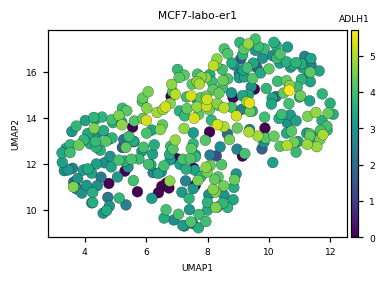

In [2091]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.X.toarray()[:, sc.var["external_gene_name"].values == "KRT8"], \
    s = 50, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "ADLH1",order_color="ascending",\
    title = new_sample_name, save = "./figs/s_umap_CCNB1.pdf", linewidth=0.15)

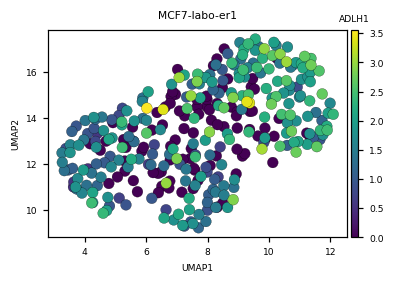

In [2092]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.X.toarray()[:, sc.var["external_gene_name"].values == "PPP1CA"], \
    s = 50, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "ADLH1",order_color="ascending",\
    title = new_sample_name, save = "./figs/s_umap_CCNB1.pdf", linewidth=0.15)

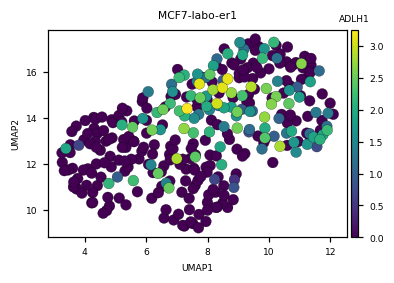

In [2093]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.X.toarray()[:, sc.var["external_gene_name"].values == "NME1-NME2"], \
    s = 50, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "ADLH1",\
    title = new_sample_name, save = "./figs/s_umap_CCNB1.pdf", linewidth=0.15, order_color="ascending")

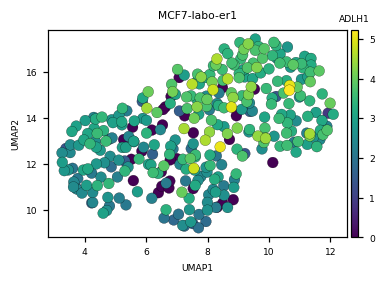

In [2095]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.X.toarray()[:, sc.var["external_gene_name"].values == "RPS2"], \
    s = 50, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "ADLH1",\
    title = new_sample_name, save = "./figs/s_umap_CCNB1.pdf", linewidth=0.15, order_color="ascending")

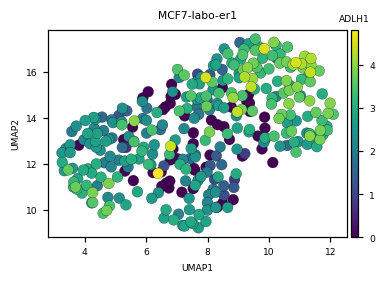

In [2096]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.X.toarray()[:, sc.var["external_gene_name"].values == "SLC25A5"], \
    s = 50, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "ADLH1",\
    title = new_sample_name, save = "./figs/s_umap_CCNB1.pdf", linewidth=0.15, order_color="ascending")

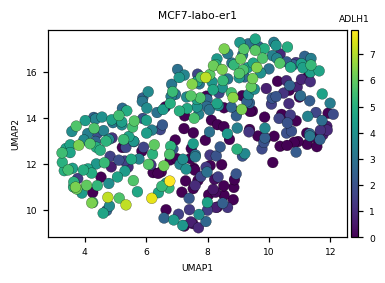

In [2097]:
rnaseq.plotting.scatter(sc.obsm["X_umap"][:,0], sc.obsm["X_umap"][:,1], color = sc.X.toarray()[:, sc.var["external_gene_name"].values == "TFF1"], \
    s = 50, palette = "viridis", xlabel="UMAP1", ylabel="UMAP2", color_title = "ADLH1",\
    title = new_sample_name, save = "./figs/s_umap_CCNB1.pdf", linewidth=0.15,order_color="ascending")

### Errors patterns

In [61]:
n_neighbors_cl0 = neighbors_mtx.loc[errors].sum(1)
stats.pearsonr(n_neighbors_cl0, sc.obs["raw_cb_freq"].loc[errors].values)

(0.44045208562733773, 2.4011398385383297e-34)

In [58]:
n_neighbors_cl0 = neighbors_mtx.loc[np.concatenate([cl0,cl1,cl2])].sum(0)
stats.pearsonr(n_neighbors_cl0, sc.obs["raw_cb_freq"].values)

(0.6433049005718313, 0.0)

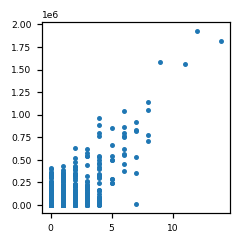

In [60]:
_, ax = plt.subplots(figsize=(2.2, 2.3))
ax.scatter(n_neighbors_cl0, sc.obs["raw_cb_freq"].values, s = 5)

In [43]:
n_neighbors_cl1 = neighbors_mtx.loc[cl1].sum(0)
scipy.stats.pearsonr(n_neighbors_cl1, sc.obs["raw_cb_freq"].values)

(0.3196773760570591, 3.0085570302660497e-72)

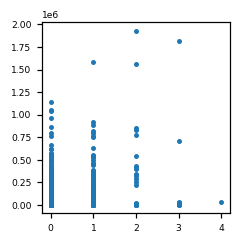

In [51]:
_, ax = plt.subplots(figsize=(2.2, 2.3))
ax.scatter(n_neighbors_cl1, sc.obs["raw_cb_freq"].values, s = 5)

In [44]:
n_neighbors_cl2 = neighbors_mtx.loc[cl2].sum(0)
scipy.stats.pearsonr(n_neighbors_cl2, sc.obs["raw_cb_freq"].values)

(0.46206480491256857, 1.4042044723523136e-158)

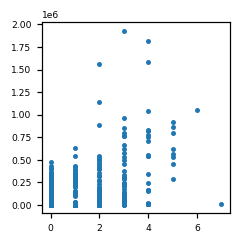

In [52]:
_, ax = plt.subplots(figsize=(2.2, 2.3))
ax.scatter(n_neighbors_cl2, sc.obs["raw_cb_freq"].values, s = 5)

In [183]:
n_neighbors = neighbors_mtx.sum(0)
stats.pearsonr(n_neighbors, sc.obs["raw_cb_freq"].values)

(0.5537147502747708, 1.1340289359108386e-240)

In [185]:
all_neighbors = []
all_reads = []

# _, ax = plt.subplots(figsize=(2.2, 2.3))

x = np.array(n_neighbors)
all_neighbors.append(x)
y = sc.obs["raw_cb_freq"].values
all_reads.append(y)
# ax.scatter(x, y, s = 5)

x = np.load("../ctrl/n_neighbors.npy")
all_neighbors.append(x)
y = np.load("../ctrl/raw_cb_freq.npy")
all_reads.append(y)
# ax.scatter(x, y, s = 5)

x = np.load("../er2/n_neighbors.npy")
all_neighbors.append(x)
y = np.load("../er2/raw_cb_freq.npy")
all_reads.append(y)
# ax.scatter(x, y, s = 5)

x = np.load("../nt/n_neighbors.npy")
all_neighbors.append(x)
y = np.load("../nt/raw_cb_freq.npy")
all_reads.append(y)
# ax.scatter(x, y, s = 5)


# plt.text(0.5,0.5, stats.pearsonr(np.concatenate(all_neighbors), np.concatenate(all_reads))[0])

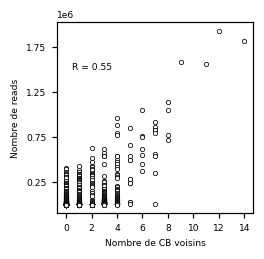

In [256]:
_, ax = plt.subplots(figsize=(2.3, 2.3))
                     
x = n_neighbors
y = sc.obs["raw_cb_freq"].values
ax.scatter(x, y, s = 8, color="w", edgecolor="black", linewidth=0.5)
plt.yticks(np.arange(0.25,2,0.5)*1e6)
plt.xticks(np.arange(0,15,2))
plt.xlabel("Nombre de CB voisins")
plt.ylabel("Nombre de reads")
plt.text(0.5,1.5*1e6, f"R = {round(stats.pearsonr(x,y)[0],2)}")
plt.savefig(f"./figs/{prefix}_corr-nn-lib.pdf")

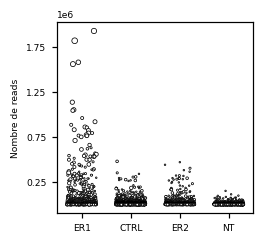

In [257]:
def jitter_dots(dots):
    offsets = dots.get_offsets()
    jittered_offsets = offsets
    # only jitter in the x-direction
    jittered_offsets[:, 0] += np.random.uniform(-0.3, 0.3, offsets.shape[0])
    dots.set_offsets(jittered_offsets)

_, ax = plt.subplots(figsize=(2.3, 2.3))
for i,(r,n) in enumerate(zip(all_reads, all_neighbors)) :
    dots = plt.scatter(np.full((len(r), 1), i), r, s = n, c = "white", edgecolor="black", linewidth=0.5)
    jitter_dots(dots)

plt.xlim(-0.5,3.5)
plt.ylabel("Nombre de reads")
plt.yticks(np.arange(0.25,2,0.5)*1e6);
plt.xticks(np.arange(0,4), ["ER1", "CTRL", "ER2", "NT"]);
plt.savefig(f"../figs/pyplot_lib-per-sample.pdf")

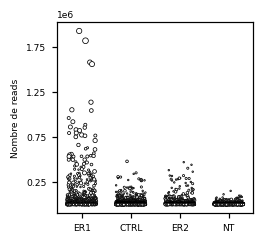

In [186]:
def jitter_dots(dots):
    offsets = dots.get_offsets()
    jittered_offsets = offsets
    # only jitter in the x-direction
    jittered_offsets[:, 0] += np.random.uniform(-0.3, 0.3, offsets.shape[0])
    dots.set_offsets(jittered_offsets)

_, ax = plt.subplots(figsize=(2.3, 2.3))
for i,(r,n) in enumerate(zip(all_reads, all_neighbors)) :
    dots = plt.scatter(np.full((len(r), 1), i), r, s = n, c = "white", edgecolor="black", linewidth=0.5)
    jitter_dots(dots)

plt.xlim(-0.5,3.5)
plt.ylabel("Nombre de reads")
plt.yticks(np.arange(0.25,2,0.5)*1e6);
plt.xticks(np.arange(0,4), ["ER1", "CTRL", "ER2", "NT"]);
plt.savefig(f"../figs/pyplot_lib-per-sample.pdf")

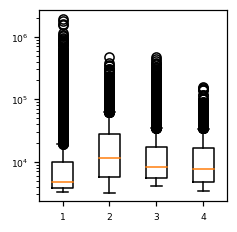

In [89]:
_, ax = plt.subplots(figsize=(2.2, 2.3))
ax.boxplot(all_reads);
plt.yscale('log')

In [471]:
hamming_neighbors_mtx = np.empty((len(barcodes), len(barcodes)))  
for i in range(len(hamming_neighbors_mtx)) :
    barcode1 = sc.obs["CB"].values[i]
    hamming_neighbors_mtx[i] = [(hammingDist(barcode1, barcode2) == 1) for barcode2 in barcodes]
hamming_neighbors_mtx = pd.DataFrame(hamming_neighbors_mtx, columns = barcodes, index = barcodes, dtype=int)

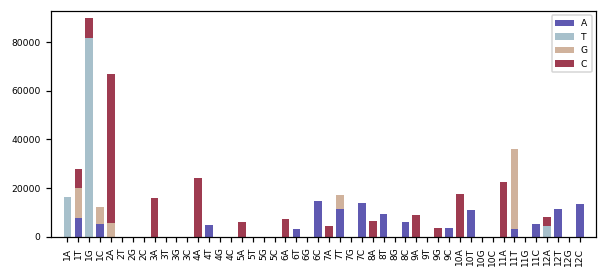

In [480]:
plot_errors(cl0, libs, hamming_neighbors_mtx)
plt.savefig(f"./figs/{prefix}_cl0_errors.pdf")

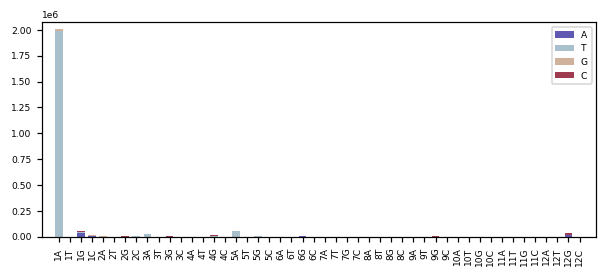

In [479]:
plot_errors(cl1, libs, hamming_neighbors_mtx)
plt.savefig(f"./figs/{prefix}_cl1_errors.pdf")

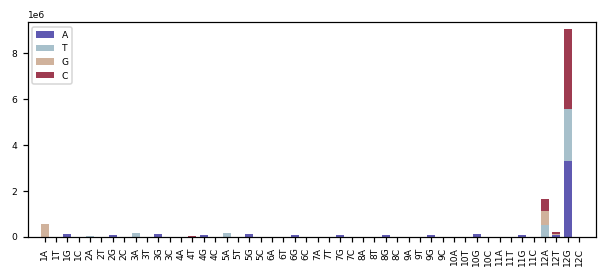

In [477]:
plot_errors(cl2, libs, hamming_neighbors_mtx)
plt.savefig(f"./figs/{prefix}_cl2_errors.pdf")

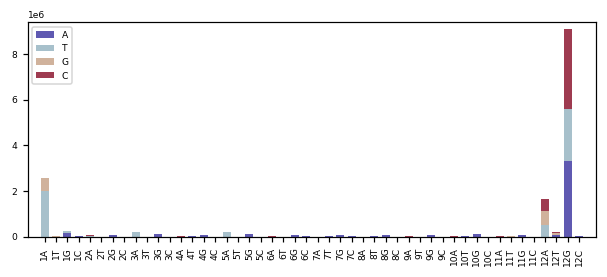

In [478]:
plot_errors(errors, libs, hamming_neighbors_mtx)
plt.savefig(f"./figs/{prefix}_all_errors.pdf")

In [1841]:
project_path = "/home/arion/davidm/Data/datasets/raw/private/RNA-seq/sc/dsp779"
x = pd.read_csv(f"{project_path}/raw-fastqs/{sample}/new_phreds.csv")

In [1842]:
total_scores = []

for barcode in sc.obs["CB"] :
#     phreds = np.concatenate([ast.literal_eval(chunk) for chunk in x[barcode].values])
    phreds = ast.literal_eval(x[barcode].values[0])[:10000]
    scores = []
    for phred in phreds :
        scores.append([ord(str(s))-33 for s in phred[:12]])
    total_scores.append(np.mean(scores, axis = 0))

total_scores = np.array(total_scores)

In [23]:
corrected_low_dedup_phreds = np.array(total_scores[[b in cl0 for b in sc.obs_names]])
corrected_mid_dedup_phreds = np.array(total_scores[[b in cl1 for b in sc.obs_names]])
corrected_normal_dedup_phreds = np.array(total_scores[[b in cl2 for b in sc.obs_names]])
random_phreds = np.array(total_scores[[b in whitelist for b in sc.obs_names]])

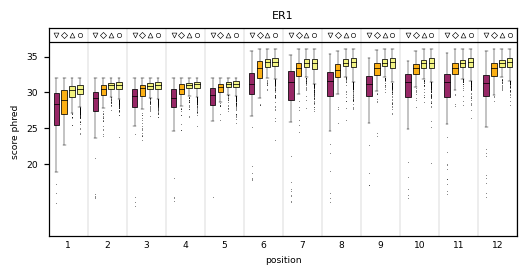

In [28]:
_, ax = plt.subplots(figsize=(5.5, 2.5))

flierprops = {'marker':'.', 'markersize':1, 'markeredgecolor':'none', 'markerfacecolor':'black'}
medianprops = {'color':'black', 'linewidth':0.5}
whiskerprops = {'linewidth': 0.3}
capprops = {'linewidth': 0.3}

cmap = cm.get_cmap('inferno')

rgba = cmap(sc.obs["DedupRate"].loc[cl0].mean())
bp = plt.boxplot(corrected_low_dedup_phreds, positions = np.arange(0,60,5), widths = 0.7, patch_artist = True,\
                 boxprops={'facecolor': rgba, 'linewidth': 0.5},\
                 flierprops=flierprops, medianprops=medianprops, whiskerprops=whiskerprops, capprops=capprops)
plt.scatter(np.arange(0,60,5),np.repeat(38,12), marker='v', s = 10, color='white', edgecolors='black', linewidths=0.4)


rgba = cmap(sc.obs["DedupRate"].loc[cl1].mean())
bp = plt.boxplot(corrected_mid_dedup_phreds, positions = np.arange(1,60,5), widths = 0.7, patch_artist = True,\
                 boxprops={'facecolor': rgba, 'linewidth': 0.5},\
                 flierprops=flierprops, medianprops=medianprops, whiskerprops=whiskerprops, capprops=capprops)
plt.scatter(np.arange(1,60,5),np.repeat(38,12), marker='D', s = 8, color='white', edgecolors='black', linewidths=0.4)


rgba = cmap(sc.obs["DedupRate"].loc[cl2].mean())
bp = plt.boxplot(corrected_normal_dedup_phreds, positions = np.arange(2,60,5), widths = 0.7, patch_artist = True,\
                 boxprops={'facecolor': rgba, 'linewidth': 0.5},\
                 flierprops=flierprops, medianprops=medianprops, whiskerprops=whiskerprops, capprops=capprops)
plt.scatter(np.arange(2,60,5),np.repeat(38,12), marker='^', s = 10, color='white', edgecolors='black', linewidths=0.4)


rgba = cmap(sc.obs["DedupRate"].loc[whitelist].mean())
bp = plt.boxplot(random_phreds, positions = np.arange(3,60,5), widths = 0.7, patch_artist = True,\
                 boxprops={'facecolor': rgba, 'linewidth': 0.5},\
                 flierprops=flierprops, medianprops=medianprops, whiskerprops=whiskerprops, capprops=capprops)
plt.scatter(np.arange(3,60,5),np.repeat(38,12), marker='o', s = 8, color='white', edgecolors='black', linewidths=0.4)


plt.xticks(np.arange(1.5,60,5), labels = np.arange(1,13))
ax.tick_params(axis='x', length = 0)

plt.axhline(y=37, linewidth = 0.8, color="black")
for x in np.arange(4,60,5) :
    plt.axvline(x=x, linewidth = 0.3, color="black", alpha = 0.3)

    
plt.yticks([20,25,30,35])
plt.xlim(-1, 59);
plt.ylim(10,39)
plt.xlabel("position")
plt.ylabel("score phred")
plt.title("ER1")
plt.savefig(f"./figs/{prefix}_phreds.pdf")

In [1065]:
project_path = "/home/arion/davidm/Data/datasets/raw/private/RNA-seq/sc/dsp779"
x = pd.read_csv(f"{project_path}/raw-fastqs/{sample}/new_umis.csv")
data = {}
for cb in x.columns :
    data[cb] = np.unique(np.concatenate([ast.literal_eval(x[cb].values[chunk]) for chunk in range(x.shape[0])]))

In [678]:
low_dedup_shared_umis_e = []
random_low_dedup_shared_umis_e = []


mid_dedup_shared_umis_e = []
random_mid_dedup_shared_umis_e = []


normal_dedup_shared_umis_e = []
random_normal_dedup_shared_umis_e = []


data = sc.obs["total_UMIs"].loc[np.setdiff1d(whitelist, correction_dict.keys())].to_dict()

for o,e in zip(get_intended_barcodes(correction_dict, cl0)[0], get_intended_barcodes(correction_dict, cl0)[1]) :
    
    cb1 = min(data.items(), key=lambda x: abs(sc.obs["total_UMIs"].loc[o] - x[1]))[0]
    cb2 = min(data.items(), key=lambda x: abs(sc.obs["total_UMIs"].loc[e] - x[1]))[0]
    data.pop(cb2, None)
    umis_cb1 = np.unique(np.concatenate([ast.literal_eval(x[cb1].values[chunk]) for chunk in range(x.shape[0])]))
    umis_cb2 = np.unique(np.concatenate([ast.literal_eval(x[cb2].values[chunk]) for chunk in range(x.shape[0])]))
    shared_umis = len(np.intersect1d(umis_cb1, umis_cb2))
    random_low_dedup_shared_umis_e.append(shared_umis/len(umis_cb2))
    
    umis_e = np.unique(np.concatenate([ast.literal_eval(x[e].values[chunk]) for chunk in range(x.shape[0])]))
    umis_o = np.unique(np.concatenate([ast.literal_eval(x[o].values[chunk]) for chunk in range(x.shape[0])]))
    shared_umis = len(np.intersect1d(umis_e, umis_o))
    low_dedup_shared_umis_e.append(shared_umis/len(umis_e))


    
data = sc.obs["total_UMIs"].loc[np.setdiff1d(whitelist, correction_dict.keys())].to_dict()

for o,e in zip(get_intended_barcodes(correction_dict, cl1)[0], get_intended_barcodes(correction_dict, cl1)[1]) :
    
    cb1 = min(data.items(), key=lambda x: abs(sc.obs["total_UMIs"].loc[o] - x[1]))[0]
    cb2 = min(data.items(), key=lambda x: abs(sc.obs["total_UMIs"].loc[e] - x[1]))[0]
    data.pop(cb2, None)
    umis_cb1 = np.unique(np.concatenate([ast.literal_eval(x[cb1].values[chunk]) for chunk in range(x.shape[0])]))
    umis_cb2 = np.unique(np.concatenate([ast.literal_eval(x[cb2].values[chunk]) for chunk in range(x.shape[0])]))
    shared_umis = len(np.intersect1d(umis_cb1, umis_cb2))
    random_mid_dedup_shared_umis_e.append(shared_umis/len(umis_cb2))
    
    umis_e = np.unique(np.concatenate([ast.literal_eval(x[e].values[chunk]) for chunk in range(x.shape[0])]))
    umis_o = np.unique(np.concatenate([ast.literal_eval(x[o].values[chunk]) for chunk in range(x.shape[0])]))
    shared_umis = len(np.intersect1d(umis_e, umis_o))
    mid_dedup_shared_umis_e.append(shared_umis/len(umis_e))
    



data = sc.obs["total_UMIs"].loc[np.setdiff1d(whitelist, correction_dict.keys())].to_dict()

for o,e in zip(get_intended_barcodes(correction_dict, cl2)[0], get_intended_barcodes(correction_dict, cl2)[1]) :
    
    cb1 = min(data.items(), key=lambda x: abs(sc.obs["total_UMIs"].loc[o] - x[1]))[0]
    cb2 = min(data.items(), key=lambda x: abs(sc.obs["total_UMIs"].loc[e] - x[1]))[0]
    data.pop(cb2, None)
    umis_cb1 = np.unique(np.concatenate([ast.literal_eval(x[cb1].values[chunk]) for chunk in range(x.shape[0])]))
    umis_cb2 = np.unique(np.concatenate([ast.literal_eval(x[cb2].values[chunk]) for chunk in range(x.shape[0])]))
    shared_umis = len(np.intersect1d(umis_cb1, umis_cb2))
    random_normal_dedup_shared_umis_e.append(shared_umis/len(umis_cb2))
    
    umis_e = np.unique(np.concatenate([ast.literal_eval(x[e].values[chunk]) for chunk in range(x.shape[0])]))
    umis_o = np.unique(np.concatenate([ast.literal_eval(x[o].values[chunk]) for chunk in range(x.shape[0])]))
    shared_umis = len(np.intersect1d(umis_e, umis_o))
    normal_dedup_shared_umis_e.append(shared_umis/len(umis_e))

    
    
    
# for i in range(len(cl1)):
#     cb1,cb2 = np.random.choice(whitelist, 2, replace = False)
#     umis_cb1 = np.unique(np.concatenate([ast.literal_eval(x[cb1].values[chunk]) for chunk in range(x.shape[0])]))
#     umis_cb2 = np.unique(np.concatenate([ast.literal_eval(x[cb2].values[chunk]) for chunk in range(x.shape[0])]))
#     n_umis = len(umis_cb2) #+ len(umis_cb2)
#     shared_umis = len(np.intersect1d(umis_cb1, umis_cb2))
#     random_shared_umis.append(shared_umis/n_umis)

In [284]:
# data = sc.obs["total_UMIs"].loc[np.setdiff1d(whitelist, correction_dict.keys())].to_dict()


In [297]:
o=list(correction_dict.keys())[0]
e=list(correction_dict.values())[0][0]

In [299]:
sc.obs["total_UMIs"].loc[o]

17295.0

In [295]:
sc.obs["total_UMIs"].loc[e]

13654.0

In [292]:
min(data.items(), key=lambda x: abs(sc.obs["total_UMIs"].loc[e] - x[1]))[1]

12991.0

In [461]:
nucleotides = ['A', 'T', 'G', 'C']

def generate_new_barcode(barcodes, length_barcode = 12, n_nucleotides = 4) :
    
    barcode = []
    for i in range(length_barcode) :
        barcode.append(np.random.choice(a = nucleotides[:n_nucleotides], p = [0.2,0.15,0.45,0.2]))
    barcode = ('').join(barcode)
    if barcode not in barcodes :
        barcodes.append(barcode)
    else:
        generate_new_barcode(barcodes, length_barcode, n_nucleotides)

In [1066]:
data = {}
for cb in x.columns :
    data[cb] = np.unique(np.concatenate([ast.literal_eval(x[cb].values[chunk]) for chunk in range(x.shape[0])]))

In [1067]:
del x

In [431]:
# data = {k: data[k] for k in sc.obs["CB"].values}

# u = {i for i in np.intersect1d(list(data.values())[0],list(data.values())[1])}
# for umis in list(data.values())[2:]:
#     for ui in np.intersect1d(umis,list(u)) :
#         u.add(ui)

In [411]:
# d_umi = {"A":0,"T":0,"G":0,"C":0, "N":0}
# for umi in np.unique(np.concatenate(list(data.values()))):
#     for nt in umi[1:] :
#         d_umi[nt] += 1
#     umi_prev = umi
#     i+=1

In [405]:
# d_cb = {"A":0,"T":0,"G":0,"C":0, "N":0}
# for cb in list(data.keys()):
#     for nt in cb :
#         d_cb[nt] += 1

In [463]:
random_normal_dedup_shared_umis_e = []
for o,e in zip(get_intended_barcodes(correction_dict, cl2)[0], get_intended_barcodes(correction_dict, cl2)[1]) :
    cbso = []
    cbse = []
    for _ in range(len(data[o])):
        generate_new_barcode(cbso, length_barcode = 8, n_nucleotides = 4)
    for _ in range(len(data[e])):
        generate_new_barcode(cbse, length_barcode = 8, n_nucleotides = 4)
    shared_umis = len(np.intersect1d(cbso, cbse))
    random_normal_dedup_shared_umis_e.append(shared_umis/len(data[e]))

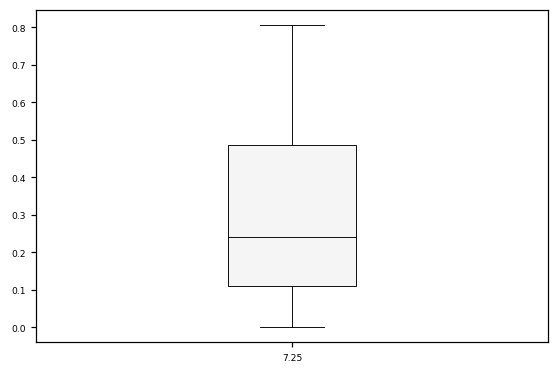

In [464]:
bp2 = plt.boxplot(random_normal_dedup_shared_umis_e, positions = [7.25], widths = 0.25, patch_artist = True,\
                 boxprops={'facecolor': 'whitesmoke', 'color' : 'black', 'linewidth': 0.6},\
                 whiskerprops = {'linewidth': 0.6, 'color':'black'},\
                 capprops = {'linewidth': 0.6, 'color':'black'},\
                 medianprops = {'color' : 'black', 'linewidth' : 0.6},\
                 flierprops = {'marker':'.', 'markersize':2,'markerfacecolor':'black', 'markeredgecolor':'black'})

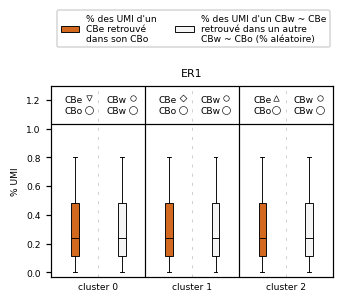

In [465]:
_, ax = plt.subplots(figsize=(3.3, 2.3))



bp = plt.boxplot(random_normal_dedup_shared_umis_e, positions = [-0.25], widths = 0.25, patch_artist = True,\
                 boxprops={'facecolor': 'chocolate', 'color' : 'black', 'linewidth': 0.6},\
                 whiskerprops = {'linewidth': 0.6, 'color':'black'},\
                 capprops = {'linewidth': 0.6, 'color':'black'},\
                 medianprops = {'color' : 'black', 'linewidth' : 0.6},\
                 flierprops = {'marker':'.', 'markersize':2,'markerfacecolor':'black', 'markeredgecolor':'black'})

bp = plt.boxplot(random_normal_dedup_shared_umis_e, positions = [1.25], widths = 0.25, patch_artist = True,\
                 boxprops={'facecolor': 'whitesmoke', 'color' : 'black', 'linewidth': 0.6},\
                 whiskerprops = {'linewidth': 0.6, 'color':'black'},\
                 capprops = {'linewidth': 0.6, 'color':'black'},\
                 medianprops = {'color' : 'black', 'linewidth' : 0.6},\
                 flierprops = {'marker':'.', 'markersize':2,'markerfacecolor':'black', 'markeredgecolor':'black'})



bp = plt.boxplot(random_normal_dedup_shared_umis_e, positions = [2.75], widths = 0.25, patch_artist = True,\
                 boxprops={'facecolor': 'chocolate', 'color' : 'black', 'linewidth': 0.6},\
                 whiskerprops = {'linewidth': 0.6, 'color':'black'},\
                 capprops = {'linewidth': 0.6, 'color':'black'},\
                 medianprops = {'color' : 'black', 'linewidth' : 0.6},\
                 flierprops = {'marker':'.', 'markersize':2,'markerfacecolor':'black', 'markeredgecolor':'black'})
bp = plt.boxplot(random_normal_dedup_shared_umis_e, positions = [4.25], widths = 0.25, patch_artist = True,\
                 boxprops={'facecolor': 'whitesmoke', 'color' : 'black', 'linewidth': 0.6},\
                 whiskerprops = {'linewidth': 0.6, 'color':'black'},\
                 capprops = {'linewidth': 0.6, 'color':'black'},\
                 medianprops = {'color' : 'black', 'linewidth' : 0.6},\
                 flierprops = {'marker':'.', 'markersize':2,'markerfacecolor':'black', 'markeredgecolor':'black'})



bp1 = plt.boxplot(random_normal_dedup_shared_umis_e, positions = [5.75], widths = 0.25, patch_artist = True,\
                 boxprops={'facecolor': 'chocolate', 'color' : 'black', 'linewidth': 0.6},\
                 whiskerprops = {'linewidth': 0.6, 'color':'black'},\
                 capprops = {'linewidth': 0.6, 'color':'black'},\
                 medianprops = {'color' : 'black', 'linewidth' : 0.6},\
                 flierprops = {'marker':'.', 'markersize':2,'markerfacecolor':'black', 'markeredgecolor':'black'})

bp2 = plt.boxplot(random_normal_dedup_shared_umis_e, positions = [7.25], widths = 0.25, patch_artist = True,\
                 boxprops={'facecolor': 'whitesmoke', 'color' : 'black', 'linewidth': 0.6},\
                 whiskerprops = {'linewidth': 0.6, 'color':'black'},\
                 capprops = {'linewidth': 0.6, 'color':'black'},\
                 medianprops = {'color' : 'black', 'linewidth' : 0.6},\
                 flierprops = {'marker':'.', 'markersize':2,'markerfacecolor':'black', 'markeredgecolor':'black'})


ax.legend([bp1["boxes"][0], bp2["boxes"][0]], ["% des UMI d'un\nCBe retrouvé\ndans son CBo", \
                    "% des UMI d'un CBw ~ CBe\nretrouvé dans un autre\nCBw ~ CBo (% aléatoire)"],loc=(0.02,1.2), ncol=2)



plt.axhline(y=1.03, linewidth = 0.8, color="black")
plt.axvline(x=0.5, linewidth = 0.4, color="black", ls=(0, (5, 10)), alpha = 0.3)
plt.axvline(x=2, linewidth = 0.8, color="black")
plt.axvline(x=3.5, linewidth = 0.4, color="black", ls=(0, (5, 10)), alpha = 0.3)
plt.axvline(x=5, linewidth = 0.8, color="black")
plt.axvline(x=6.5, linewidth = 0.4, color="black", ls=(0, (5, 10)), alpha = 0.3)



plt.scatter([1.6,4.6,7.6],np.repeat(1.213,3), marker='o', s = 13, color='white', edgecolors='black', linewidths=0.4)
plt.scatter([0.2,1.6,3.2,4.6,6.2,7.6],np.repeat(1.13,6), marker='o', s = 27, color='white', edgecolors='black', linewidths=0.4)
plt.scatter(0.2, 1.213, marker='v', s = 13, color='white', edgecolors='black', linewidths=0.4)
plt.scatter(3.2, 1.213, marker='D', s = 10, color='white', edgecolors='black', linewidths=0.4)
plt.scatter(6.2, 1.213, marker='^', s = 13, color='white', edgecolors='black', linewidths=0.4)


plt.text(-0.58, 1.185, "CBe")
plt.text(-0.58, 1.11, "CBo")
plt.text(x = 2.43, y = 1.185, s = "CBe")
plt.text(x = 2.43, y = 1.11, s = "CBo")
plt.text(x = 5.45, y = 1.185, s = "CBe")
plt.text(x = 5.45, y = 1.11, s = "CBo")

plt.text(0.76, 1.185, "CBw")
plt.text(0.76, 1.11, "CBw")
plt.text(3.76, 1.185, "CBw")
plt.text(3.76, 1.11, "CBw")
plt.text(6.76, 1.185, "CBw")
plt.text(6.76, 1.11, "CBw")


plt.xticks([0.5,3.5,6.5], labels=["cluster 0", "cluster 1", "cluster 2"])
ax.tick_params(axis='x', length = 0)

plt.xlim(-1,8)
plt.ylim(-0.03,1.3)

plt.ylabel("% UMI")
plt.title("ER1")

plt.savefig(f"./figs/{prefix}_shared_umis.pdf")

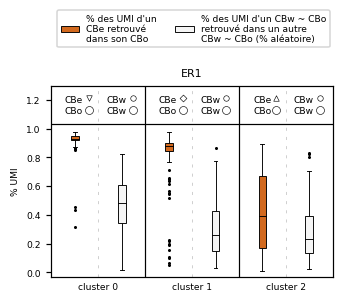

In [682]:
_, ax = plt.subplots(figsize=(3.3, 2.3))



bp = plt.boxplot(low_dedup_shared_umis_e, positions = [-0.25], widths = 0.25, patch_artist = True,\
                 boxprops={'facecolor': 'chocolate', 'color' : 'black', 'linewidth': 0.6},\
                 whiskerprops = {'linewidth': 0.6, 'color':'black'},\
                 capprops = {'linewidth': 0.6, 'color':'black'},\
                 medianprops = {'color' : 'black', 'linewidth' : 0.6},\
                 flierprops = {'marker':'.', 'markersize':2,'markerfacecolor':'black', 'markeredgecolor':'black'})

bp = plt.boxplot(random_low_dedup_shared_umis_e, positions = [1.25], widths = 0.25, patch_artist = True,\
                 boxprops={'facecolor': 'whitesmoke', 'color' : 'black', 'linewidth': 0.6},\
                 whiskerprops = {'linewidth': 0.6, 'color':'black'},\
                 capprops = {'linewidth': 0.6, 'color':'black'},\
                 medianprops = {'color' : 'black', 'linewidth' : 0.6},\
                 flierprops = {'marker':'.', 'markersize':2,'markerfacecolor':'black', 'markeredgecolor':'black'})



bp = plt.boxplot(mid_dedup_shared_umis_e, positions = [2.75], widths = 0.25, patch_artist = True,\
                 boxprops={'facecolor': 'chocolate', 'color' : 'black', 'linewidth': 0.6},\
                 whiskerprops = {'linewidth': 0.6, 'color':'black'},\
                 capprops = {'linewidth': 0.6, 'color':'black'},\
                 medianprops = {'color' : 'black', 'linewidth' : 0.6},\
                 flierprops = {'marker':'.', 'markersize':2,'markerfacecolor':'black', 'markeredgecolor':'black'})
bp = plt.boxplot(random_mid_dedup_shared_umis_e, positions = [4.25], widths = 0.25, patch_artist = True,\
                 boxprops={'facecolor': 'whitesmoke', 'color' : 'black', 'linewidth': 0.6},\
                 whiskerprops = {'linewidth': 0.6, 'color':'black'},\
                 capprops = {'linewidth': 0.6, 'color':'black'},\
                 medianprops = {'color' : 'black', 'linewidth' : 0.6},\
                 flierprops = {'marker':'.', 'markersize':2,'markerfacecolor':'black', 'markeredgecolor':'black'})



bp1 = plt.boxplot(normal_dedup_shared_umis_e, positions = [5.75], widths = 0.25, patch_artist = True,\
                 boxprops={'facecolor': 'chocolate', 'color' : 'black', 'linewidth': 0.6},\
                 whiskerprops = {'linewidth': 0.6, 'color':'black'},\
                 capprops = {'linewidth': 0.6, 'color':'black'},\
                 medianprops = {'color' : 'black', 'linewidth' : 0.6},\
                 flierprops = {'marker':'.', 'markersize':2,'markerfacecolor':'black', 'markeredgecolor':'black'})

bp2 = plt.boxplot(random_shared_umis, positions = [7.25], widths = 0.25, patch_artist = True,\
                 boxprops={'facecolor': 'whitesmoke', 'color' : 'black', 'linewidth': 0.6},\
                 whiskerprops = {'linewidth': 0.6, 'color':'black'},\
                 capprops = {'linewidth': 0.6, 'color':'black'},\
                 medianprops = {'color' : 'black', 'linewidth' : 0.6},\
                 flierprops = {'marker':'.', 'markersize':2,'markerfacecolor':'black', 'markeredgecolor':'black'})


ax.legend([bp1["boxes"][0], bp2["boxes"][0]], ["% des UMI d'un\nCBe retrouvé\ndans son CBo", \
                    "% des UMI d'un CBw ~ CBe\nretrouvé dans un autre\nCBw ~ CBo (% aléatoire)"],loc=(0.02,1.2), ncol=2)



plt.axhline(y=1.03, linewidth = 0.8, color="black")
plt.axvline(x=0.5, linewidth = 0.4, color="black", ls=(0, (5, 10)), alpha = 0.3)
plt.axvline(x=2, linewidth = 0.8, color="black")
plt.axvline(x=3.5, linewidth = 0.4, color="black", ls=(0, (5, 10)), alpha = 0.3)
plt.axvline(x=5, linewidth = 0.8, color="black")
plt.axvline(x=6.5, linewidth = 0.4, color="black", ls=(0, (5, 10)), alpha = 0.3)



plt.scatter([1.6,4.6,7.6],np.repeat(1.213,3), marker='o', s = 13, color='white', edgecolors='black', linewidths=0.4)
plt.scatter([0.2,1.6,3.2,4.6,6.2,7.6],np.repeat(1.13,6), marker='o', s = 27, color='white', edgecolors='black', linewidths=0.4)
plt.scatter(0.2, 1.213, marker='v', s = 13, color='white', edgecolors='black', linewidths=0.4)
plt.scatter(3.2, 1.213, marker='D', s = 10, color='white', edgecolors='black', linewidths=0.4)
plt.scatter(6.2, 1.213, marker='^', s = 13, color='white', edgecolors='black', linewidths=0.4)


plt.text(-0.58, 1.185, "CBe")
plt.text(-0.58, 1.11, "CBo")
plt.text(x = 2.43, y = 1.185, s = "CBe")
plt.text(x = 2.43, y = 1.11, s = "CBo")
plt.text(x = 5.45, y = 1.185, s = "CBe")
plt.text(x = 5.45, y = 1.11, s = "CBo")

plt.text(0.76, 1.185, "CBw")
plt.text(0.76, 1.11, "CBw")
plt.text(3.76, 1.185, "CBw")
plt.text(3.76, 1.11, "CBw")
plt.text(6.76, 1.185, "CBw")
plt.text(6.76, 1.11, "CBw")


plt.xticks([0.5,3.5,6.5], labels=["cluster 0", "cluster 1", "cluster 2"])
ax.tick_params(axis='x', length = 0)

plt.xlim(-1,8)
plt.ylim(-0.03,1.3)

plt.ylabel("% UMI")
plt.title("ER1")

plt.savefig(f"./figs/{prefix}_shared_umis.pdf")

In [470]:
tumis_cl1 = 0
numis_cl1 = 0

for cb in cl0 :
    umis = data[cb]
    numis_cl1 += len(umis)
    for u in umis :
        if u[-1] == 'T':
            tumis_cl1 += 1

In [471]:
tumis_cl1/numis_cl1

0.15175856556220807

In [622]:
random_shared_umis = []
whitelist_high = np.array(whitelist)[sc.obs["total_UMIs"].loc[whitelist].values > sc.obs["total_UMIs"].loc[whitelist].mean()]
whitelist_low = np.array(whitelist)[sc.obs["total_UMIs"].loc[whitelist].values < sc.obs["total_UMIs"].loc[whitelist].mean()]

for i in range(len(cl2)):
    
    cb1 = np.random.choice(whitelist_high, 1, replace = False)[0]
    cb2 = np.random.choice(whitelist_low, 1, replace = False)[0]

    umis_cb1 = np.unique(np.concatenate([ast.literal_eval(x[cb1].values[chunk]) for chunk in range(x.shape[0])]))
    umis_cb2 = np.unique(np.concatenate([ast.literal_eval(x[cb2].values[chunk]) for chunk in range(x.shape[0])]))
    n_umis = len(umis_cb2)
    shared_umis = len(np.intersect1d(umis_cb1, umis_cb2))
    random_shared_umis.append(shared_umis/n_umis)

In [615]:
sc.obs["total_UMIs"].loc[whitelist].values > sc.obs["total_UMIs"].loc[whitelist].values.mean()

array([ True,  True,  True, ..., False, False, False])

In [104]:
random_shared_umis2 = []

for o,e in zip(get_intended_barcodes(errors_dict, cl2)[0], get_intended_barcodes(errors_dict, cl2)[1]) :
    cb1 = min(data.items(), key=lambda x: abs(sc.obs["total_UMIs"].loc[o] - x[1]))[0]
    cb2 = min(data.items(), key=lambda x: abs(sc.obs["total_UMIs"].loc[e] - x[1]))[0]
    if cb1 == cb2 :
        continue
    data.pop(cb2, None)
    umis_cb1 = np.unique(np.concatenate([ast.literal_eval(x[cb1].values[chunk]) for chunk in range(x.shape[0])]))
    umis_cb2 = np.unique(np.concatenate([ast.literal_eval(x[cb2].values[chunk]) for chunk in range(x.shape[0])]))
    n_umis = len(umis_cb2) #+ len(umis_cb2)
    shared_umis = len(np.intersect1d(umis_cb1, umis_cb2))
    random_shared_umis2.append(shared_umis/n_umis)

In [581]:
random_shared_umis2 = []
nucleotides = ['A', 'T', 'G', 'C']
all_umis = [('').join(x) for x in itertools.product(nucleotides, repeat=8)]

for o,e in zip(get_intended_barcodes(errors_dict, cl2)[0], get_intended_barcodes(errors_dict, cl2)[1]) :
    
#     umis_e = np.unique(np.concatenate([ast.literal_eval(x[e].values[chunk]) for chunk in range(x.shape[0])]))
#     umis_o = np.unique(np.concatenate([ast.literal_eval(x[o].values[chunk]) for chunk in range(x.shape[0])]))
#     shared_umis = len(np.intersect1d(umis_e, umis_o))
#     normal_dedup_shared_umis_o.append(shared_umis/len(umis_o))
#     normal_dedup_shared_umis_e.append(shared_umis/len(umis_e))
    
    umis = np.random.choice(all_umis, sc.obs["total_UMIs"].loc[o].astype(int)+sc.obs["total_UMIs"].loc[e].astype(int), replace = True)
#     umis_cb1 = np.random.choice(umis, sc.obs["total_UMIs"].loc[o].astype(int), replace = True)
#     umis_cb2 = np.random.choice(all_umis, sc.obs["total_UMIs"].loc[e].astype(int), replace = True)
    umis_cb1 = umis[:sc.obs["total_UMIs"].loc[o].astype(int)]
    umis_cb2 = umis[sc.obs["total_UMIs"].loc[o].astype(int):]

    n_umis = len(umis_cb2) #+ len(umis_cb2)
    shared_umis = len(np.intersect1d(umis_cb1, umis_cb2))
    random_shared_umis2.append(shared_umis/n_umis)

In [574]:
random_shared_umis1 = []
nucleotides = ['A', 'T', 'G', 'C']
all_umis = [('').join(x) for x in itertools.product(nucleotides, repeat=8)]

for o,e in zip(get_intended_barcodes(errors_dict, cl1)[0], get_intended_barcodes(errors_dict, cl1)[1]) :
    
    umis_e = np.unique(np.concatenate([ast.literal_eval(x[e].values[chunk]) for chunk in range(x.shape[0])]))
    umis_o = np.unique(np.concatenate([ast.literal_eval(x[o].values[chunk]) for chunk in range(x.shape[0])]))
#     shared_umis = len(np.intersect1d(umis_e, umis_o))
#     normal_dedup_shared_umis_o.append(shared_umis/len(umis_o))
#     normal_dedup_shared_umis_e.append(shared_umis/len(umis_e))
    
    umis_cb1 = np.random.choice(all_umis, len(umis_o), replace = False)
    umis_cb2 = np.random.choice(all_umis, len(umis_e), replace = False)

    n_umis = len(umis_cb2) #+ len(umis_cb2)
    shared_umis = len(np.intersect1d(umis_cb1, umis_cb2))
    random_shared_umis1.append(shared_umis/n_umis)

In [571]:
len(cl1)

130

In [32]:
shared_umis = pd.DataFrame(normal_dedup_shared_umis_e, index = get_intended_barcodes(errors_dict, cl2)[1])

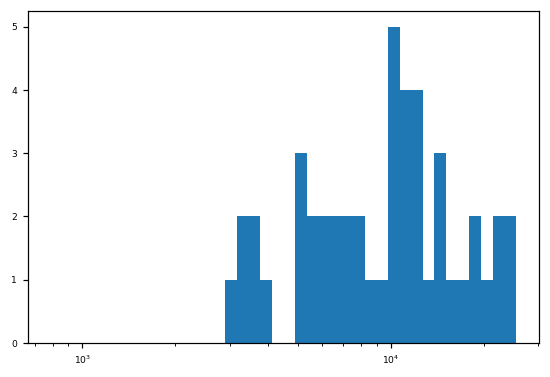

In [64]:
tot = sc.obs["total_UMIs"].loc[np.unique(get_intended_barcodes(errors_dict,shared_umis.index.values[(shared_umis.values > 0.7).ravel()])[0])]
rnaseq.plotting.loghist(tot, bins=40);

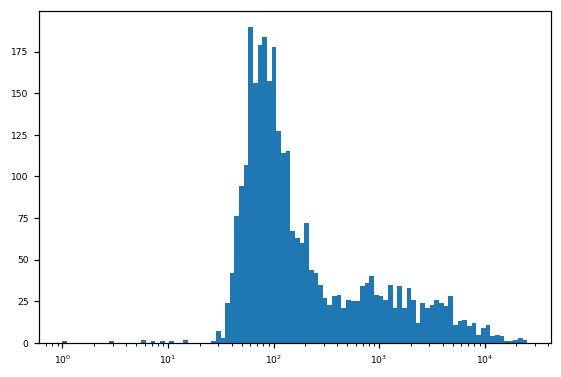

In [60]:
tot = sc.obs["total_UMIs"]
rnaseq.plotting.loghist(tot, bins=100);

('AGTCGTGAGGTA', 14497.0)

In [ ]:
shared_umis = pd.DataFrame(normal_dedup_shared_umis_e, index = get_intended_barcodes(errors_dict, cl2)[1])
# shared_umis = pd.DataFrame(mid_dedup_shared_umis_e, index = get_intended_barcodes(errors_dict, cl1)[1])
# shared_umis = pd.DataFrame(low_dedup_shared_umis_e, index = get_intended_barcodes(errors_dict, cl0)[1])


tot = sc.obs["total_UMIs"].loc[get_intended_barcodes(errors_dict,shared_umis.index.values)[0]]

color = sc.obs["total_UMIs"].loc[shared_umis.index].values

plt.scatter(shared_umis.values, tot, \
            c=sc.obs["DedupRate"].loc[shared_umis.index].values, norm=LogNorm())
plt.colorbar()

### Results new whitelist

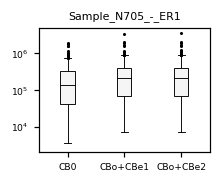

In [273]:
a = np.array(sc.obs.loc[list(correction_dict.keys())]["raw_cb_freq"])
b = np.array([sc.obs.loc[list(correction_dict.keys())[i]]["raw_cb_freq"] + sc.obs.loc[list(correction_dict.values())[i]]["raw_cb_freq"].sum() for i in range(len(correction_dict))])
c = np.array([sc.obs.loc[connected_components[i]]["raw_cb_freq"].sum() for i in range(len(connected_components)) if connected_components[i][0] in correction_dict.keys()])

plt.subplots(figsize = (2,1.5))
plt.boxplot([a,b,c], labels=["CB0", "CBo+CBe1", "CBo+CBe2"], widths = 0.25, patch_artist = True,\
                 boxprops={'facecolor': 'whitesmoke', 'color' : 'black', 'linewidth': 0.6},\
                 whiskerprops = {'linewidth': 0.6, 'color':'black'},\
                 capprops = {'linewidth': 0.6, 'color':'black'},\
                 medianprops = {'color' : 'black', 'linewidth' : 0.6},\
                 flierprops = {'marker':'.', 'markersize':2,'markerfacecolor':'black', 'markeredgecolor':'black'})

plt.title(sample)
plt.yscale('log')
plt.ylim(2000,5e6)
plt.minorticks_off()
plt.savefig(f"./figs/percent_increase_lib_corr_{sample}.pdf")

In [280]:
np.mean((b-a)/a)

0.6795880482075384

In [281]:
np.mean((c-b)/b)

0.00852680360107105

In [277]:
len(list(correction_dict.keys()))

234

In [278]:
len(np.concatenate(list(correction_dict.values())))

681

In [282]:
len(errors)

733

In [279]:
len(np.setdiff1d(errors, np.concatenate(list(correction_dict.values()))))

52

In [438]:
f = pd.read_csv(f"/home/arion/davidm/Data/datasets/raw/private/RNA-seq/sc/dsp779/quant/alevin/human/assembly__GRCh38-hg38/annotation__gencode/gencode_34/trimmed-reads-cutadapt/pc-decoys-k31-1.4.0/default/{sample}/alevin/raw_cb_frequency.txt", delimiter='\t', header = None)

In [452]:
k = pd.read_csv(f"/home/arion/davidm/Data/datasets/raw/private/RNA-seq/sc/dsp779/quant/alevin/human/assembly__GRCh38-hg38/annotation__gencode/gencode_34/trimmed-reads-cutadapt/pc-decoys-k31-1.4.0/default/{sample}/alevin/quants_mat_rows.txt", header=None)
w = pd.read_csv(f"/home/arion/davidm/Data/datasets/raw/private/RNA-seq/sc/dsp779/quant/alevin/human/assembly__GRCh38-hg38/annotation__gencode/gencode_34/trimmed-reads-cutadapt/pc-decoys-k31-1.4.0/default/{sample}/alevin/whitelist.txt", header=None)

In [456]:
len(k)

293

In [457]:
len(w)

66

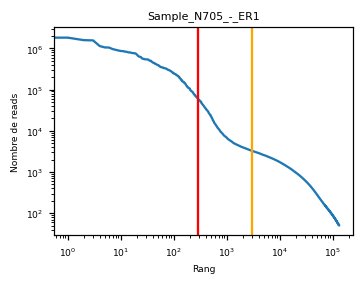

In [439]:
plt.subplots(figsize=(3.5,2.5))
plt.plot(f[1].values[f[1].values>50])
plt.yscale("log");
plt.xscale("log");
plt.axvline(3000, color="orange")
plt.axvline(len(k), color='red')
plt.title(sample)
plt.xlabel("Rang")
plt.ylabel("Nombre de reads")
plt.savefig(f"./figs/{prefix}_knee1.pdf")

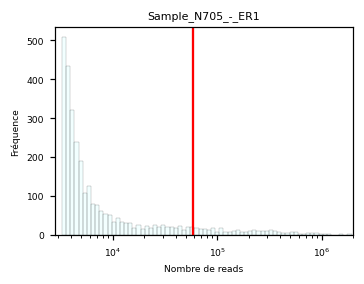

In [448]:
_,ax = plt.subplots(figsize=(3.5,2.5))
plt.axvline(f[1][len(k)], color='red')
rnaseq.plotting.loghist(f[1].values[:3000], bins=70, ax=ax, linewidth=0.1, edgecolor='black', fc = (0.5,1,1,0.1));
plt.title(sample)
plt.xlim(2800,2e6)
plt.ylabel("Fréquence")
plt.xlabel("Nombre de reads")
plt.savefig(f"./figs/{prefix}_knee3.pdf");

In [283]:
quant_params_new = "trimmed-reads-cutadapt-all/decoys-k19-1.4.0/customWh-top-3000"
sc_new = rnaseq.readwrite.read_raw(project_id  = project, quant_tool = "alevin", samples = sample, genes_id = "ensembl_gene_id", quant_params = quant_params_new, genref = genref, cdna = "3' tag", exp = "sc")
rnaseq.setup.annotate_samples(sc_new, samples_annot_name = "total_UMIs", samples_annot = sc_new.X.toarray().sum(1).ravel())
rnaseq.setup.annotate_samples(sc_new, samples_annot_name = "max_corr", ow=True)

/home/arion/davidm/Data/datasets/raw/private/RNA-seq/sc/dsp779/quant/alevin/human/assembly__GRCh38-hg38/annotation__gencode/gencode_34/trimmed-reads-cutadapt-all/decoys-k19-1.4.0/customWh-top-3000
Using BioMart Ensembl Genes 100 hsapiens_gene_ensembl for gene annotations.
Annotating total_UMIs...
Annotating max_corr...
Normalization by total UMIs...
Log2 + 1 tranformation...


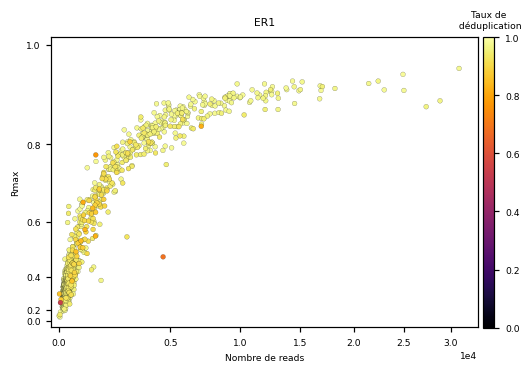

In [354]:
fig, ax = plt.subplots(figsize=(5,3.5))

color = "DedupRate"
lib_type = "total_UMIs"
# lib_type = "total_UMIs"

# cmap = "cividis"
cmap = "inferno"
norm = colors.TwoSlopeNorm(vmin=0., vcenter=.5, vmax=1)
s = 27

ax.set_yscale("square")
ax.set_xscale("squareroot")
ax.set_xlim(xmin =-100, xmax=33000)
ax.set_ylim(ymin=-0.15, ymax=1.015)
plt.ticklabel_format(axis="x", style="sci", scilimits=(0,0))



rnaseq.plotting.scatter(sc_new.obs[lib_type].values, sc_new.obs["max_corr"].values, sc_new.obs[color].values, \
            linewidth = 0.1, edgecolor = 'black', norm = norm, fig=fig, s = 10, \
            cmap = cmap, order_color = "descending", \
            color_title = "Taux de\n déduplication", xlabel = "Nombre de reads", ylabel = "Rmax", title = "ER1")    



plt.savefig(f"./figs/{prefix}_{lib_type}-max-corr_after-correction.pdf")

In [328]:
import json
quant_params = "trimmed-reads-cutadapt-all/decoys-k19-1.4.0/default"

with open(f"/home/arion/davidm/Data/datasets/raw/private/RNA-seq/sc/{project}/quant/alevin/{genref}/{quant_params}/{sample}/aux_info/alevin_meta_info.json") as f:
    alevin_meta_info = json.load(f)

knee = alevin_meta_info["initial_whitelist"]

In [331]:
np.sort(sc.obs["raw_cb_freq"])[::-1][knee]

267880

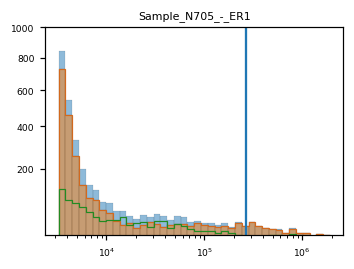

In [330]:
_,ax = plt.subplots(figsize=(3.5,2.5))
ax.set_title(sample)

plt.ylim(1,1000)
plt.yscale("squareroot")

plt.axvline(np.sort(sc.obs["raw_cb_freq"])[::-1][knee])

tot = sc.obs["raw_cb_freq"]
logbins = rnaseq.plotting.loghist(tot, ax=ax, bins=40, lw = 0.1, edgecolor = "black", color = 'tab:blue', alpha = 0.5);

tot = sc_new.obs["raw_cb_freq"]
logbins = rnaseq.plotting.loghist(tot, ax=ax, logbins=logbins, lw = 0.1, edgecolor = "black", color = 'tab:orange', alpha = 0.5);

tot = sc.obs["raw_cb_freq"].loc[whitelist]
rnaseq.plotting.loghist(tot, ax=ax, logbins=logbins, lw=0.8, edgecolor = "chocolate",  histtype = "step");

tot = sc.obs["raw_cb_freq"].loc[errors]
rnaseq.plotting.loghist(tot, ax=ax, logbins=logbins, lw=0.8, edgecolor = "forestgreen",  histtype = "step",save_path = f"./figs/whitelist_res_hist_0_{sample}.pdf");

plt.yscale("squareroot")


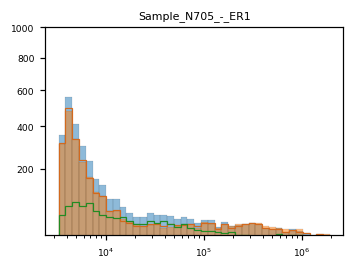

In [319]:
_,ax = plt.subplots(figsize=(3.5,2.5))
ax.set_title(sample)

# plt.xlim(3000,600000)
plt.ylim(1,1000)
plt.yscale("squareroot")

tot = sc.obs["CorrectedReads"]
logbins = rnaseq.plotting.loghist(tot, ax=ax, bins=40, lw = 0.1, edgecolor = "black", color = 'tab:blue', alpha = 0.5);

tot = sc_new.obs["CorrectedReads"]
logbins = rnaseq.plotting.loghist(tot, ax=ax, logbins=logbins, lw = 0.1, edgecolor = "black", color = 'tab:orange', alpha = 0.5);

tot = sc.obs["CorrectedReads"].loc[whitelist]
rnaseq.plotting.loghist(tot, ax=ax, logbins=logbins, lw=0.8, edgecolor = "chocolate",  histtype = "step");

tot = sc.obs["CorrectedReads"].loc[errors]
rnaseq.plotting.loghist(tot, ax=ax, logbins=logbins, lw=0.8, edgecolor = "forestgreen",  histtype = "step",save_path = f"./figs/whitelist_res_hist_1_{sample}.pdf");

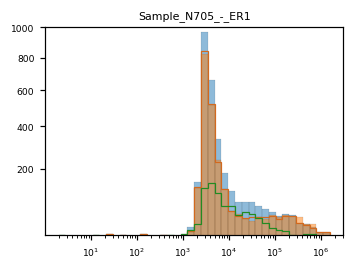

In [316]:
_,ax = plt.subplots(figsize=(3.5,2.5))
ax.set_title(sample)

# plt.xlim(10,600000)
plt.ylim(1,1000)
plt.yscale("squareroot")

tot = sc.obs["MappedReads"]
logbins = rnaseq.plotting.loghist(tot, ax=ax, bins=40, lw = 0.1, edgecolor = "black", color = 'tab:blue', alpha = 0.5);

tot = sc_new.obs["MappedReads"]
logbins = rnaseq.plotting.loghist(tot, ax=ax, logbins=logbins, lw = 0.1, edgecolor = "black", color = 'tab:orange', alpha = 0.5);

tot = sc.obs["MappedReads"].loc[whitelist]
rnaseq.plotting.loghist(tot, ax=ax, logbins=logbins, lw=0.8, edgecolor = "chocolate",  histtype = "step");

tot = sc.obs["MappedReads"].loc[errors]
rnaseq.plotting.loghist(tot, ax=ax, logbins=logbins, lw=0.8, edgecolor = "forestgreen",  histtype = "step",save_path = f"./figs/whitelist_res_hist_2_{sample}.pdf");

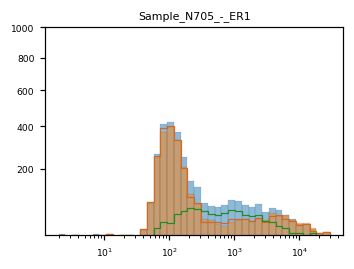

In [318]:
_,ax = plt.subplots(figsize=(3.5,2.5))
ax.set_title(sample)

plt.ylim(1,1000)
plt.yscale("squareroot")

tot = sc.obs["DeduplicatedReads"]
logbins = rnaseq.plotting.loghist(tot, ax=ax, bins=40, lw = 0.1, edgecolor = "black", color = 'tab:blue', alpha = 0.5);

tot = sc_new.obs["DeduplicatedReads"]
logbins = rnaseq.plotting.loghist(tot, ax=ax, logbins=logbins, lw = 0.1, edgecolor = "black", color = 'tab:orange', alpha = 0.5);

tot = sc.obs["DeduplicatedReads"].loc[whitelist]
rnaseq.plotting.loghist(tot, ax=ax, logbins=logbins, lw=0.8, edgecolor = "chocolate",  histtype = "step");

tot = sc.obs["DeduplicatedReads"].loc[errors]
rnaseq.plotting.loghist(tot, ax=ax, logbins=logbins, lw=0.8, edgecolor = "forestgreen",  histtype = "step",save_path = f"./figs/whitelist_res_hist_3_{sample}.pdf");

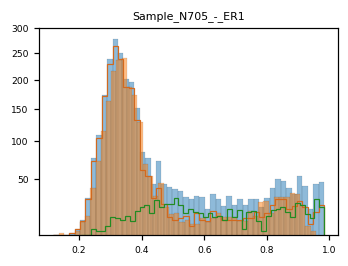

In [298]:
_,ax = plt.subplots(figsize=(3.5,2.5))
ax.set_title(sample)
plt.yscale("squareroot")
# plt.xlim(10,50000)
plt.ylim(1,300)

tot = sc.obs["max_corr"]
plt.hist(tot, bins=50, linewidth = 0.1, edgecolor = "black", color = 'tab:blue', alpha = 0.5);

tot = sc_new.obs["max_corr"]
plt.hist(tot, bins=50, linewidth = 0.1, edgecolor = "black", color = 'tab:orange', alpha = 0.5);

tot = sc.obs["max_corr"].loc[whitelist]
plt.hist(tot, bins=50, linewidth = 0.8, edgecolor = "chocolate",  histtype = "step");

tot = sc.obs["max_corr"].loc[errors]
plt.hist(tot, bins=50, linewidth = 0.8, edgecolor = "forestgreen",  histtype = "step");

In [628]:
sc_new.obs.loc[sc_new.obs["max_corr"]>0.94]

,CB,CorrectedReads,MappedReads,DeduplicatedReads,MappingRate,DedupRate,MeanByMax,NumGenesExpressed,NumGenesOverMean,raw_cb_freq,samples,project_id,total_UMIs,max_corr
CB,,,,,,,,,,,,,,
GACGCCAAGAAA,GACGCCAAGAAA,2096106,1430795,22093,0.682597,0.984559,0.020232,4152,747,1927476,Sample_N705_-_ER1,dsp779,22093.000000,0.945051
CCGCGCTTGAGC,CCGCGCTTGAGC,1969811,1256412,26576,0.637834,0.978848,0.015802,4889,797,1819151,Sample_N705_-_ER1,dsp779,26576.000000,0.954939
ACGGCGGAACAG,ACGGCGGAACAG,553247,371433,8717,0.671369,0.976531,0.020683,2867,463,246392,Sample_N705_-_ER1,dsp779,8717.000000,0.941437
CCTTGTCGCGTG,CCTTGTCGCGTG,3388491,2363529,51091,0.697517,0.978384,0.010672,6122,970,1054039,Sample_N705_-_ER1,dsp779,51091.000000,0.954939
ATGTGTTCTCAA,ATGTGTTCTCAA,311981,212037,5407,0.679647,0.974500,0.028546,2015,447,88561,Sample_N705_-_ER1,dsp779,5407.000000,0.946927
TACGGCGGAACA,TACGGCGGAACA,42704,28208,3331,0.660547,0.881913,0.031201,1570,256,10086,Sample_N705_-_ER1,dsp779,3331.000000,0.941437
TATGTGTTCTCA,TATGTGTTCTCA,30980,19710,2876,0.636217,0.854084,0.042657,1322,266,7147,Sample_N705_-_ER1,dsp779,2875.999756,0.946927


In [629]:
levenshtein_distance("ATGTGTTCTCAA","TATGTGTTCTCA")

2

In [649]:
levenshtein_distance("ATGTGTTCTCAA","CAGTGTTCTCAA")

2

max_corr already annotated. Set ow = True if you want to overwrite.


4

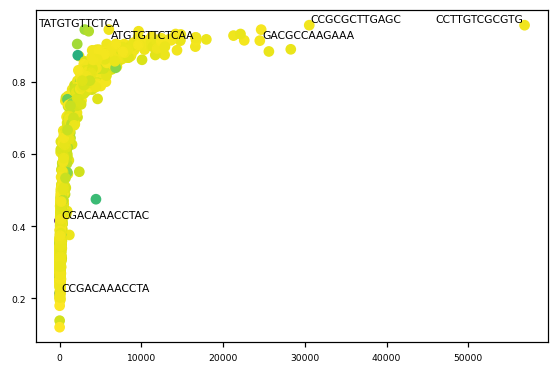

In [105]:
sc_new.obs_names = sc_new.obs["CB"]

texts = []
rnaseq.setup.annotate_samples(sc_new, "max_corr")
plt.scatter(sc_new.obs["total_UMIs"], sc_new.obs["max_corr"], c=sc_new.obs["DedupRate"]);
for cb in sc_new.obs["CB"].loc[(sc_new.obs["DedupRate"]<0.5) | (sc_new.obs["max_corr"]>0.94)]:
    texts.append(plt.text(sc_new[cb].obs["total_UMIs"].values, sc_new[cb].obs["max_corr"].values, cb, fontsize = 7))

adjust_text(texts)

In [129]:
sc.obs_names[(sc.obs["DedupRate"]<0.7) & (sc.obs["max_corr"]>0.8) & (sc.obs["raw_cb_freq"]<0.05*1e6)]

Index(['GCCGAGCTTCGG'], dtype='object')

In [132]:
barcodes_corr_max.loc["GCCGAGCTTCGG"]

0    AGACGAGCTTCG
Name: GCCGAGCTTCGG, dtype: object

In [138]:
b1 = "AGACGAGCTTCG"
b2 = "GCCGAGCTTCGG"
levenshtein_distance(b1[1:],b2)

2

In [135]:
s = "AGACGAGCTTCG"
s[1:]

'GACGAGCTTCG'

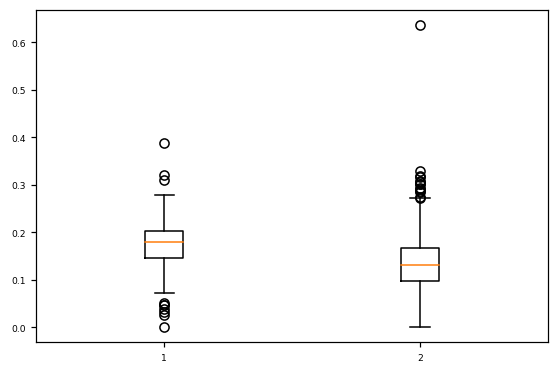

In [795]:
plt.boxplot([sc.obs["rp_frac"].loc[correction_dict.keys()], sc.obs["rp_frac"].loc[np.setdiff1d(whitelist, list(correction_dict.keys()))]]);

(30, 40000)

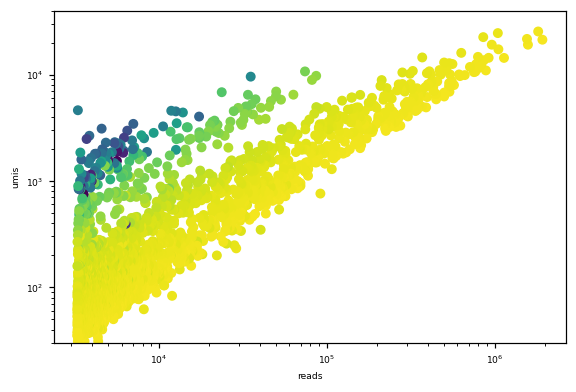

In [187]:
plt.scatter(sc.obs["raw_cb_freq"], sc.obs["total_UMIs"], s = 30, c = sc.obs["DedupRate"])
plt.xscale('log')
plt.yscale('log')
plt.xlabel("reads")
plt.ylabel("umis")
plt.ylim(30,40000)

(30, 40000)

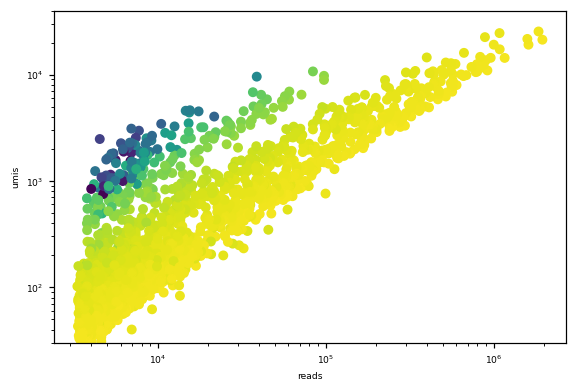

In [188]:
plt.scatter(sc.obs["CorrectedReads"], sc.obs["total_UMIs"], s = 30, c = sc.obs["DedupRate"])
plt.xscale('log')
plt.yscale('log')
plt.xlabel("reads")
plt.ylabel("umis")
plt.ylim(30,40000)

(30, 40000)

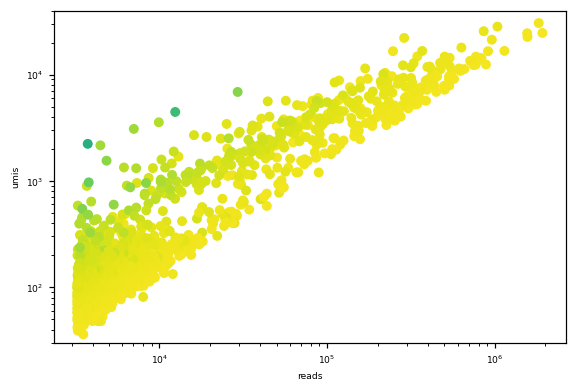

In [167]:
plt.scatter(sc_new.obs["raw_cb_freq"], sc_new.obs["total_UMIs"], s = 30, c = sc_new.obs["DedupRate"])
plt.xscale('log')
plt.yscale('log')
plt.xlabel("reads")
plt.ylabel("umis")
plt.ylim(30,40000)

(30, 40000)

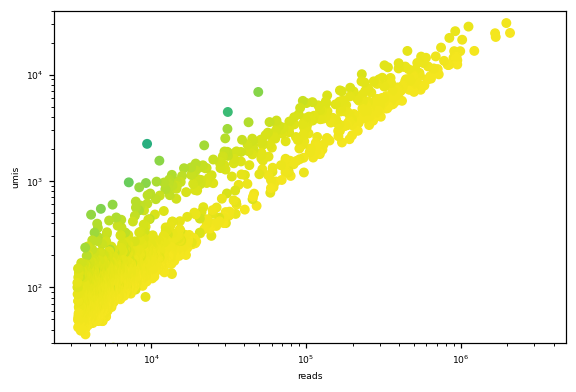

In [168]:
plt.scatter(sc_new.obs["CorrectedReads"], sc_new.obs["total_UMIs"], s = 30, c = sc_new.obs["DedupRate"])
plt.xscale('log')
plt.yscale('log')
plt.xlabel("reads")
plt.ylabel("umis")
plt.ylim(30,40000)

In [87]:
%%bash
tar czf ./figs.tar.gz ./figs/*.svg